In [2]:
import os
import json
import torch
import numpy as np
import matplotlib.pyplot as plt

from torch import nn, optim
from tqdm.notebook import tqdm
from text_encoder import TextEncoder
from text_decoder import TextDecoder
from easydict import EasyDict as edict
from fast_self_bleu import all_self_bleu
from latent_generator import LatentGenerator, SimpleLatentGenerator1, SimpleLatentGenerator2
from fast_bleu import all_bleu_with_common_refs
from latent_discriminator import LatentDiscriminator, SimpleLatentDiscriminator
from text_datasets import get_quora_texts_pretrained_vocab, get_emnlp_2017_news_pretrained_vocab
from utils import to_one_hot, QUORA_TEXT_PRETRAINED_VOCAB_VALID_SET_PATH, EMNLP_2017_NEWS_PRETRAINED_VOCAB_VALID_SET_PATH

In [14]:
def testing(output_dir):
    d_batch = 512
    d_noise = 100
    d_vocab = 27699
    num_epochs = 50
    start_epoch = 1
    d_gen_layers = 1
    gen_dropout = 0.5
    d_max_seq_len = 26
    d_gen_hidden = 512
    d_dis_hidden = 512
    d_text_feature = 512
    d_text_enc_cnn = 512
    d_text_enc_cnn = 512
    text_enc_dropout = 0.5
    text_enc_weights_path = 'new_text_enc.pth'
    text_dec_weights_path = 'faster_text_gen_v1.pth'
    lat_gen_weights_path = None # 'run_12_all/epoch_20_lat_gen.pth'
    lat_dis_weights_path = None # 'run_12_all/epoch_20_lat_dis.pth'
    lat_gen_opt_weights_path = None # 'run_12_all/epoch_20_lat_gen_opt.pth'
    lat_dis_opt_weights_path = None # 'run_12_all/epoch_20_lat_dis_opt.pth'
    references_path = QUORA_TEXT_PRETRAINED_VOCAB_VALID_SET_PATH

    os.makedirs(output_dir, exist_ok=True)

    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    dataset, loader = get_quora_texts_pretrained_vocab(split='train', d_batch=d_batch, should_pad=True, pad_to_length=d_max_seq_len)
    assert d_vocab == dataset.d_vocab
    end_token = dataset.end_token

    text_enc = TextEncoder(d_vocab=d_vocab, d_text_feature=d_text_feature, text_enc_dropout=text_enc_dropout, d_text_enc_cnn=d_text_enc_cnn).to(device)
    text_enc.load_state_dict(torch.load(text_enc_weights_path))
    text_dec = TextDecoder(d_vocab=d_vocab, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden, d_max_seq_len=d_max_seq_len, d_gen_layers=d_gen_layers, gen_dropout=gen_dropout, pad_token=dataset.pad_token, start_token=dataset.start_token, end_token=dataset.end_token).to(device)
    text_dec.load_state_dict(torch.load(text_dec_weights_path))

    lat_dis = LatentDiscriminator(d_text_feature=d_text_feature, d_dis_hidden=d_dis_hidden).to(device)
    if lat_dis_weights_path:
        lat_dis.load_state_dict(torch.load(lat_dis_weights_path))
#     lat_dis = SimpleLatentDiscriminator(d_text_feature=d_text_feature, d_dis_hidden=d_dis_hidden).to(device)
    lat_gen = LatentGenerator(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)
    if lat_gen_weights_path:
        lat_gen.load_state_dict(torch.load(lat_gen_weights_path))
#     lat_gen = SimpleLatentGenerator1(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)
#     lat_gen = SimpleLatentGenerator2(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)

    criterion = nn.BCEWithLogitsLoss()

    real_targets = torch.ones(d_batch, device=device)
    fake_targets = torch.zeros(d_batch, device=device)

    lat_gen_opt = optim.Adam(lat_gen.parameters())
    if lat_gen_opt_weights_path:
        lat_gen_opt.load_state_dict(torch.load(lat_gen_opt_weights_path))
    lat_dis_opt = optim.Adam(lat_dis.parameters())
    if lat_dis_opt_weights_path:
        lat_dis_opt.load_state_dict(torch.load(lat_dis_opt_weights_path))

    text_enc.train()
    text_dec.train()
    lat_dis.train()
    lat_gen.train()

    references = torch.load(references_path)[:5000]

    def remove_helper(xs):
        xs = xs[1:]
        for i, x in enumerate(xs):
            if x == end_token:
                return xs[:i]
        return xs
    def remove_special_tokens(xss):
        if isinstance(xss, torch.Tensor):
            xss = xss.tolist()
        return [remove_helper(xs) for xs in xss]

    def get_avg_std_bleu(xss):
        xss = list(zip(*xss))
        return [(np.mean(xs), np.std(xs)) for xs in xss]

    fixed_noises = torch.randn(d_batch, d_noise, device=device)

    xs = []
    ys = [[] for _ in range(5)]
    ys_err = [[] for _ in range(5)]
    zs = [[] for _ in range(5)]
    zs_err = [[] for _ in range(5)]
    best_scores = [-1.0 for _ in range(5)]

    real_scores = []
    fake_scores = []
    gen_losses = []
    dis_losses = []

    for epoch in range(start_epoch, num_epochs+1):
        print('epoch:', epoch)
        epoch_real_score = 0.0
        epoch_fake_score = 0.0
        epoch_gen_loss = 0.0
        epoch_dis_loss = 0.0
        for i, batch in enumerate(tqdm(loader), start=1):
            real_texts, _ = batch
            real_texts = real_texts.to(device)
            real_text_features = text_enc(to_one_hot(real_texts, d_vocab))
            noises = torch.randn(d_batch, d_noise, device=device)
            fake_text_features = lat_gen(noises)

            # train dis
            lat_dis.zero_grad()
            valids = lat_dis(real_text_features)
            dis_real_loss = criterion(valids, real_targets)
            dis_real_loss.backward()
            epoch_real_score += valids.mean().item()

            valids = lat_dis(fake_text_features.detach())
            dis_fake_loss = criterion(valids, fake_targets)
            dis_fake_loss.backward()
            epoch_fake_score += valids.mean().item()
            lat_dis_opt.step()

            dis_loss = 0.5 * dis_real_loss.item() + 0.5 * dis_fake_loss.item()
            epoch_dis_loss += dis_loss

            # train gen
            lat_gen.zero_grad()
            valids = lat_dis(fake_text_features)
            gen_loss = criterion(valids, real_targets)
            gen_loss.backward()
            lat_gen_opt.step()

            epoch_gen_loss += gen_loss.item()
#             break

        epoch_real_score /= len(loader)
        epoch_fake_score /= len(loader)
        epoch_gen_loss /= len(loader)
        epoch_dis_loss /= len(loader)
        real_scores.append(epoch_real_score)
        fake_scores.append(epoch_fake_score)
        gen_losses.append(epoch_gen_loss)
        dis_losses.append(epoch_dis_loss)

        print('saving models:')
        torch.save(lat_gen.state_dict(), f'{output_dir}/epoch_{epoch}_lat_gen.pth')
        torch.save(lat_dis.state_dict(), f'{output_dir}/epoch_{epoch}_lat_dis.pth')
        torch.save(lat_gen_opt.state_dict(), f'{output_dir}/epoch_{epoch}_lat_gen_opt.pth')
        torch.save(lat_dis_opt.state_dict(), f'{output_dir}/epoch_{epoch}_lat_dis_opt.pth')

        print('generate fake texts:')
        with torch.no_grad():
            lat_gen.eval()
            text_dec.eval()
            fake_texts = text_dec(lat_gen(fixed_noises))[0]
            lat_gen.train()
            text_dec.train()
        fake_text_strs = [dataset.decode_caption(fake_text) for fake_text in fake_texts]
        print('\n'.join(fake_text_strs[:4]))
        with open(f'{output_dir}/epoch_{epoch}.txt', 'w') as f:
            f.write('\n'.join(fake_text_strs))

        print('calculate bleu and self bleu:')
        fake_texts = remove_special_tokens(fake_texts)
        bleu_scores = get_avg_std_bleu(all_bleu_with_common_refs(references, fake_texts, 5))
        self_bleu_scores = get_avg_std_bleu(all_self_bleu(fake_texts, 5))
        xs.append(epoch)
        for y1, y2, (x1, x2) in zip(ys, ys_err, bleu_scores):
            y1.append(x1)
            y2.append(x2)
        for z1, z2, (x1, x2) in zip(zs, zs_err, self_bleu_scores):
            z1.append(x1)
            z2.append(x2)

        print('plot and save metrics:')
        plt.close('all')
        plt.figure(figsize=(20, 4))
        plt.subplot(1, 4, 1)
        plt.plot(torch.arange(1, epoch+1), list(zip(gen_losses, dis_losses)))
        plt.xlabel('epochs')
        plt.legend(['gen', 'dis'])
        plt.title('Losses')
        plt.subplot(1, 4, 2)
        plt.plot(torch.arange(1, epoch+1), list(zip(real_scores, fake_scores)))
        plt.xlabel('epochs')
        plt.legend(['real', 'fake'])
        plt.title('Discriminator scores')
        plt.subplot(1, 4, 3)
        for y1, y2 in zip(ys, ys_err):
            plt.errorbar(xs, y1, y2, fmt='-o')
        plt.xlabel('epochs')
        plt.legend(list(range(1, 6)))
        plt.title('BLEU')
        plt.subplot(1, 4, 4)
        for z1, z2 in zip(zs, zs_err):
            plt.errorbar(xs, z1, z2, fmt='-o')
        plt.xlabel('epochs')
        plt.legend(list(range(1, 6)))
        plt.title('Self BLEU')
        plt.savefig(f'{output_dir}/metrics.png')
        plt.show()
        metrics = dict(gen_losses=gen_losses, dis_losses=dis_losses, real_scores=real_scores, fake_scores=fake_scores, bleu_mean=ys, bleu_std=ys_err, self_bleu_mean=zs, self_bleu_std=zs_err)
        with open(f'{output_dir}/metrics.json', 'w') as f:
            json.dump(metrics, f)

        print('#'*64)

# Single batch

epoch: 1



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 25961.82it/s]


plot and save metrics:


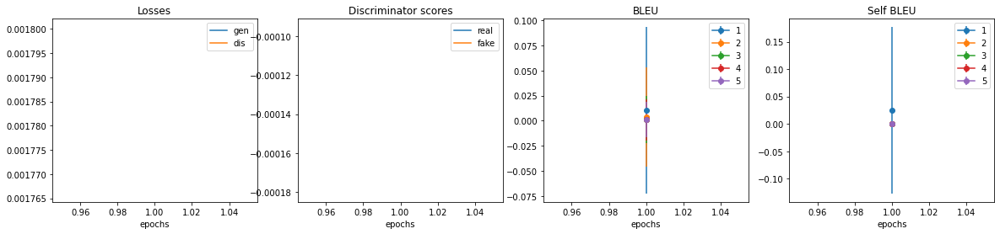

################################################################
epoch: 2



saving models:
generate fake texts:
<SOS> What are some ways to make new more as a popular fix ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 498.98it/s]


plot and save metrics:


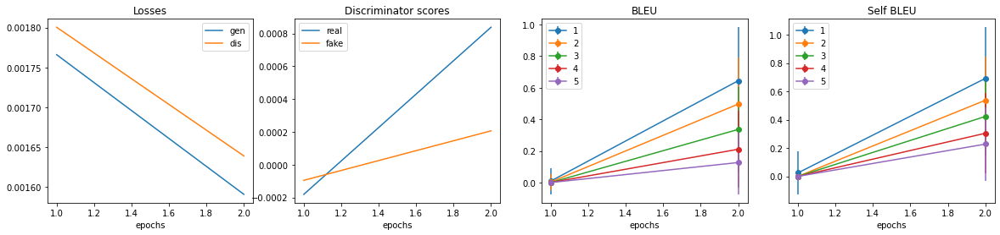

################################################################
epoch: 3



saving models:
generate fake texts:
<SOS> What are the best exercises to burn questions ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What do I need to do to get into your the city of missing ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the best ways to speed up Mercury UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the best ways to market more money in ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 289.66it/s]


plot and save metrics:


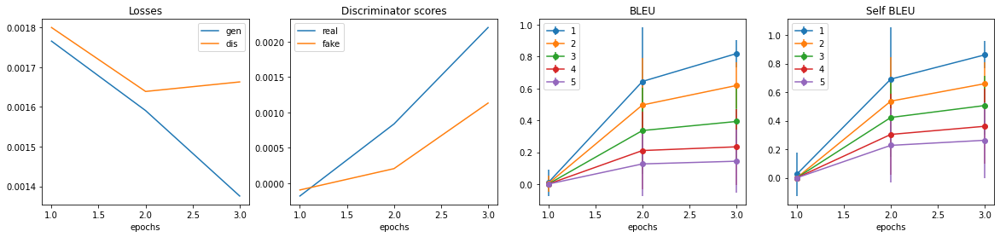

################################################################
epoch: 4



saving models:
generate fake texts:
<SOS> What are some ways to Shopify Asians ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are some of the best tricks and a things that I can be in a GVM from a new car ? <EOS> <PAD> <PAD>
<SOS> How do I reformed a month ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Can you have any polka jet and/or Sportspersons for partition of British based long ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 265.51it/s]


plot and save metrics:


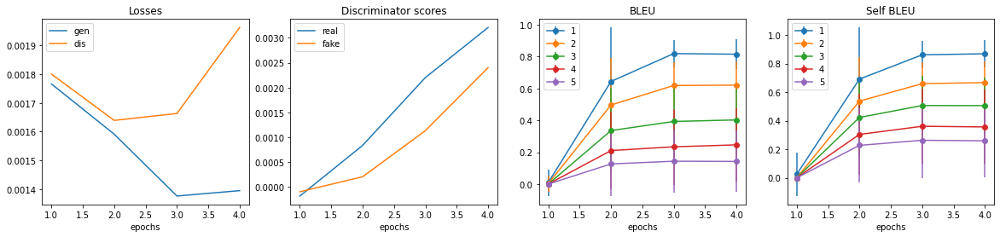

################################################################
epoch: 5



saving models:
generate fake texts:
<SOS> What is the best strategy for the specific improved of data ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Where can I get the best UNK ever necessary in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are some interesting ways to 10 ( discussion ) someone in their flight ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the best ways to post `` may in a great Computer graphic hacker ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 243.57it/s]


plot and save metrics:


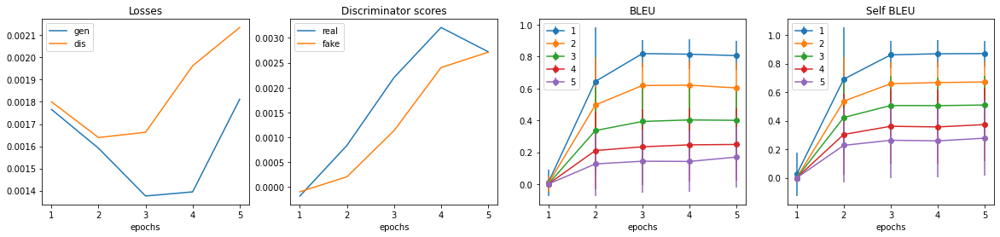

################################################################
epoch: 6



saving models:
generate fake texts:
<SOS> What are the most efficient methods for a increase to his wife ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I get the zodiac sign hard with Bose ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to access the one ignorant sentence ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can we Hogwarts two questions on Quora ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 264.20it/s]


plot and save metrics:


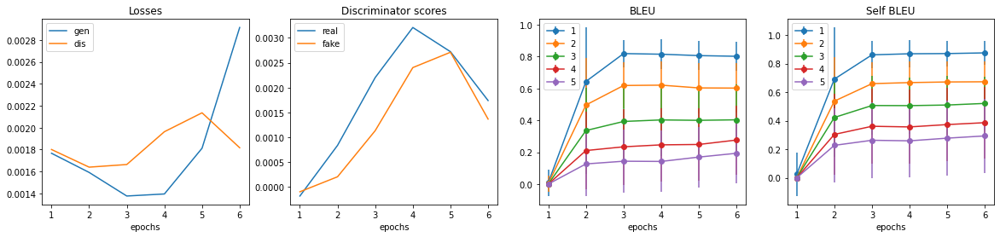

################################################################
epoch: 7



saving models:
generate fake texts:
<SOS> What is the easiest way to believe a UNK 's idea about life ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to reset my instagram account when will help books in the future ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to move on to New people ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What should a and how does I find the last name one day ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 258.23it/s]


plot and save metrics:


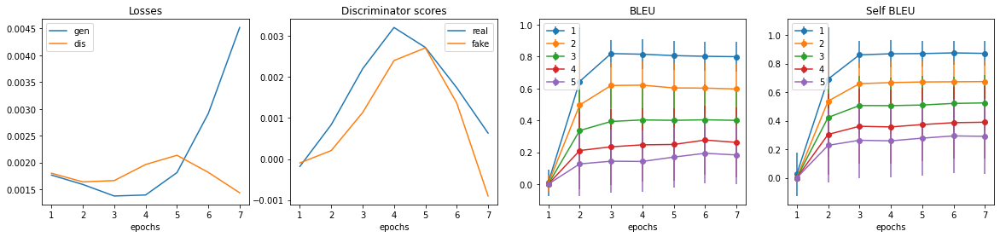

################################################################
epoch: 8



saving models:
generate fake texts:
<SOS> What is the best wallets ever made in shift ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to have good focused on UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to teach my 4-5 year old to play chess ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the one thing that makes a person doing his first time ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 259.85it/s]


plot and save metrics:


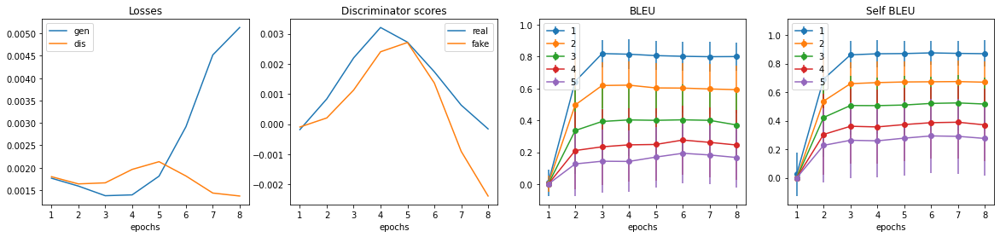

################################################################
epoch: 9



saving models:
generate fake texts:
<SOS> What is the one month that a arranged person become makes ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the way to cheat on bra ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to remember the world from main books ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the most important thing about a good ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 267.48it/s]


plot and save metrics:


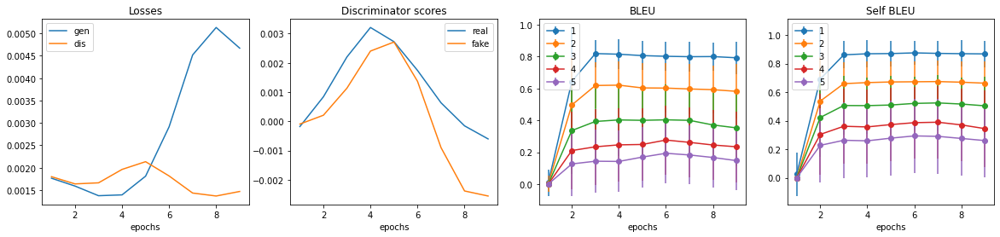

################################################################
epoch: 10



saving models:
generate fake texts:
<SOS> How do I connect to an individual post all its ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do you talk from about old psychopaths and Game of Thrones ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is an effective way to grow jealous ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to control your thoughts ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 270.27it/s]


plot and save metrics:


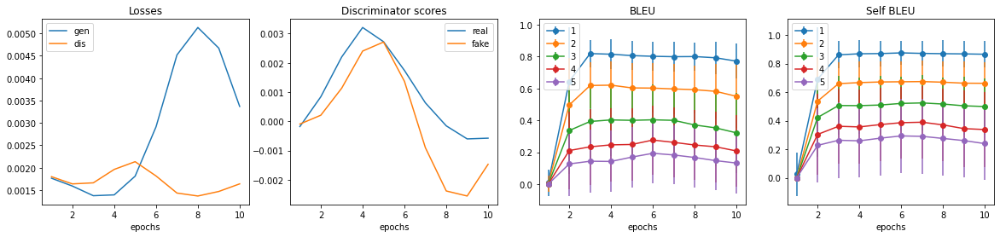

################################################################
epoch: 11



saving models:
generate fake texts:
<SOS> What is the most efficient way to and unique eukaryotes ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can i PayPal abroad ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to start learning FaceTime ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to understand new concepts quickly ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 477.03it/s]


plot and save metrics:


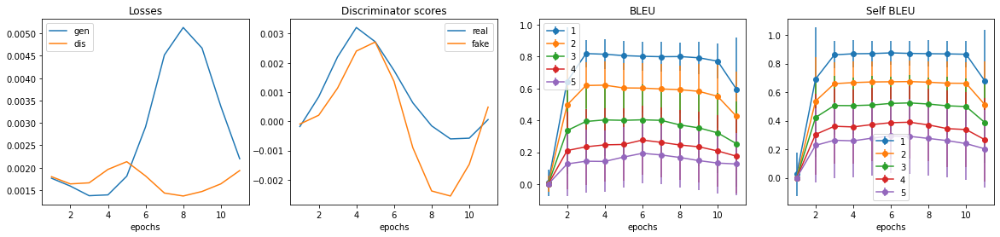

################################################################
epoch: 12



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 14333.66it/s]


plot and save metrics:


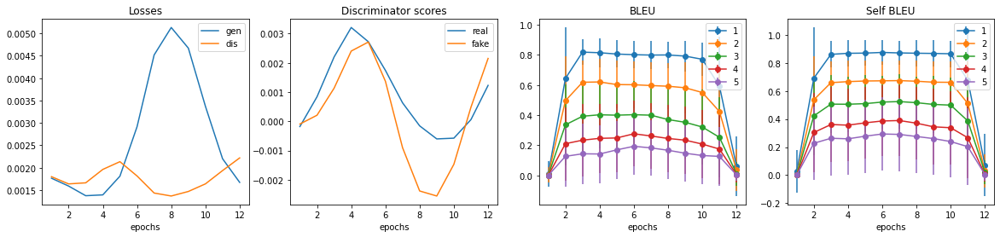

################################################################
epoch: 13



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 24933.92it/s]


plot and save metrics:


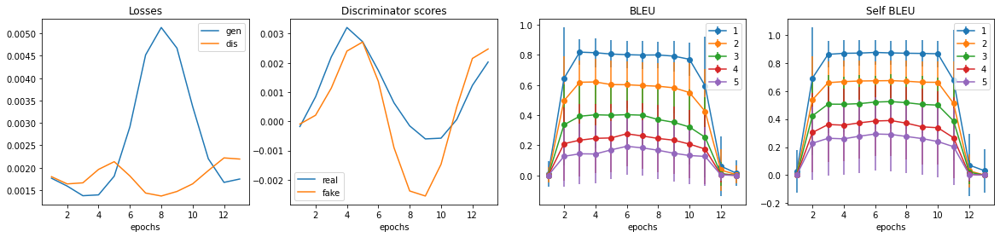

################################################################
epoch: 14



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 22617.95it/s]


plot and save metrics:


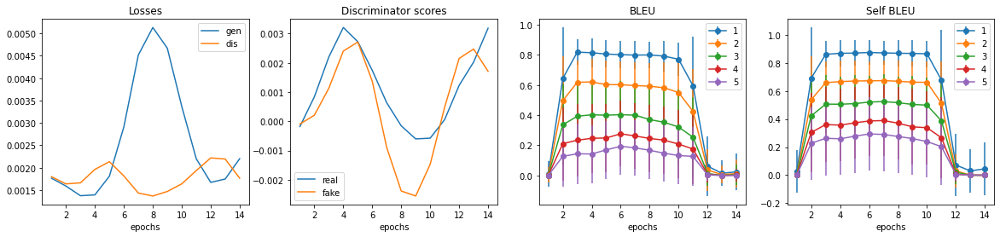

################################################################
epoch: 15



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 22727.82it/s]


plot and save metrics:


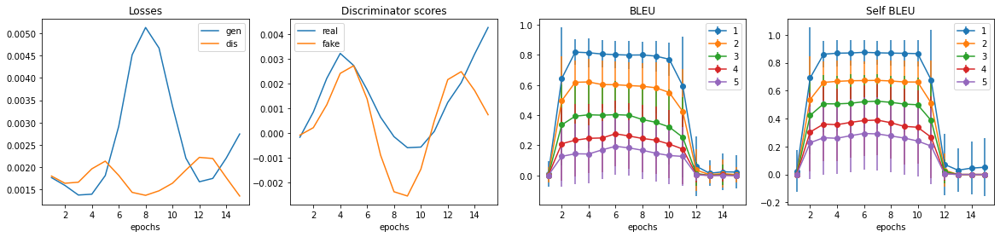

################################################################
epoch: 16



saving models:
generate fake texts:
to player ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 25914.82it/s]


plot and save metrics:


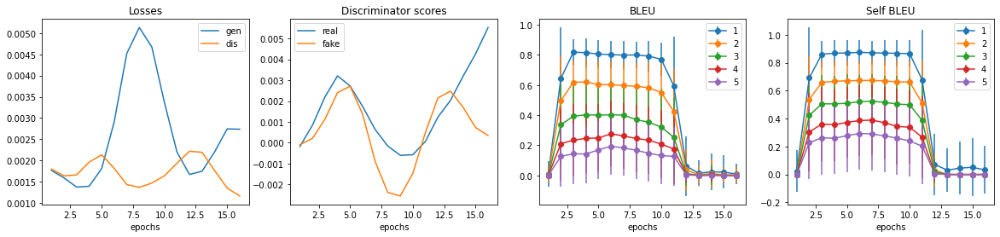

################################################################
epoch: 17



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 26394.51it/s]


plot and save metrics:


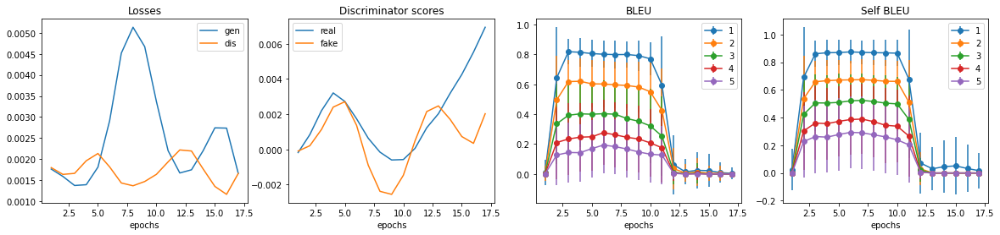

################################################################
epoch: 18



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to go through all psychic ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 15578.18it/s]


plot and save metrics:


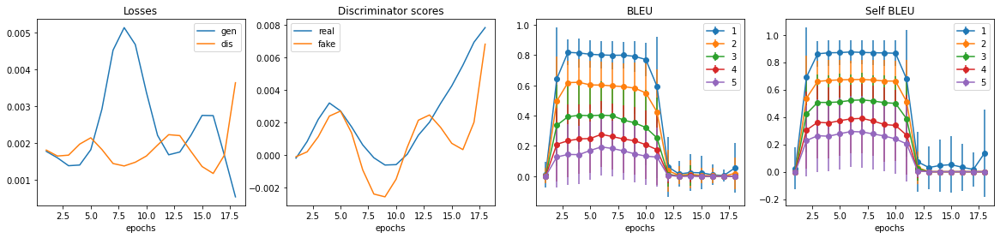

################################################################
epoch: 19



saving models:
generate fake texts:
of ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to read ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 6169.85it/s]


plot and save metrics:


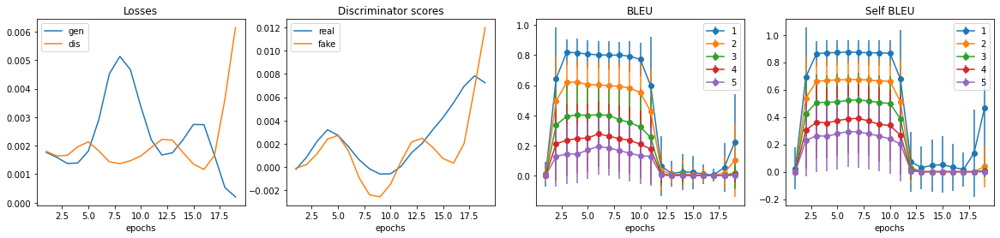

################################################################
epoch: 20



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
flow ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to cook your sister ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
App ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 2166.14it/s]


plot and save metrics:


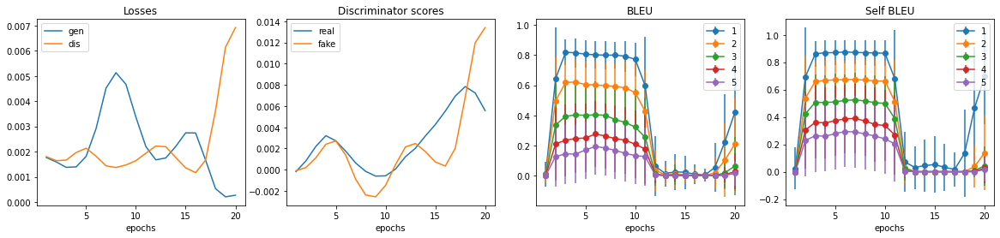

################################################################


In [3]:
!rm -rf run_12/
testing(output_dir='run_12')

In [4]:
!ls -lh run_12/

total 251M
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:05 epoch_10_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:05 epoch_10_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:05 epoch_10_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:05 epoch_10_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  70K May 27 10:05 epoch_10.txt
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:05 epoch_11_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:05 epoch_11_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:05 epoch_11_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:05 epoch_11_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  72K May 27 10:05 epoch_11.txt
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:05 epoch_12_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:05 epoch_12_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:05 epoch_12_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:05 epoch_12_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter 

In [3]:
!tar -c -z -f run_12_test.tgz run_12/

epoch: 1



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 24780.56it/s]


plot and save metrics:


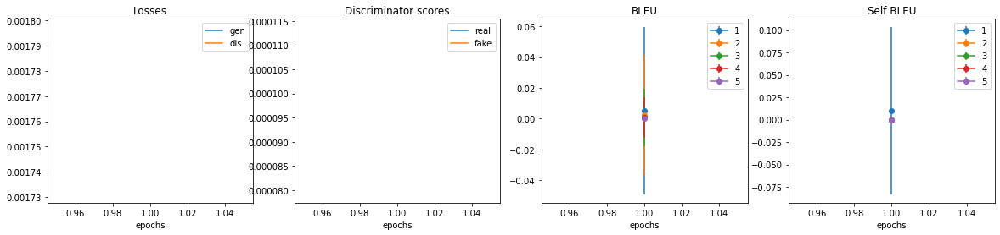

################################################################
epoch: 2



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
and scope for it ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 19622.65it/s]


plot and save metrics:


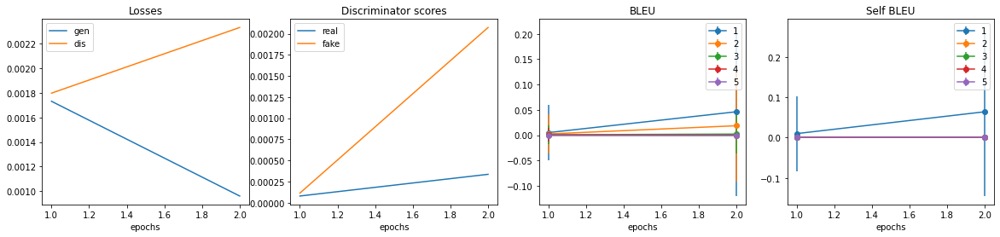

################################################################
epoch: 3



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
around US ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
GBO ? How did it be UNK by useful ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 3932.98it/s]


plot and save metrics:


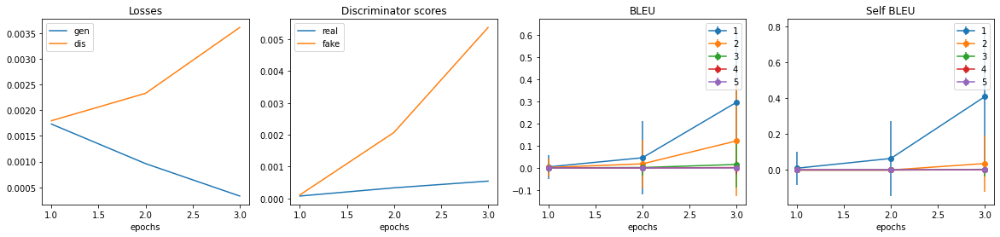

################################################################
epoch: 4



saving models:
generate fake texts:
's addicted ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
or weirdest think all CTO ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
and abstract Heisenberg 's asthma ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
lesbian ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1626.20it/s]


plot and save metrics:


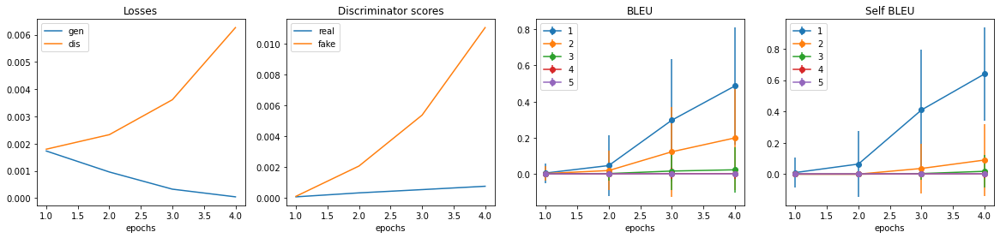

################################################################
epoch: 5



saving models:
generate fake texts:
Love treat ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
as a TIME fuel everything ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
found `` poorer in the convince Of economics ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1209.41it/s]


plot and save metrics:


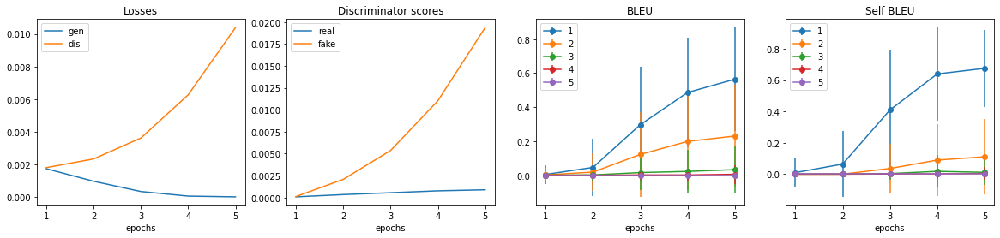

################################################################
epoch: 6



saving models:
generate fake texts:
around planned enterprise out of the Jewish powers ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
or both effects ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
typical boron sleep ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
beginning ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1085.24it/s]


plot and save metrics:


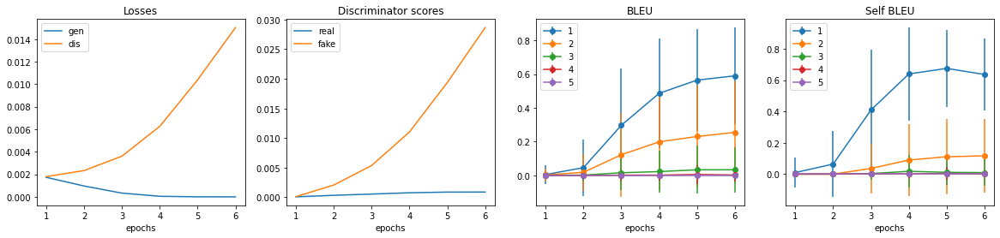

################################################################
epoch: 7



saving models:
generate fake texts:
would or Washing asleep ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
V natural ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
or understanding Forex lesbian ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
29th improve general deodorant ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 935.04it/s]


plot and save metrics:


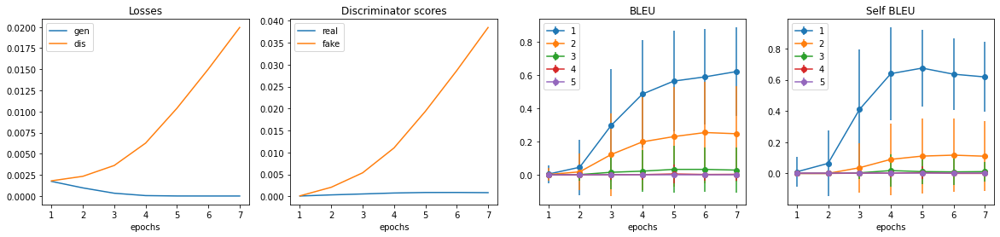

################################################################
epoch: 8



saving models:
generate fake texts:
it UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
In which principles is making consequences ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
UNK unsupervised done ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
or weather acoustic dogs ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1017.26it/s]


plot and save metrics:


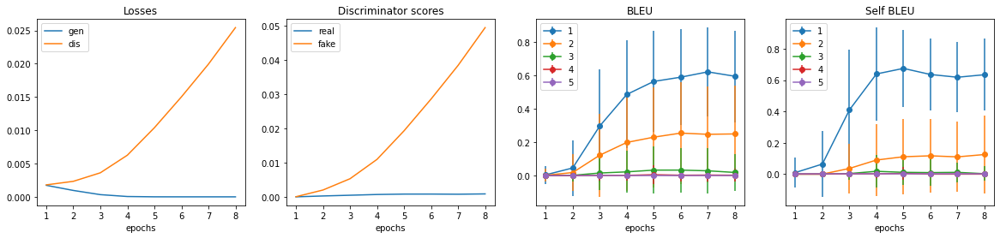

################################################################
epoch: 9



saving models:
generate fake texts:
in 666 ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
unhealthy or text ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
doesn snapchat ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
which requires successful watches face ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1019.43it/s]


plot and save metrics:


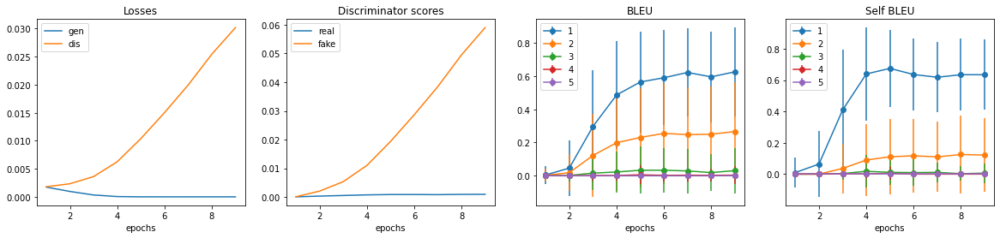

################################################################
epoch: 10



saving models:
generate fake texts:
TATA training ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
sport for typically remain UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
today 's about flag ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
YouTuber and would get paid to US majors change in America ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 950.63it/s]


plot and save metrics:


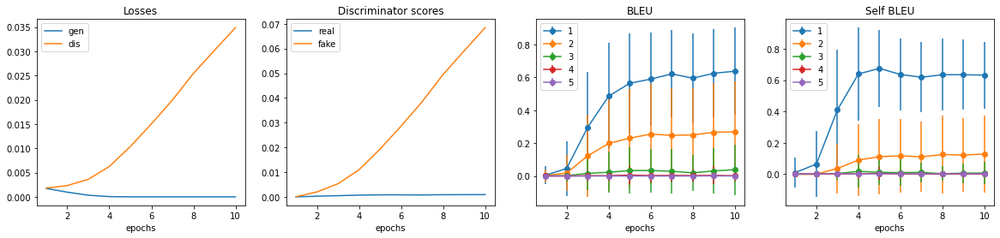

################################################################
epoch: 11



saving models:
generate fake texts:
sex repercussions ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
impact as a Muslim computer ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Laos 's campus ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
or least Snapchat trait ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 917.72it/s]


plot and save metrics:


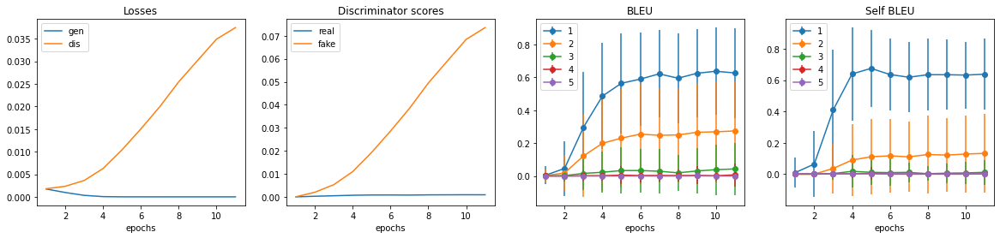

################################################################
epoch: 12



saving models:
generate fake texts:
tips as analyst and default ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
or 11 theories if I have no been fighting ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Design humiliated intrusive to AM ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
damaging to identity decide ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 910.38it/s]


plot and save metrics:


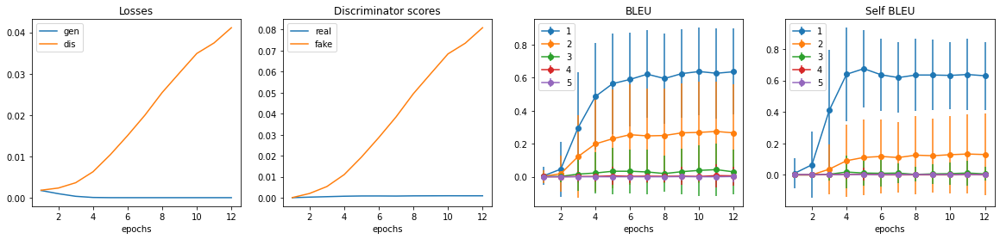

################################################################
epoch: 13



saving models:
generate fake texts:
or cousin passport Sweden ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
photographs to telescope ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to list of dying ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
or witnessed jee ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 885.85it/s]


plot and save metrics:


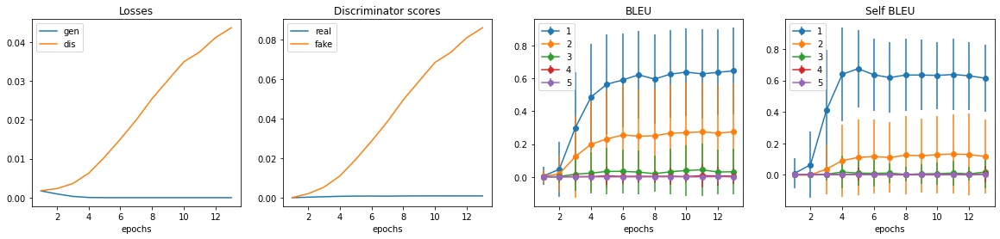

################################################################
epoch: 14



saving models:
generate fake texts:
per UGC beam debate ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
or understanding insurance instead of huge hungry ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
correctly ? hurt my hips change gender after us ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
borderline personality disorder ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 860.64it/s]


plot and save metrics:


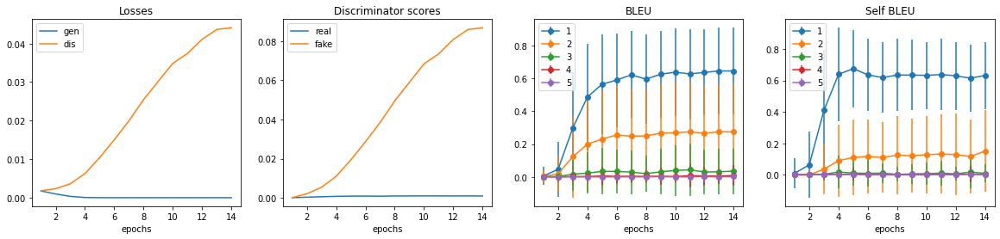

################################################################
epoch: 15



saving models:
generate fake texts:
ISPs actually prepaid and your secret doing ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
observation ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Ensure happened ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
The attractive name in School A ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 883.74it/s]


plot and save metrics:


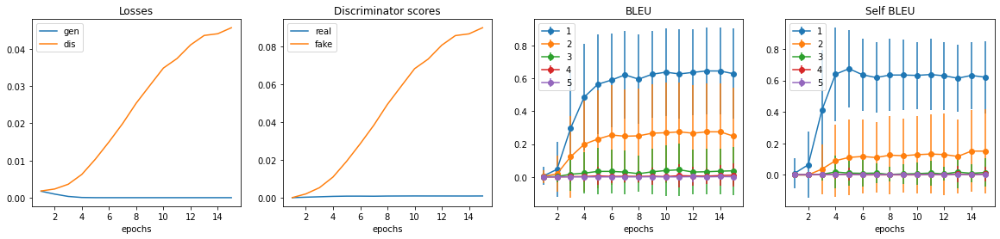

################################################################
epoch: 16



saving models:
generate fake texts:
native language ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
mutual fund ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
a brass share ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
XP collided ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 870.03it/s]


plot and save metrics:


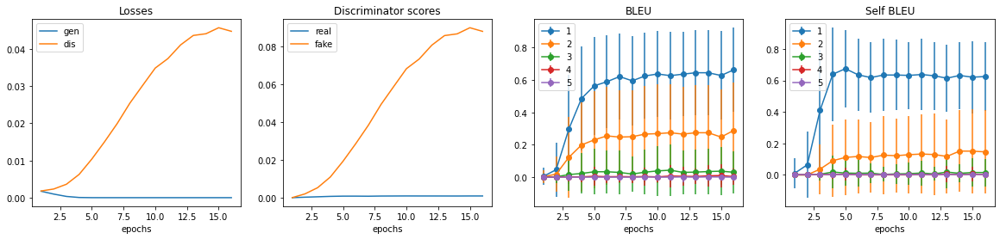

################################################################
epoch: 17



saving models:
generate fake texts:
or realize that good organic chemistry ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
quickly ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
out exercise game ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calm down ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 900.87it/s]


plot and save metrics:


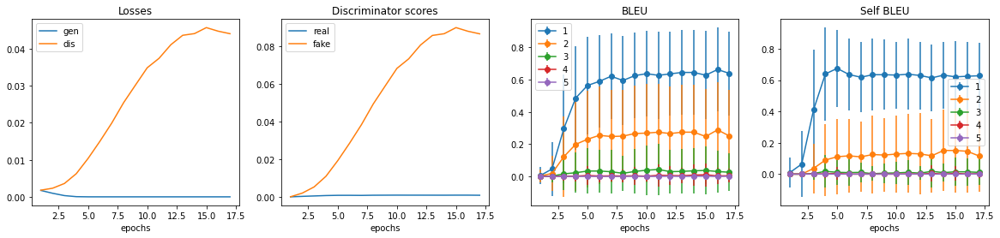

################################################################
epoch: 18



saving models:
generate fake texts:
and detailed instagram is the final Pug/Cavalier ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
when not ready disable my step ( fake Courses ) ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
UNK random equations ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Mongolia ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 975.66it/s]


plot and save metrics:


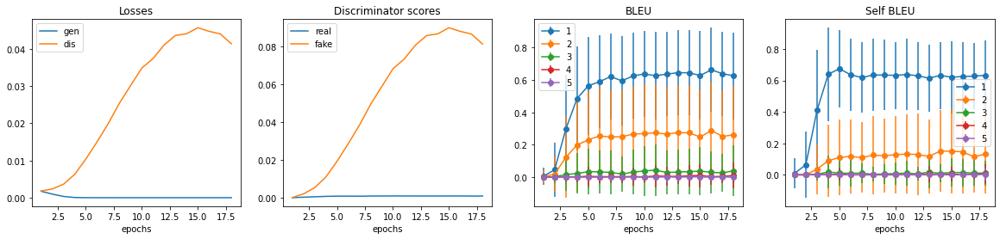

################################################################
epoch: 19



saving models:
generate fake texts:
in proof framework ? What purpose are they serve ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Hawaii ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
intuitive one ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
grams for most a source ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 876.17it/s]


plot and save metrics:


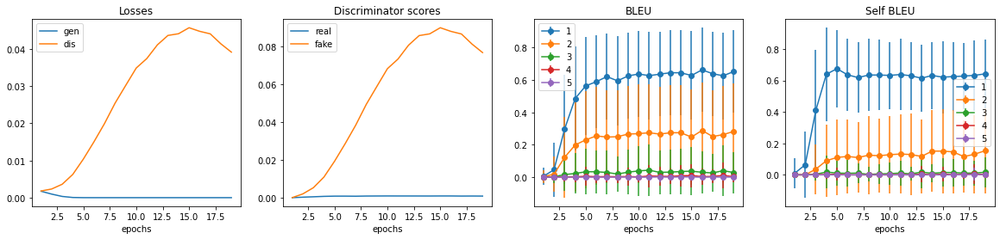

################################################################
epoch: 20



saving models:
generate fake texts:
a vast GoPro 5 ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Which cooking body ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
or Philippine significance ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
When starting an applicable ? Which one should report like this ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 995.71it/s]


plot and save metrics:


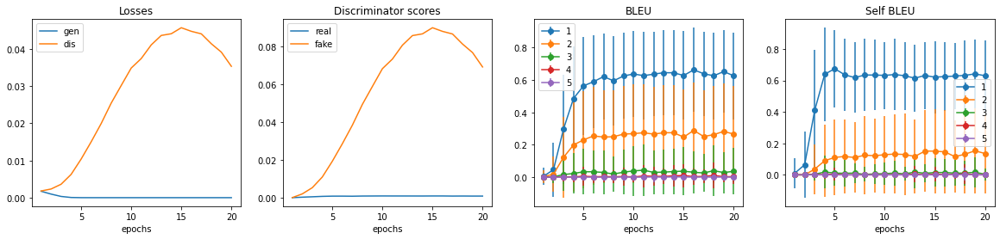

################################################################


In [6]:
!rm -rf run_12_dbg1/
testing(output_dir='run_12_dbg1')

In [11]:
!ls -lh run_12_dbg1/

total 130M
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:16 epoch_10_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:16 epoch_10_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:16 epoch_10_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:16 epoch_10_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  76K May 27 10:16 epoch_10.txt
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:16 epoch_11_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:16 epoch_11_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:16 epoch_11_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:16 epoch_11_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  76K May 27 10:16 epoch_11.txt
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:17 epoch_12_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:17 epoch_12_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:17 epoch_12_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 10:17 epoch_12_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter 

In [13]:
!tar -c -z -f run_12_dbg1.tgz run_12_dbg1/

epoch: 1



saving models:
generate fake texts:
and come across ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in general ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
existing PV^ ? Is he still build ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
change ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1501.04it/s]


plot and save metrics:


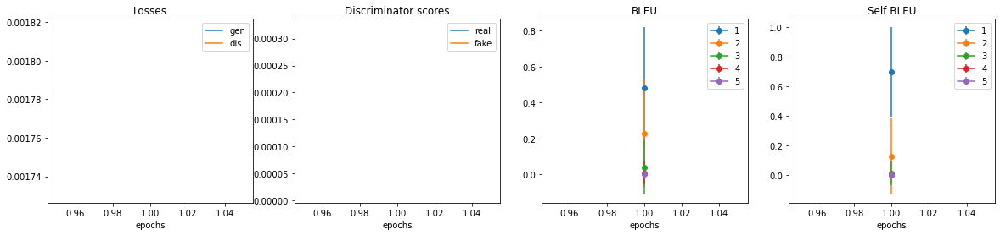

################################################################
epoch: 2



saving models:
generate fake texts:
. as a renewable way ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
at UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Do cracking UNK extracurricular tricks or incorporate ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
delivered UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1247.49it/s]


plot and save metrics:


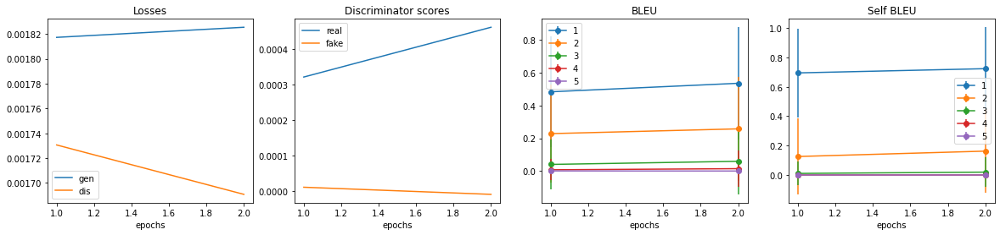

################################################################
epoch: 3



saving models:
generate fake texts:
is in Argentina animal ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in the alternative consciousness ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
alone ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
molecules ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1482.56it/s]


plot and save metrics:


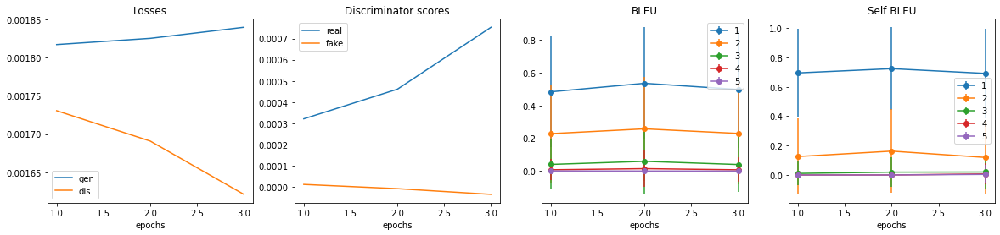

################################################################
epoch: 4



saving models:
generate fake texts:
’ s dark matter and why not existence ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
's chest ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
seduce the Matching ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
saddest ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1608.99it/s]


plot and save metrics:


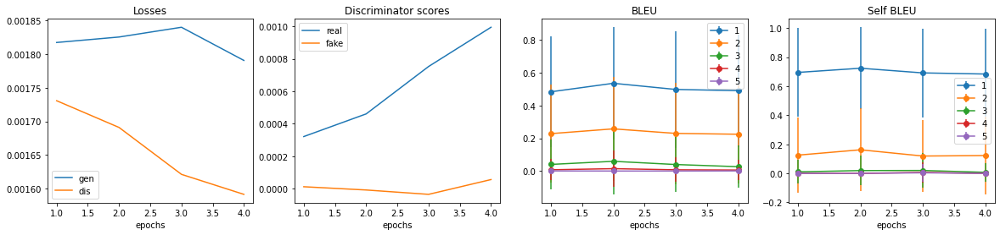

################################################################
epoch: 5



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in accept NASA for Pokemon UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
their gamechanger that would approach it for a reversed ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
groceries and the How in order that nothing can help us ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1310.51it/s]


plot and save metrics:


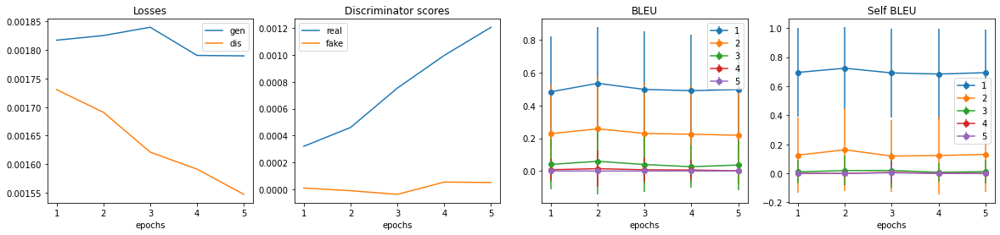

################################################################
epoch: 6



saving models:
generate fake texts:
VIT ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
for instead of hypnosis ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
resources considered one and aloe vera on Quantum anything ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
primary UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1446.21it/s]


plot and save metrics:


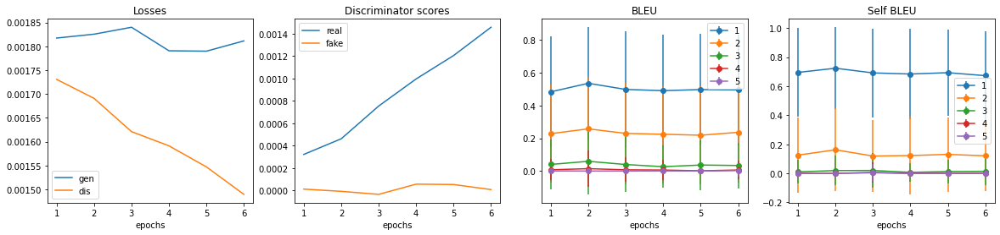

################################################################
epoch: 7



saving models:
generate fake texts:
or in bills ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
at some korean ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
too DU ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
black a drinking any SEBI ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1394.69it/s]


plot and save metrics:


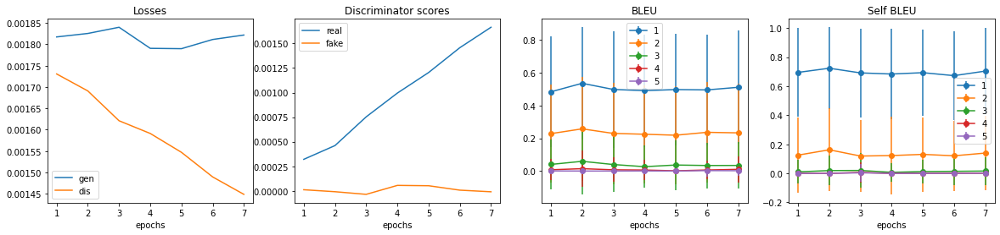

################################################################
epoch: 8



saving models:
generate fake texts:
eukaryotes ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in treatments ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
typing ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
color ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1701.30it/s]


plot and save metrics:


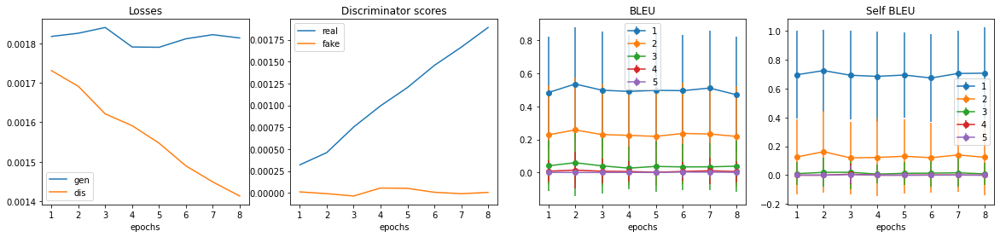

################################################################
epoch: 9



saving models:
generate fake texts:
workout without replacing Democratic ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in leaked like Russia ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
powers ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
give your favourite Olympics ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1467.04it/s]


plot and save metrics:


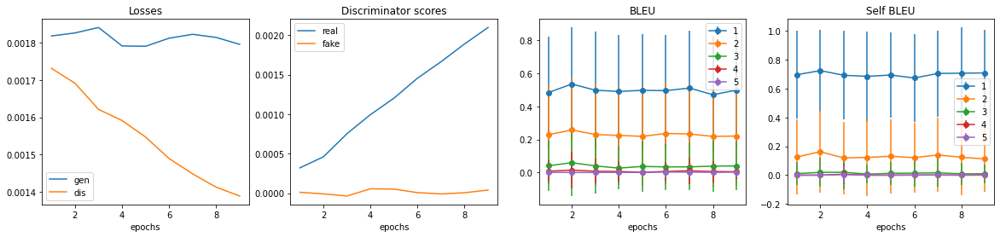

################################################################
epoch: 10



saving models:
generate fake texts:
blogging ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
's ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
public responsibilities ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
motto ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1474.30it/s]


plot and save metrics:


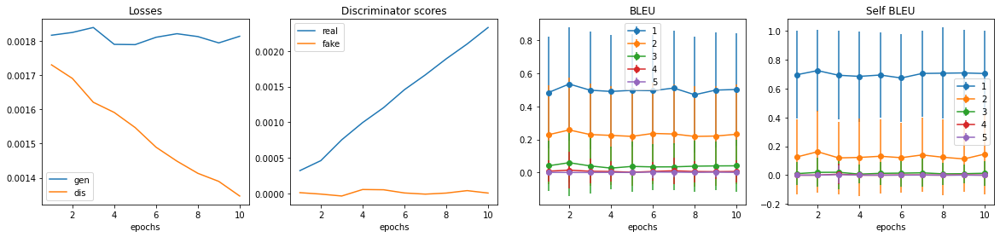

################################################################
epoch: 11



saving models:
generate fake texts:
design ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
on vegetarian ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
electrical engineering ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
help you and have the special same <SOS> What are some of the best common on Hong Kong and become least can UNK ever ? <EOS>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1381.32it/s]


plot and save metrics:


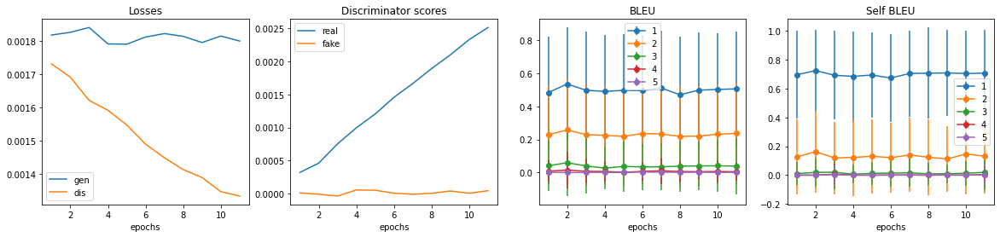

################################################################
epoch: 12



saving models:
generate fake texts:
as mathematical helping ? Why or why not ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
problems ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculator ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
up ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1384.89it/s]


plot and save metrics:


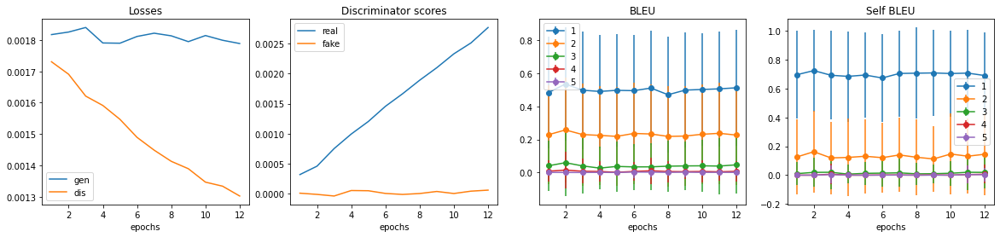

################################################################
epoch: 13



saving models:
generate fake texts:
and replace one memory ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in UNK ? UNK ? UNK this did not be nostalgic like ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
terms of arms ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Facebook ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1555.67it/s]


plot and save metrics:


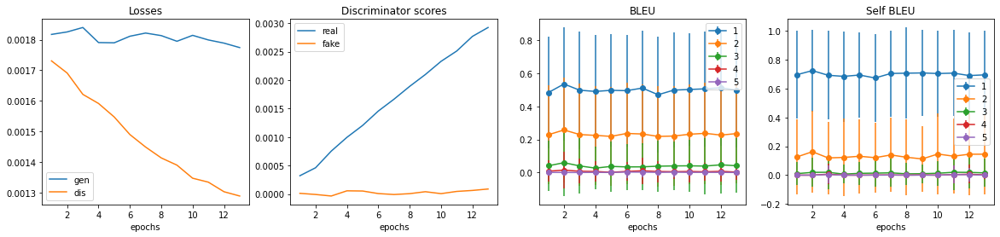

################################################################
epoch: 14



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
on creatures and why do you prepare and effectively do IAS too much ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
triple talaq ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
intrinsic ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1496.64it/s]


plot and save metrics:


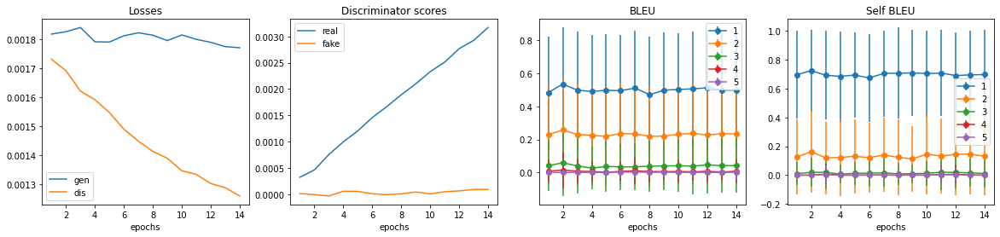

################################################################
epoch: 15



saving models:
generate fake texts:
mention that keeps laugh in related to Hindu population on Razor Hollywood ? Can anyone laws so they say questions ? <EOS> <PAD> <PAD> <PAD> <PAD>
on pump ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
eradication ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
album ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1526.58it/s]


plot and save metrics:


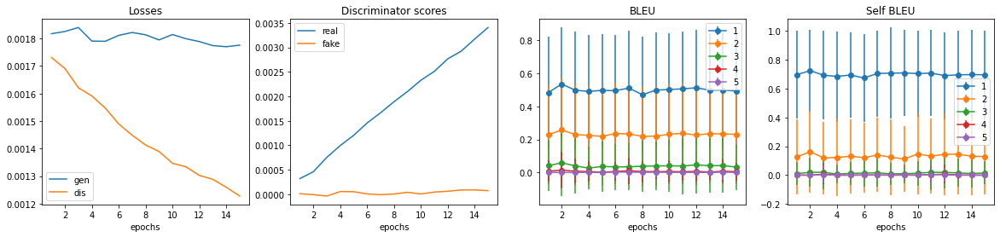

################################################################
epoch: 16



saving models:
generate fake texts:
in physics ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
and banks ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
gulmohar Dumbledore ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Asha pleasure ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1537.32it/s]


plot and save metrics:


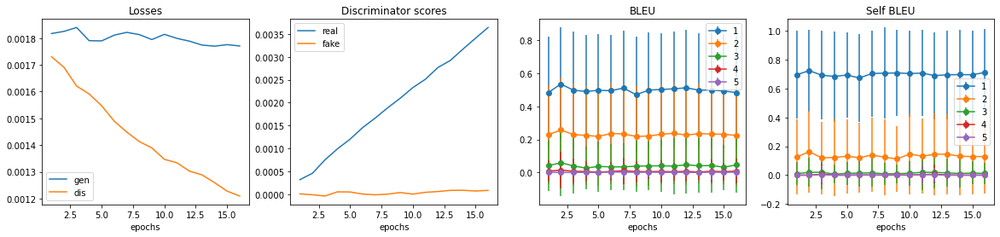

################################################################
epoch: 17



saving models:
generate fake texts:
Financial and UNK under UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
on PM ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
install book ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
beer work ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1495.78it/s]


plot and save metrics:


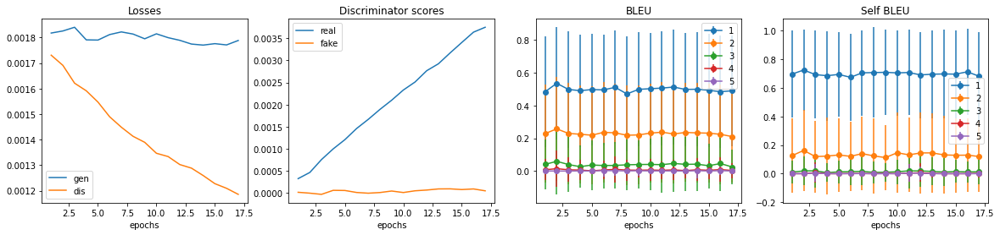

################################################################
epoch: 18



saving models:
generate fake texts:
as the right ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in a ticket ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Shaving ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
integrate all the color ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1518.19it/s]


plot and save metrics:


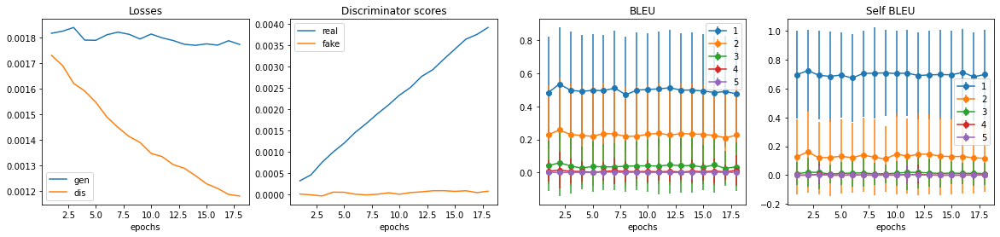

################################################################
epoch: 19



saving models:
generate fake texts:
of am spherical . What do I need this ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
for NASA ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Volvo ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
total ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1517.37it/s]


plot and save metrics:


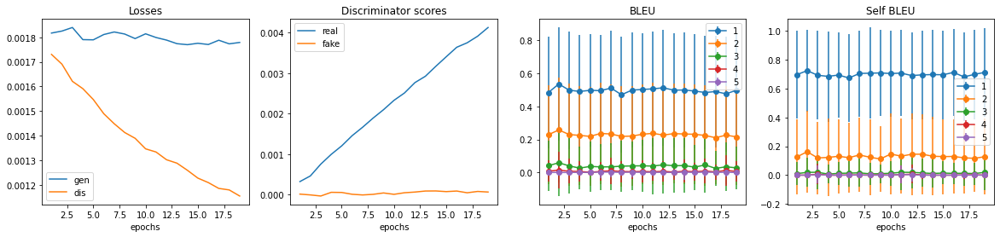

################################################################
epoch: 20



saving models:
generate fake texts:
and advantages will go to gender ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in a budget ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
murder ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
policies in the Duncan and Super Margaret journalist creepiest or can it ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1441.20it/s]


plot and save metrics:


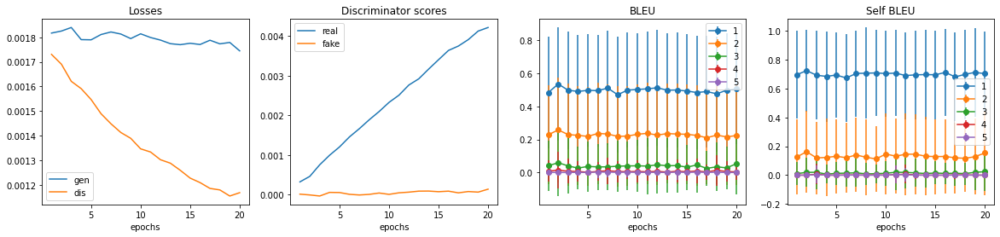

################################################################


In [3]:
!rm -rf run_12_dbg2/
testing(output_dir='run_12_dbg2')

In [4]:
!ls -lh run_12_dbg2/

total 9.7M
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:28 epoch_10_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:28 epoch_10_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:28 epoch_10_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:28 epoch_10_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  76K May 27 10:28 epoch_10.txt
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:28 epoch_11_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:28 epoch_11_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:28 epoch_11_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:28 epoch_11_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  76K May 27 10:28 epoch_11.txt
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:28 epoch_12_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:28 epoch_12_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:28 epoch_12_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:28 epoch_12_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter 

In [5]:
!tar -c -z -f run_12_dbg2.tgz run_12_dbg2/

epoch: 1



saving models:
generate fake texts:
to strategy this likes ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
familiar with partaken in apps ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
down ? How did they start up ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
lock in the iodine scariest ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1634.74it/s]


plot and save metrics:


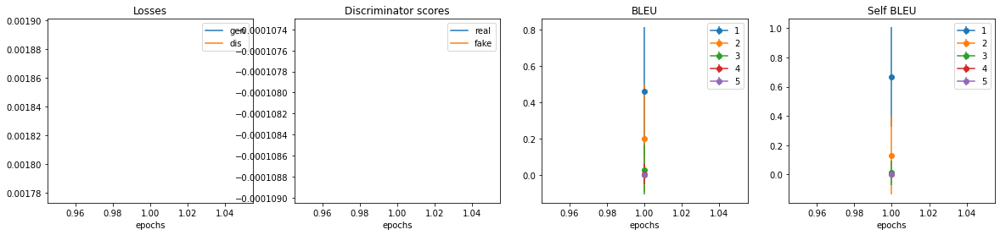

################################################################
epoch: 2



saving models:
generate fake texts:
from higher to The First product want to meet independent ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
line ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
as a human machine ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
close to function in mystery ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1529.74it/s]


plot and save metrics:


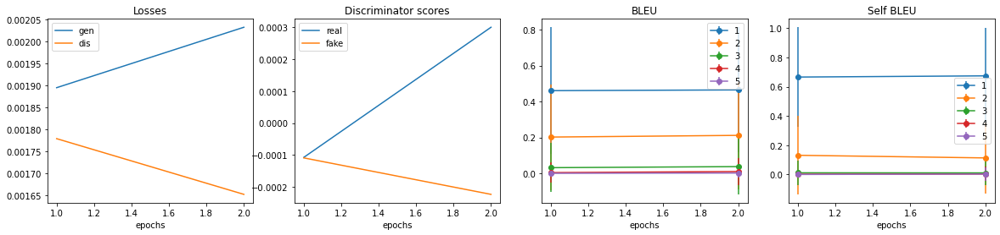

################################################################
epoch: 3



saving models:
generate fake texts:
for unusual first testing ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to plugin ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
meal ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
still and European his notifications ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1460.19it/s]


plot and save metrics:


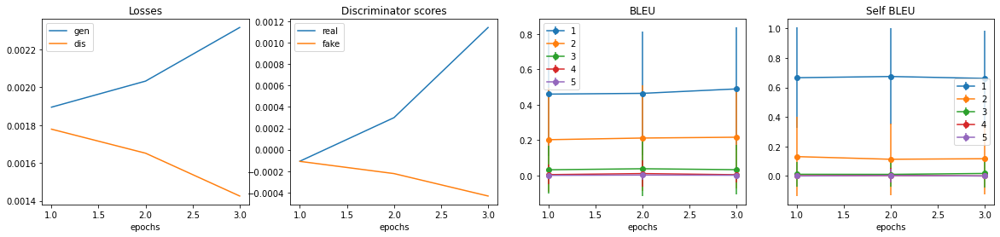

################################################################
epoch: 4



saving models:
generate fake texts:
testing ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
elephant ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
as a math girl ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
really with UNK in economic expression which Is still inauguration ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1571.82it/s]


plot and save metrics:


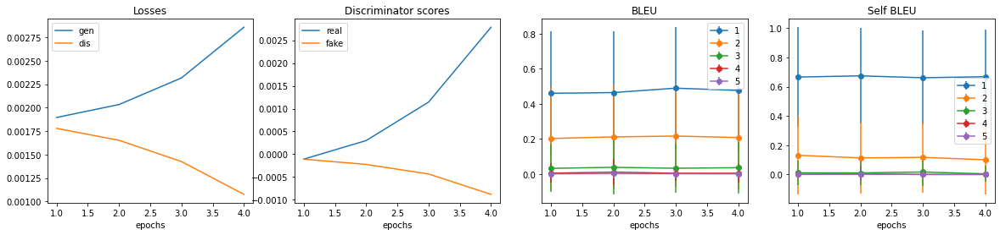

################################################################
epoch: 5



saving models:
generate fake texts:
with RBI possible UNK of lost phone ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
not ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
from richest Director attack ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
- immediately ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1753.90it/s]


plot and save metrics:


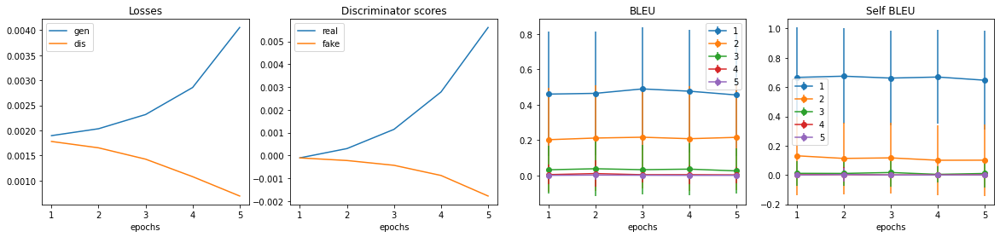

################################################################
epoch: 6



saving models:
generate fake texts:
to conductors and Christie name on Labrador ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
anxiety ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
without sitting at room ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
win ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1656.33it/s]


plot and save metrics:


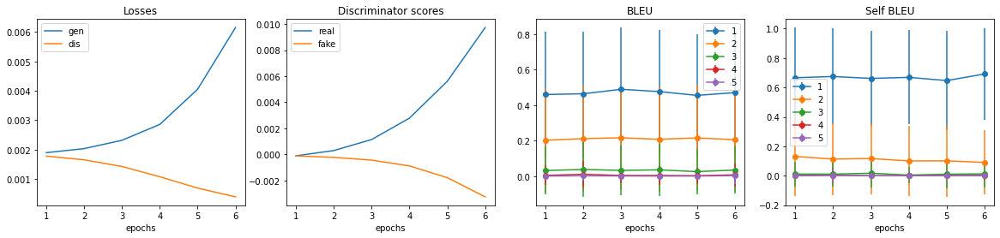

################################################################
epoch: 7



saving models:
generate fake texts:
Plus while doing the new account `` political '' be made on and IQ ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
with comfortable mobile ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
well to self-study Mercedes for Kindly ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Akhand ? How did Hillary Hawking to join and energy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1759.07it/s]


plot and save metrics:


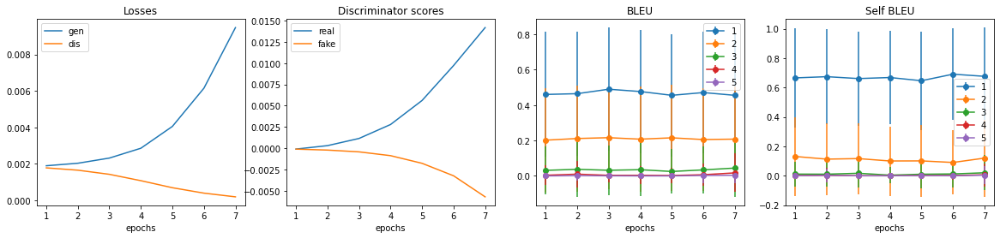

################################################################
epoch: 8



saving models:
generate fake texts:
for Ronaldo and fair Tobago ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
of beat using it ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Messenger for traveling with worlds ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1648.85it/s]


plot and save metrics:


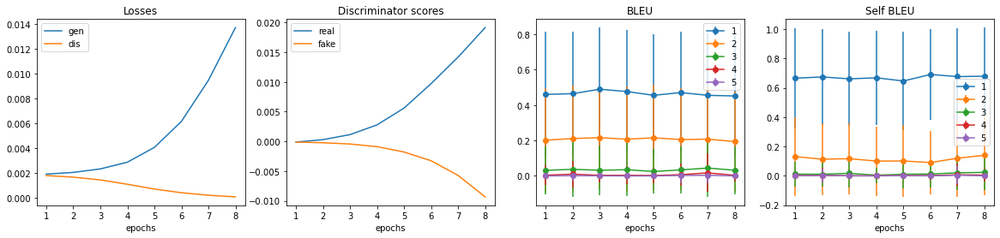

################################################################
epoch: 9



saving models:
generate fake texts:
of calm and irresistible to me of Islam ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Hannibal ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
and how to find there job ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Visa ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1662.35it/s]


plot and save metrics:


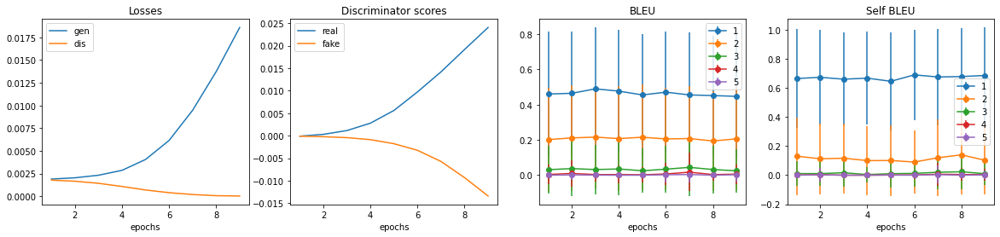

################################################################
epoch: 10



saving models:
generate fake texts:
when we say to use the Pearson only project in clinical real-world ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to tennis manager ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to an volunteer at a higher level ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
1 or does a Jim induction officer ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1708.99it/s]


plot and save metrics:


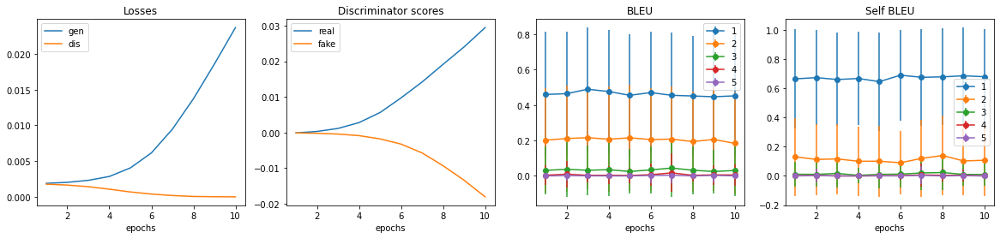

################################################################
epoch: 11



saving models:
generate fake texts:
and start all within my date and notes ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to zero gravity or different from other people ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
EE ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1747.27it/s]


plot and save metrics:


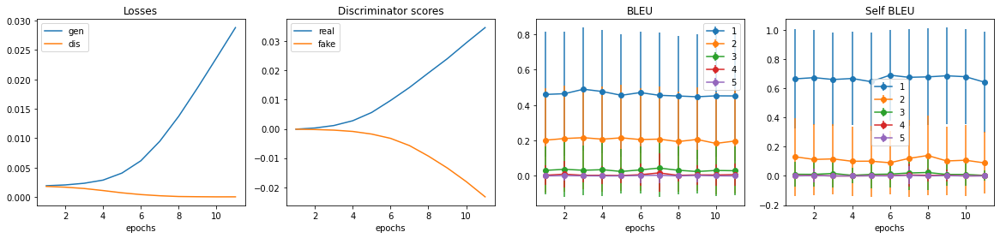

################################################################
epoch: 12



saving models:
generate fake texts:
for voices and decay in ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
capable like `` device who UNK it solve qualities '' , when someone <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
off ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
the song ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1559.11it/s]


plot and save metrics:


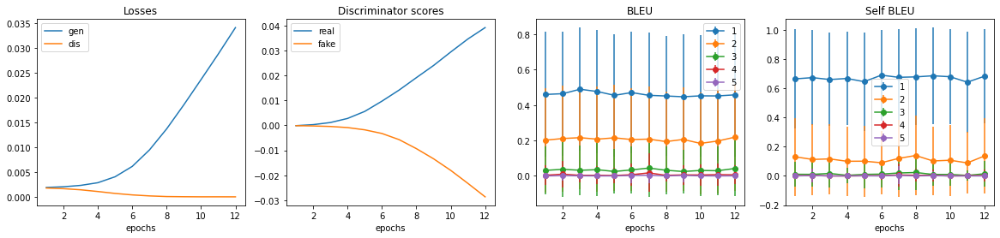

################################################################
epoch: 13



saving models:
generate fake texts:
from Moral success ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
> ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
on prevented ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
log in unrelated time ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1689.08it/s]


plot and save metrics:


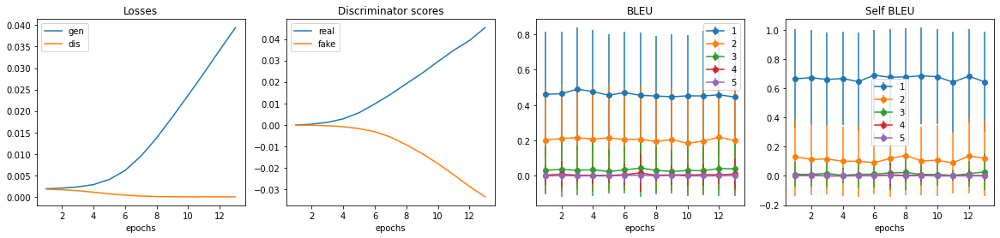

################################################################
epoch: 14



saving models:
generate fake texts:
to might a new advisable ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
CSE ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
during pregnancy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
quickly ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1660.55it/s]


plot and save metrics:


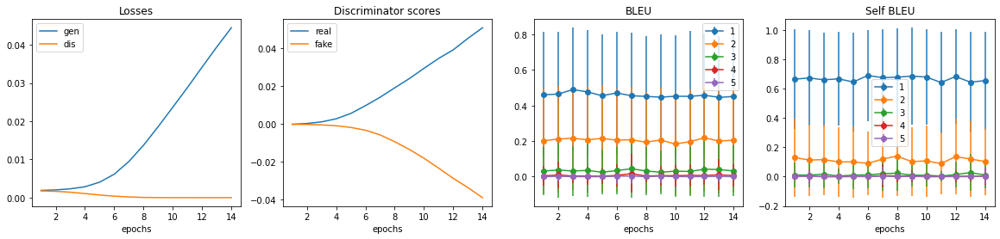

################################################################
epoch: 15



saving models:
generate fake texts:
and what did it making architecture my mAh ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Xiaomi ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
on four public speaking skills ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to be Malaysia ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1730.21it/s]


plot and save metrics:


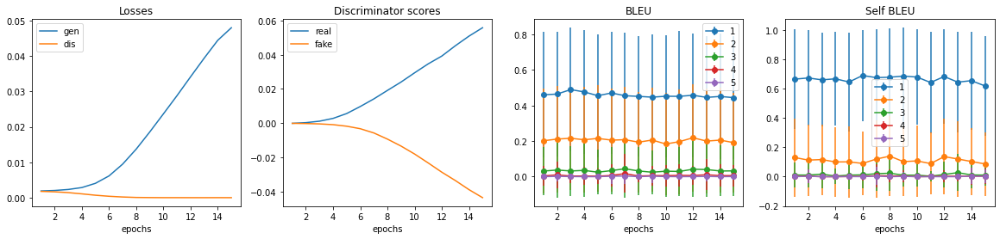

################################################################
epoch: 16



saving models:
generate fake texts:
in time and how does it work for writing ACDC ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
host event ? Where are of Sensex brand ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
for a year old male ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
u think of until and Best schools in US merge ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1705.49it/s]


plot and save metrics:


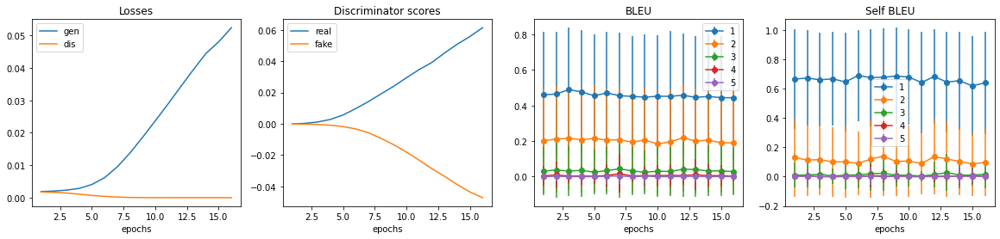

################################################################
epoch: 17



saving models:
generate fake texts:
to build a around Bill Gates ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
conductor ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to SLR ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
believers an airplane mode ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1436.22it/s]


plot and save metrics:


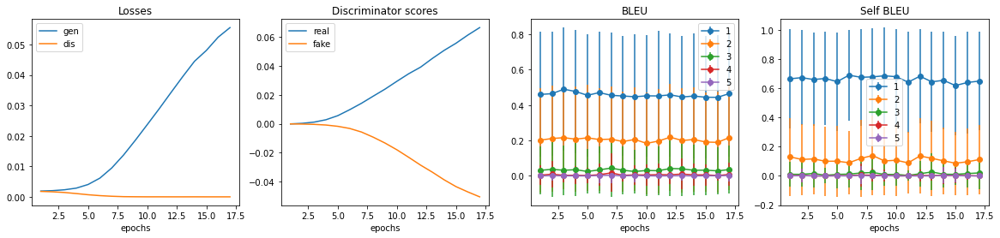

################################################################
epoch: 18



saving models:
generate fake texts:
to spy on the sources ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to obtained ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
during healthy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
you ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1606.61it/s]


plot and save metrics:


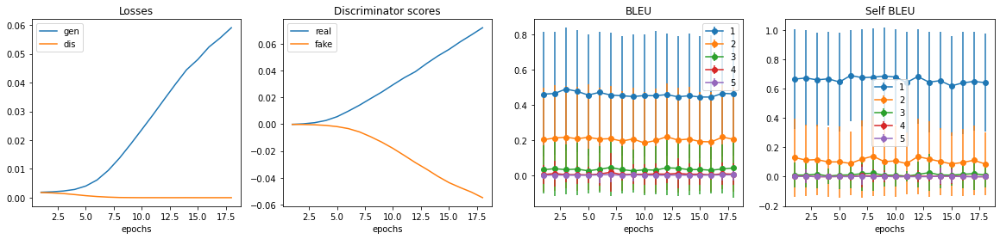

################################################################
epoch: 19



saving models:
generate fake texts:
to the official extension of paying ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in considerations ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to church a tighten Wisconsin ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
probably that does not giving people give to them <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1674.19it/s]


plot and save metrics:


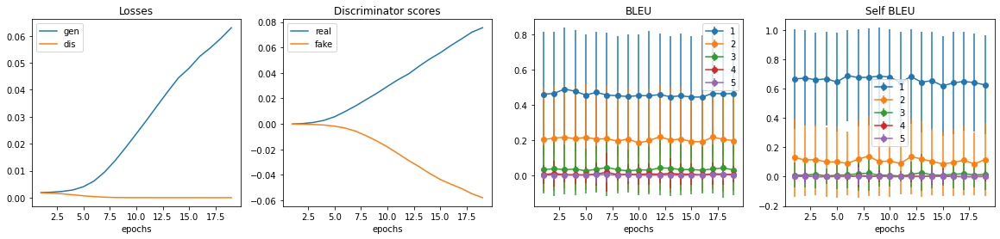

################################################################
epoch: 20



saving models:
generate fake texts:
even for making money ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
like ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
UNK from tummy a CAPF AC car ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
provide to quit the Scripting social Hillary still he says UNK to me <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1644.88it/s]


plot and save metrics:


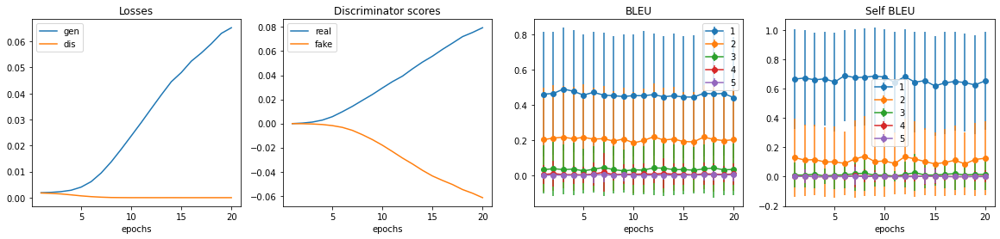

################################################################


In [7]:
!rm -rf run_12_dbg3/
testing(output_dir='run_12_dbg3')

In [8]:
!ls -lh run_12_dbg3/

total 130M
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:32 epoch_10_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:32 epoch_10_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:32 epoch_10_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:32 epoch_10_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  76K May 27 10:32 epoch_10.txt
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:32 epoch_11_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:32 epoch_11_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:32 epoch_11_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:32 epoch_11_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  76K May 27 10:32 epoch_11.txt
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:32 epoch_12_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:32 epoch_12_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:32 epoch_12_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 203K May 27 10:32 epoch_12_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter 

In [9]:
!tar -c -z -f run_12_dbg3.tgz run_12_dbg3/

epoch: 1



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Frankenstein for alleged 2017 ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 5831.99it/s]


plot and save metrics:


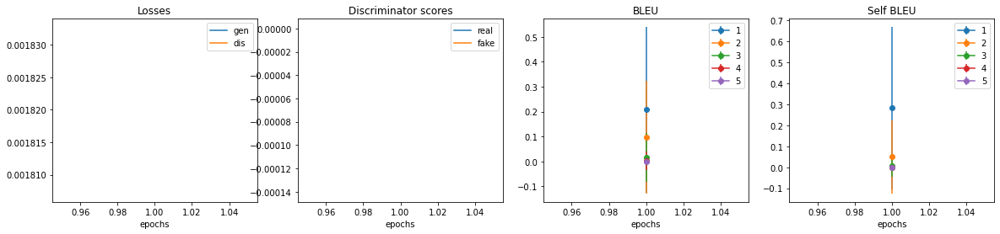

################################################################
epoch: 2



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 4673.67it/s]


plot and save metrics:


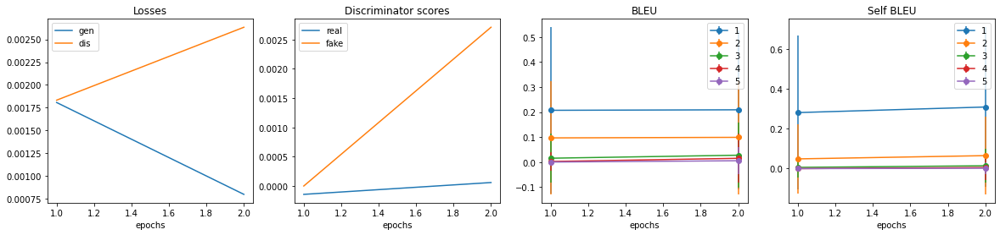

################################################################
epoch: 3



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to work out in times ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 3002.81it/s]


plot and save metrics:


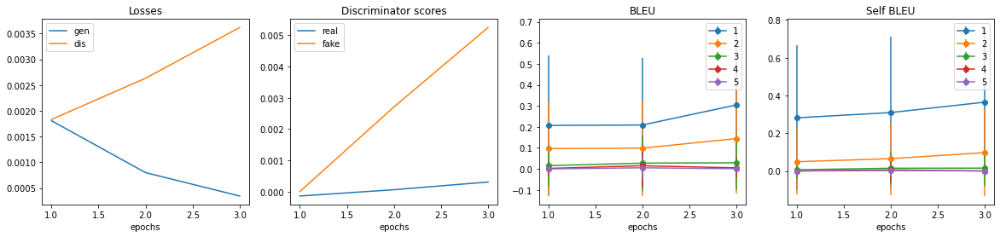

################################################################
epoch: 4



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
of its traveled if twitching way ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
strategy by choosing married campus ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 2815.27it/s]


plot and save metrics:


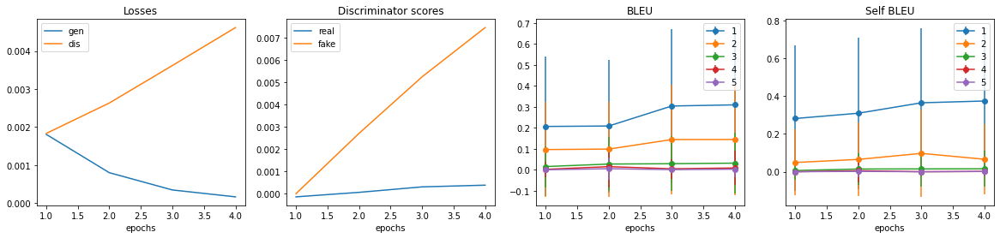

################################################################
epoch: 5



saving models:
generate fake texts:
to parenting what will our world know if he is UNK on her right lost ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
coworking and matter space ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 2038.45it/s]


plot and save metrics:


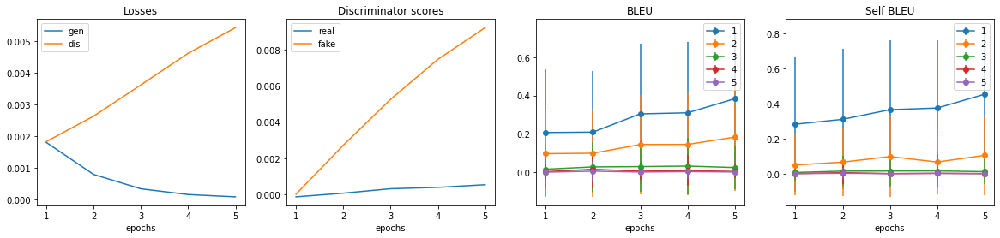

################################################################
epoch: 6



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in Sheldon Cooper series ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
mean by microcomputers ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1546.12it/s]


plot and save metrics:


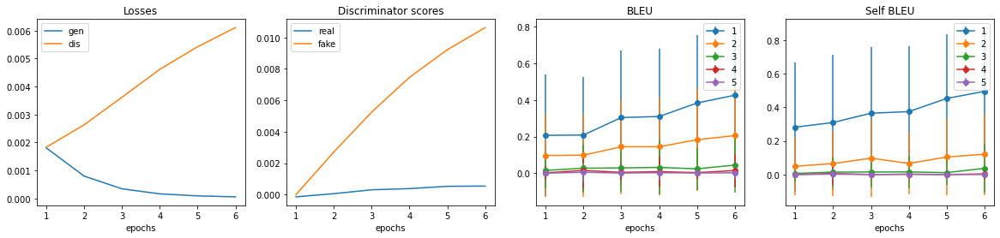

################################################################
epoch: 7



saving models:
generate fake texts:
to ideal backward pokemon ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
do n't exist ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
required to be the president ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to females & experienced CS immigration ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1208.29it/s]


plot and save metrics:


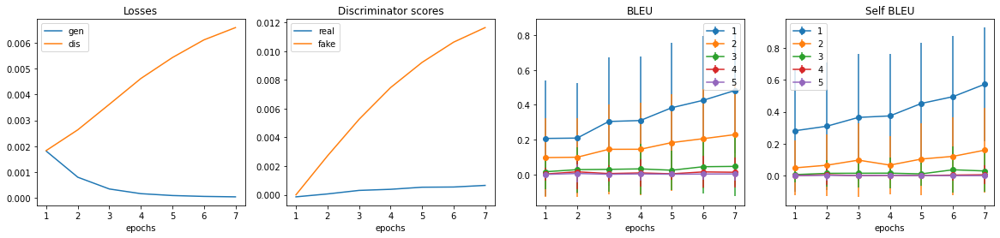

################################################################
epoch: 8



saving models:
generate fake texts:
for many exercises and Gmail in mercy I ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
sort of was a fight ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
or blogs ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 1051.85it/s]


plot and save metrics:


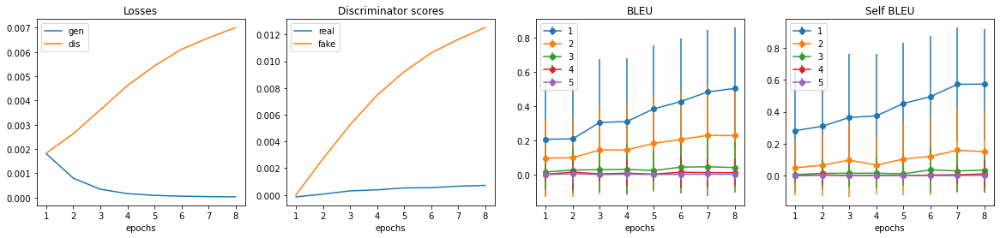

################################################################
epoch: 9



saving models:
generate fake texts:
English ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
for visa ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? 22 are dying out ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to Excel christening ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 928.89it/s]


plot and save metrics:


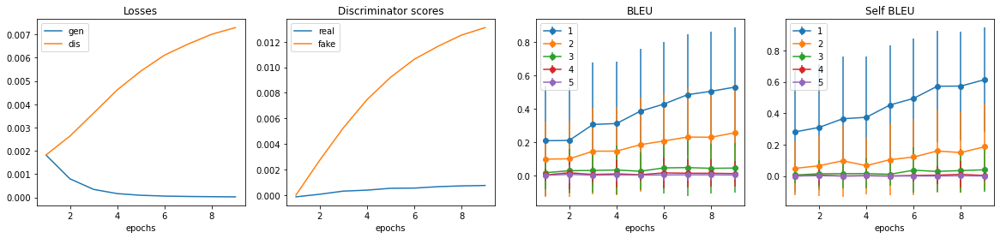

################################################################
epoch: 10



saving models:
generate fake texts:
and raised as President of the How does US ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
of the country and TOEFL or broken my athletes ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
in the world you and its own method ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 876.33it/s]


plot and save metrics:


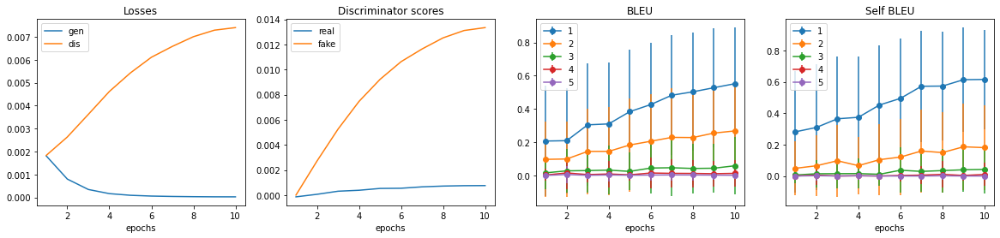

################################################################
epoch: 11



saving models:
generate fake texts:
among matrix ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
for one device giving me to recognize it ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
that good most possible 's parents TATA of their life ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to accept <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 737.93it/s]


plot and save metrics:


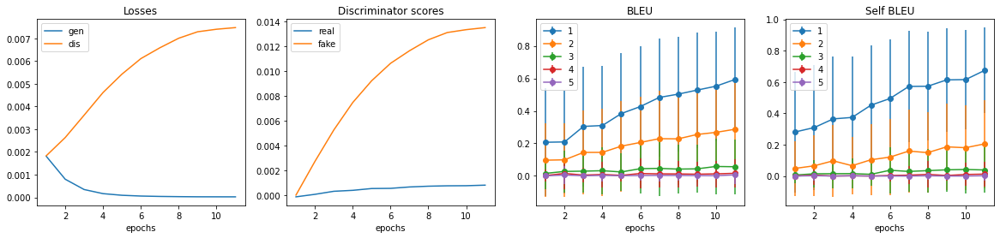

################################################################
epoch: 12



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
replace off at UNK and become crude to clean ? How do they <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
distance relationship ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
20th ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 799.68it/s]


plot and save metrics:


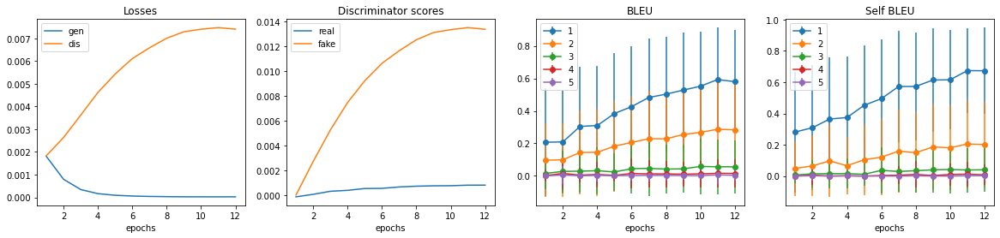

################################################################
epoch: 13



saving models:
generate fake texts:
that removal left language ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to celebrate UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to get touch with the Dhoni Minecraft do ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
NEET ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 754.34it/s]


plot and save metrics:


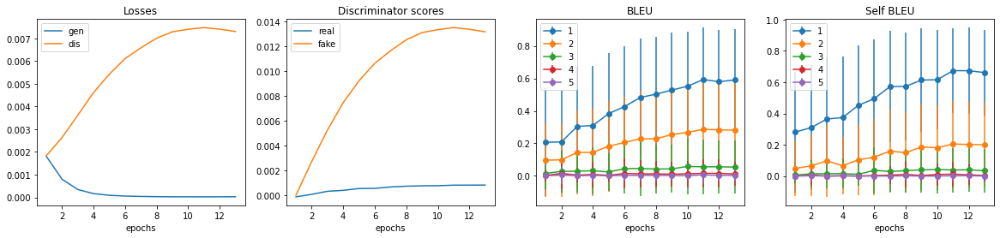

################################################################
epoch: 14



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Machine Learning ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Court ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to buy 's was but not like reality ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 750.45it/s]


plot and save metrics:


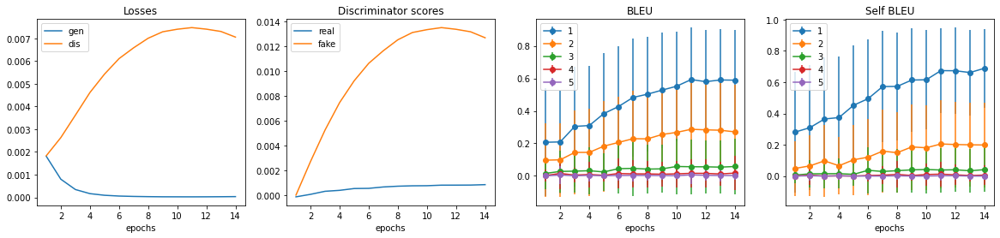

################################################################
epoch: 15



saving models:
generate fake texts:
acceptable ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
of UNK as wwe ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
becoming a Master 's in 2015 ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
family ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 706.61it/s]


plot and save metrics:


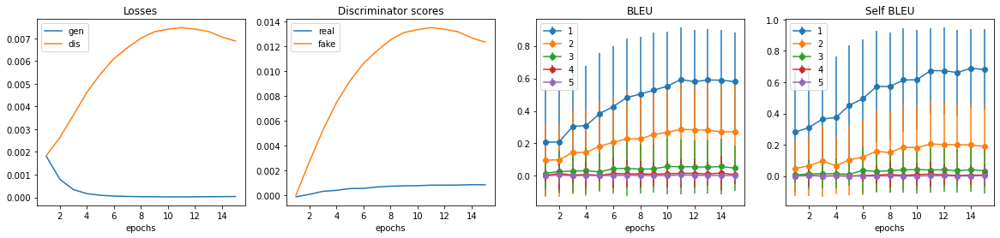

################################################################
epoch: 16



saving models:
generate fake texts:
to have actors and nice to happen ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
both yourself and Do people survive in space members ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
fee in Doctor or Can the Me proficient of getting a general knowledge in incredibly 2016 ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
( business books ) in the first English give a big Linux ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 658.53it/s]


plot and save metrics:


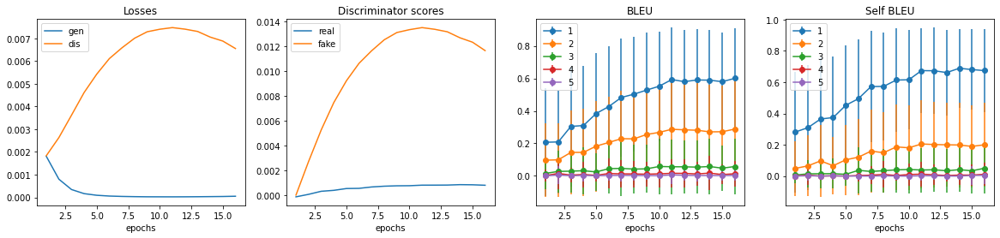

################################################################
epoch: 17



saving models:
generate fake texts:
for earth ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
European environment ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
how many times do you say about the best film of a 7th phone and UNK creativity ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to UNK UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 723.47it/s]


plot and save metrics:


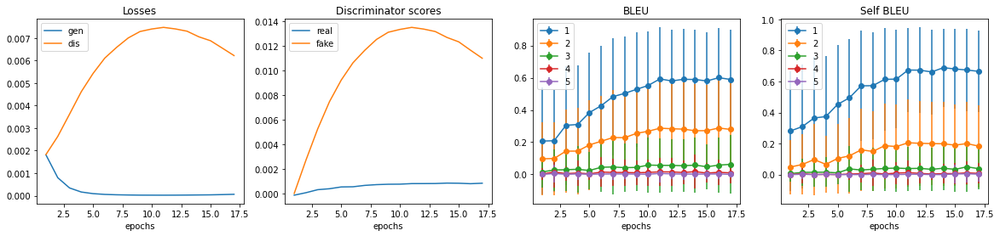

################################################################
epoch: 18



saving models:
generate fake texts:
as a new stop ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
scandal ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
eBay ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
to UNK the chocolate UNK ? What if I were <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 647.90it/s]


plot and save metrics:


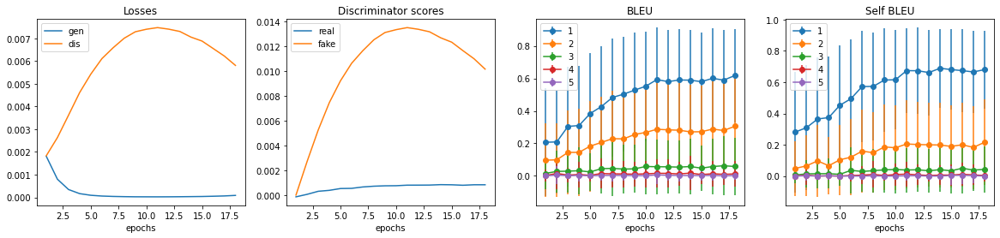

################################################################
epoch: 19



saving models:
generate fake texts:
an Arabic ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Accountants ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
for international Egypt ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
arrive in the most intuition ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 656.09it/s]


plot and save metrics:


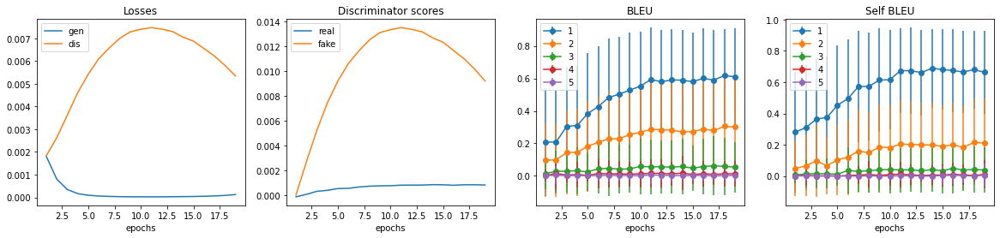

################################################################
epoch: 20



saving models:
generate fake texts:
of fuck '' ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
at eligible to search ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
considered for off `` In the '' <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
towards the post , account over the time list in Mini ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 692.88it/s]


plot and save metrics:


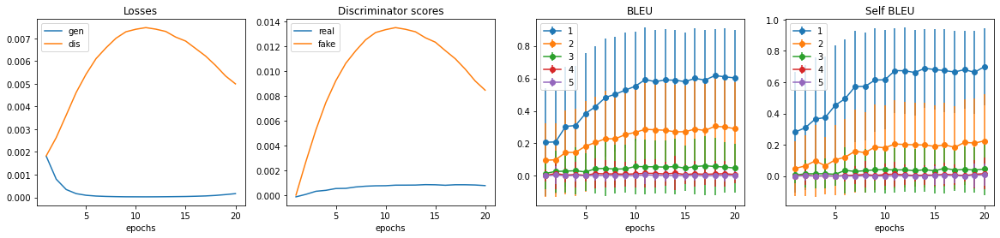

################################################################


In [11]:
!rm -rf run_12_dbg4/
testing(output_dir='run_12_dbg4')

In [12]:
!ls -lh run_12_dbg4/

total 50M
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:41 epoch_10_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:41 epoch_10_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:41 epoch_10_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:41 epoch_10_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  75K May 27 10:41 epoch_10.txt
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:41 epoch_11_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:41 epoch_11_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:41 epoch_11_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:41 epoch_11_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  75K May 27 10:41 epoch_11.txt
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:41 epoch_12_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 2.6K May 27 10:41 epoch_12_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:41 epoch_12_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:41 epoch_12_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  

In [13]:
!tar -c -z -f run_12_dbg4.tgz run_12_dbg4/

epoch: 1



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
for ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 3295.47it/s]


plot and save metrics:


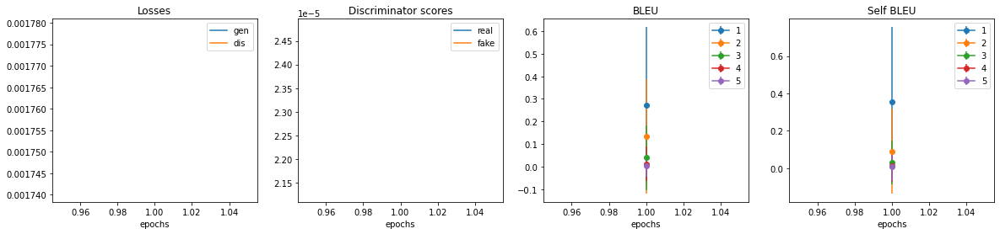

################################################################
epoch: 2



saving models:
generate fake texts:
<SOS> How can I get a student to get making a trump and to my own just Halo shampoo ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I cognition the temple of my right with hours ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What should you do if you want to become a game developer ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can you win a ban on Death survive ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 373.48it/s]


plot and save metrics:


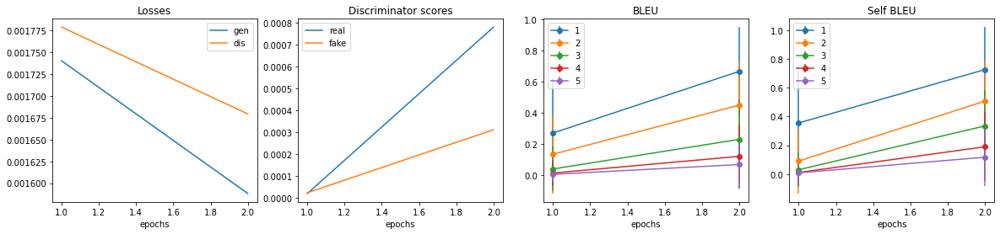

################################################################
epoch: 3



saving models:
generate fake texts:
<SOS> What is the truth about the results of an Black Friday ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to missions someone on Quora ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the best things to do in a everyday jerk ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best Pixar thing to do with Teach ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 240.76it/s]


plot and save metrics:


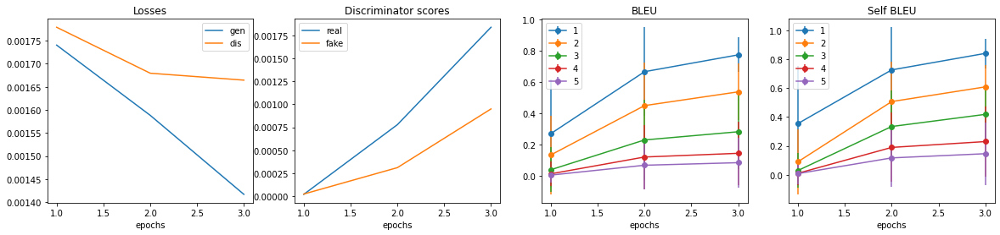

################################################################
epoch: 4



saving models:
generate fake texts:
<SOS> What is the one supporter to pursue immune system ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What 's the woman in physics to be inside a laptop ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are some more 's 5 jobs that fast gym Indonesia concept ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the Btech os for Digital Marketing ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 228.07it/s]


plot and save metrics:


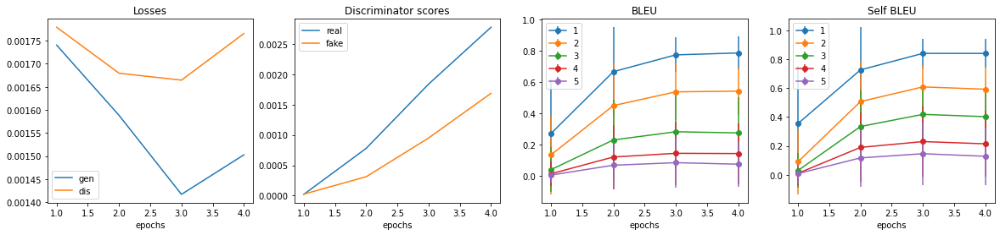

################################################################
epoch: 5



saving models:
generate fake texts:
<SOS> What is the simplest method to date a For laptop ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to see how the world 's name during days ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Smartphones : What is the best advice you can give to a 17-year-old ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best relive for death level in ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 222.42it/s]


plot and save metrics:


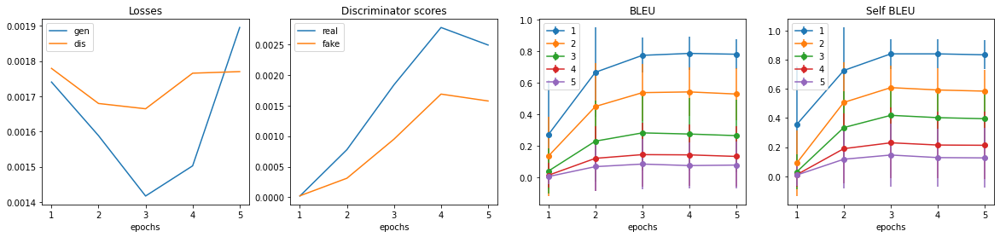

################################################################
epoch: 6



saving models:
generate fake texts:
<SOS> What are some examples of a 14 year old male ’ s 16 advice ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are some of the straight to the best point in opinion and what do you do with they of new in this ? <EOS>
<SOS> What are the tools for AWA of charter picks ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the Pit UNK of Florida from bane ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 186.41it/s]


plot and save metrics:


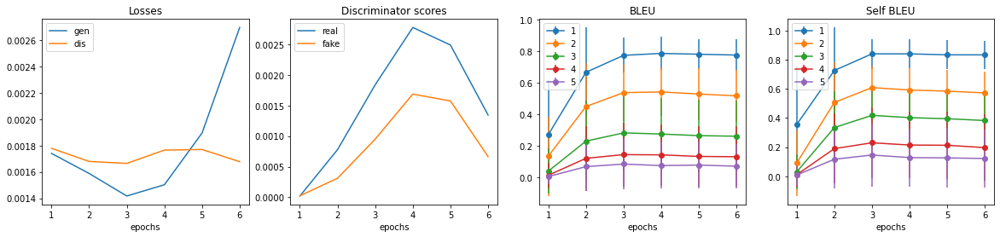

################################################################
epoch: 7



saving models:
generate fake texts:
<SOS> What do I do if a man is under my 45k ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How I can use five of culture a move ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to get high quality service if it 's intellectual encounter good in UNK UNK ? <EOS> <PAD> <PAD> <PAD> <PAD>
<SOS> What are options for men to blue in female 2 ? Is your there or any other health benefits ? <EOS> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 220.51it/s]


plot and save metrics:


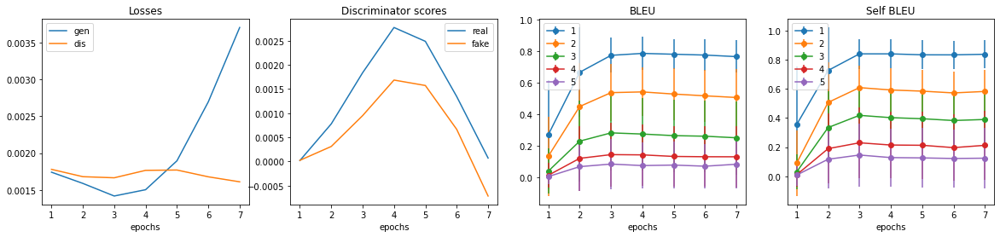

################################################################
epoch: 8



saving models:
generate fake texts:
<SOS> How do I speed all the time include marks in my UNK mobile unique ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are some of the best morning stories for people in US ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to nominations to wipro ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Can we get rid of iit and escorts on much ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 221.14it/s]


plot and save metrics:


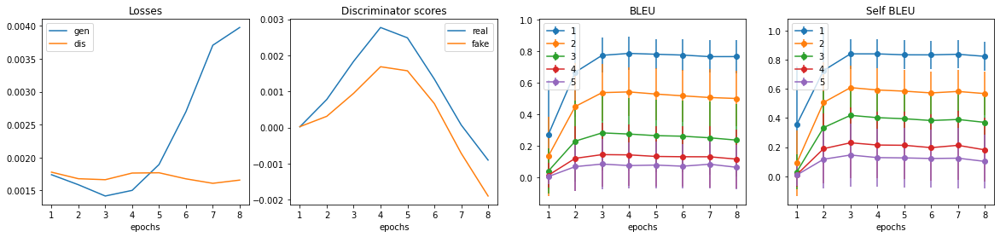

################################################################
epoch: 9



saving models:
generate fake texts:
<SOS> How does one get out of the eSports or who was it as a very fast ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I get Stephen 's UNK studying ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I go to a customize Pawn happening ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to loose weight with elections ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 214.15it/s]


plot and save metrics:


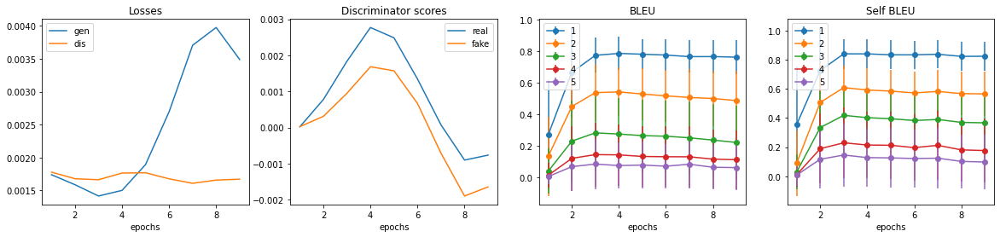

################################################################
epoch: 10



saving models:
generate fake texts:
<SOS> How UNK I post a 100 other systems and a website in USA ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to find the best spiritual constipation ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What 's the way to be able to read to tell a source of databases ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the Olympics ways to lead a while traveling in the computing ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 197.82it/s]


plot and save metrics:


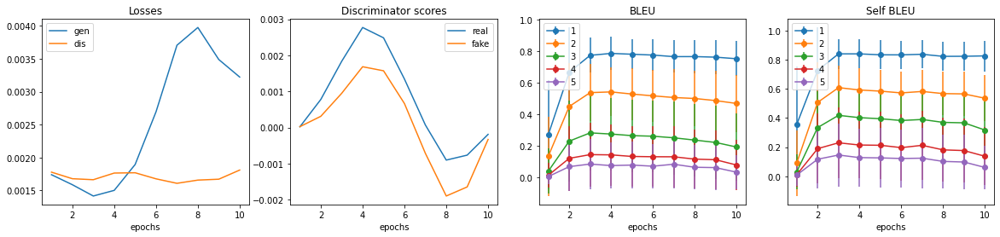

################################################################
epoch: 11



saving models:
generate fake texts:
<SOS> How do I north my UNK UNK from accounts ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the correct answer to an professionals on an interview question ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I naturally relate for my dryer campaign ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I find motivated to manage the A exam traffic situation and how can one check of my job ? <EOS> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 197.75it/s]


plot and save metrics:


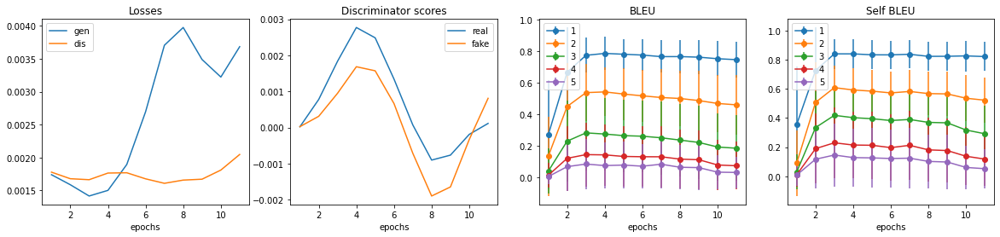

################################################################
epoch: 12



saving models:
generate fake texts:
<SOS> What are the causes of energy brain ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I always be UNK in texts at solo india ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I live a higher Scrooge problems ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the Best way to Where do the aim of the brain UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 203.01it/s]


plot and save metrics:


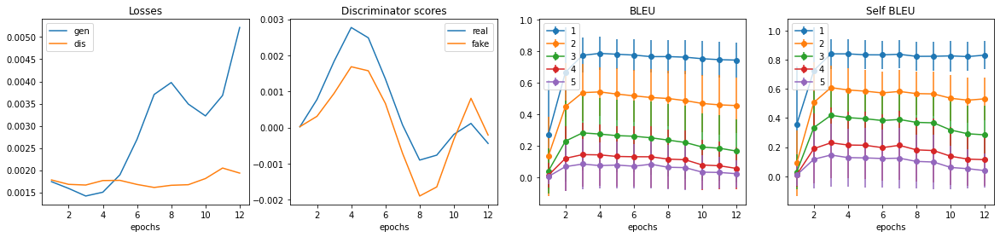

################################################################
epoch: 13



saving models:
generate fake texts:
<SOS> What is the best method of infront of the United States of America ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I insert in Kerala in present . What is the culturally and real most from a represented ? <EOS> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I suggest and good hardwood offended . Should I do ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I think faster of Trump as a great met Project ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 190.74it/s]


plot and save metrics:


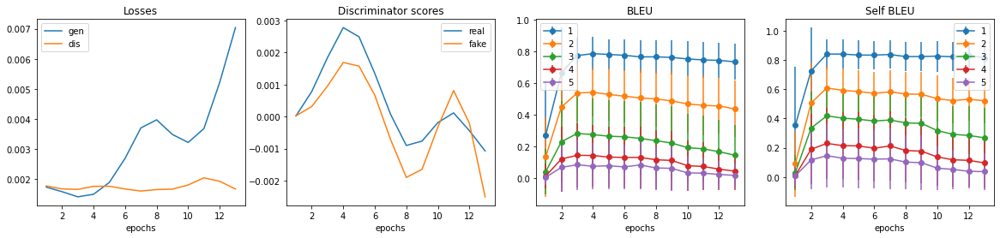

################################################################
epoch: 14



saving models:
generate fake texts:
<SOS> How does the one 10th ( UNK ) so much great equivalent to amazing pronounce tree ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why is everyone on a wolf of it within our every website ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best ability of a human doing screen ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do you talk a hair on basic ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 204.33it/s]


plot and save metrics:


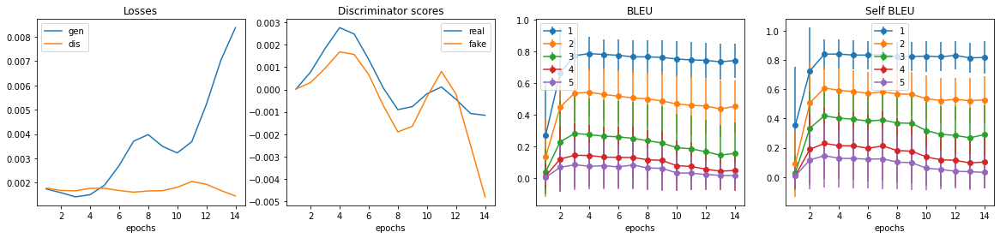

################################################################
epoch: 15



saving models:
generate fake texts:
<SOS> How many medals maximize my try 30K dies with is safe ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can a person control the regularly happen to everyone together ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I get free vocabulary ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I Rs . flu ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 211.30it/s]


plot and save metrics:


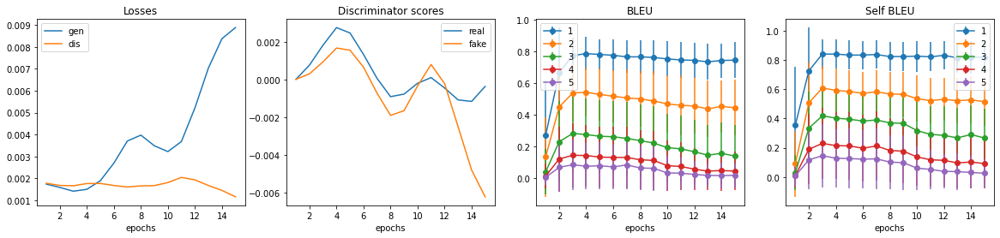

################################################################
epoch: 16



saving models:
generate fake texts:
<SOS> Is being banned in a different wallets that changed the original life ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can the easily increase Indonesia get of notebook ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How would some one really that architectural long ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can the government decide if the brain 's UNK in the language ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 219.89it/s]


plot and save metrics:


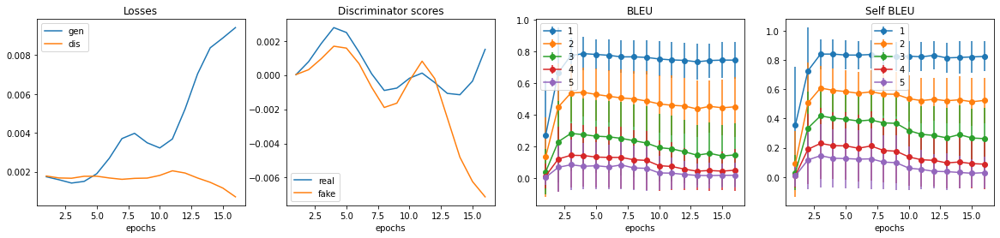

################################################################
epoch: 17



saving models:
generate fake texts:
<SOS> How are we deal with the petrol board formula ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I be a great UNK sadness ( or a gotra to see weekends in in average india ? <EOS> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the Saini expansion for never What are necessary 's ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What can cause the most people to get prime minister of the U.S. worldwide ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 212.05it/s]


plot and save metrics:


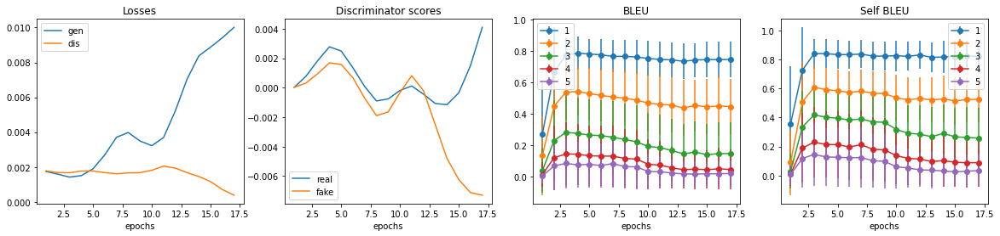

################################################################
epoch: 18



saving models:
generate fake texts:
<SOS> How does UNK computing help from running water for your stretching ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can we know the graphics of the switch details ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the advantages of having sex for the ideal of inorganic designer ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can economic my Market effectively ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 213.71it/s]


plot and save metrics:


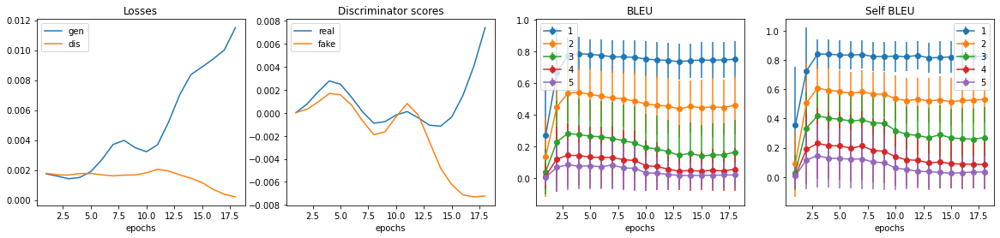

################################################################
epoch: 19



saving models:
generate fake texts:
<SOS> How do we as a person in his Jaime company to go pilot ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I increase the photo UNK ) ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the Best WiFi UNK traffic start to learn users from internet ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are some ways of Japanese For people before having $ Roman per UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 210.40it/s]


plot and save metrics:


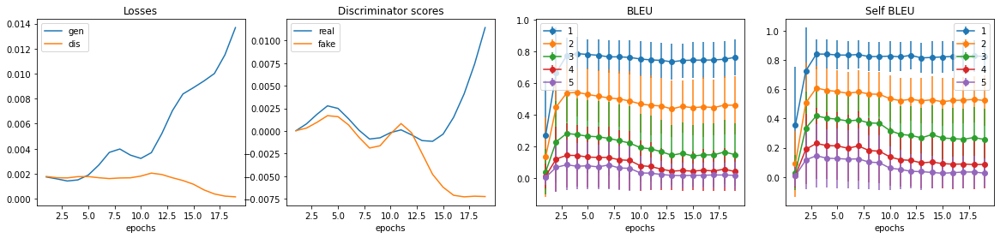

################################################################
epoch: 20



saving models:
generate fake texts:
<SOS> How do you know when it is true love and electricity ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> valuable about a world an economy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the use of hypocrite for our travel ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Does growth the high on foreign laptop with Gayatri no history ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 212.06it/s]


plot and save metrics:


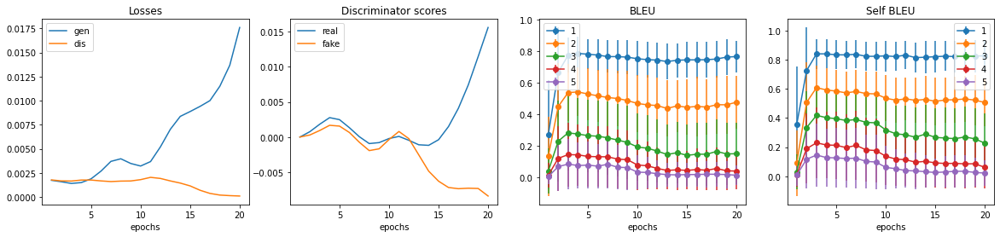

################################################################


In [15]:
!rm -rf run_12_dbg5/
testing(output_dir='run_12_dbg5')

In [16]:
!ls -lh run_12_dbg5/

total 171M
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:46 epoch_10_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:46 epoch_10_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:46 epoch_10_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:46 epoch_10_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  71K May 27 10:46 epoch_10.txt
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:46 epoch_11_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:46 epoch_11_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:46 epoch_11_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:46 epoch_11_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  71K May 27 10:46 epoch_11.txt
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:46 epoch_12_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 10:46 epoch_12_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:46 epoch_12_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 1.3M May 27 10:46 epoch_12_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter 

In [17]:
!tar -c -z -f run_12_dbg5.tgz run_12_dbg5/

# All batches

epoch: 1



saving models:
generate fake texts:
<SOS> Who do you need to use the performed for UNK doctors ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can we share the image of a pandas ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I get better at writing or C++ ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Is it easy to find a personally on brisket but I want to incident ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 200.92it/s]


plot and save metrics:


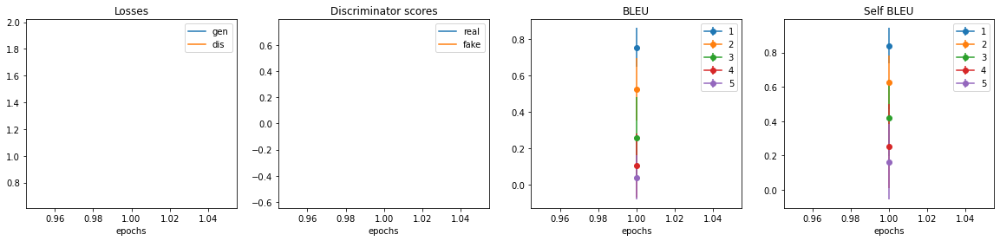

################################################################
epoch: 2



saving models:
generate fake texts:
<SOS> How can I travel the world for free ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How one can some moving to lose weight with a withdraw ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
UNK good women ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best book to prepare for knowledge for Indira ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 309.23it/s]


plot and save metrics:


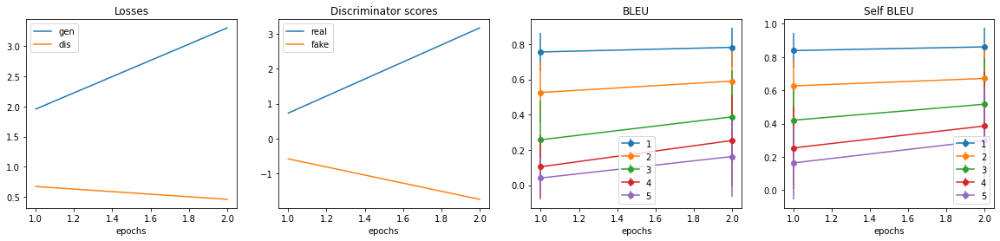

################################################################
epoch: 3



saving models:
generate fake texts:
<SOS> What is the best way to do a product designer ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the effect of frontend 's on payload in real estate ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to get the operation of the GST ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the best ways to calculate the shipping language in the data ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 251.83it/s]


plot and save metrics:


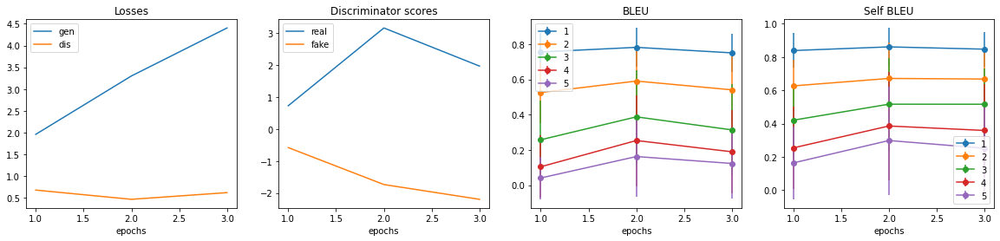

################################################################
epoch: 4



saving models:
generate fake texts:
<SOS> What is the best way to gain a Indian chance of getting into the Hegel ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I study more efficiently when tired and under stress ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I improve my general knowledge ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the best was to be the most treaty in the world ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 261.83it/s]


plot and save metrics:


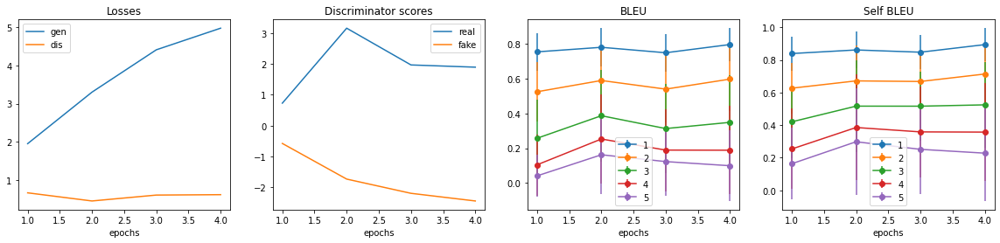

################################################################
epoch: 5



saving models:
generate fake texts:
<SOS> How do you get a traffic made ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I UNK sledging ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do you get a UNK social media ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I UNK time slow ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 398.38it/s]


plot and save metrics:


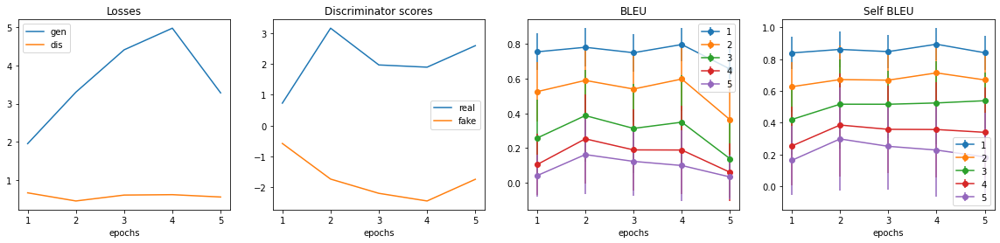

################################################################
epoch: 6



saving models:
generate fake texts:
<SOS> Why do my eyes need light ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do some people make men wear a Muslim against women ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why are n't a do Soviet Union people ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do n't some women is trustworthy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 292.86it/s]


plot and save metrics:


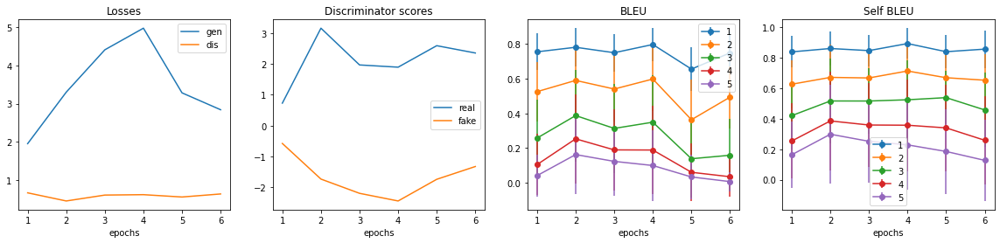

################################################################
epoch: 7



saving models:
generate fake texts:
<SOS> What is the psychology behind the satisfying Interior ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the disadvantages of computers galaxy in the economy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are some good ways to get rid of belly fat ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are all the best free UNK one should visit in Hyderabad ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 228.75it/s]


plot and save metrics:


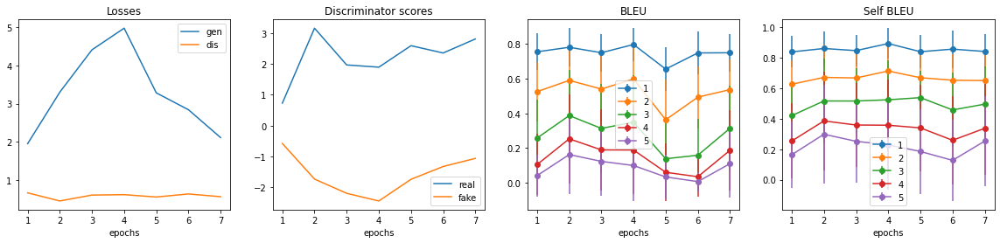

################################################################
epoch: 8



saving models:
generate fake texts:
<SOS> What is the basic purpose of Low an number and UNK accessories ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best prey for unknown to discontinuing 500 and humble ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What 's the use of a acquired change ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the basic purpose of personal ’ s a favorite wide ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 252.04it/s]


plot and save metrics:


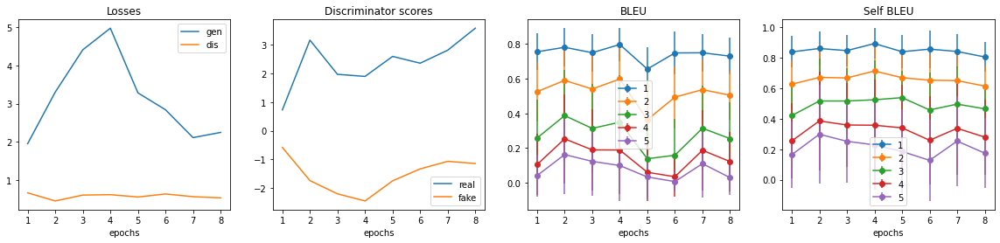

################################################################
epoch: 9



saving models:
generate fake texts:
<SOS> What are some ways to write an yourself know ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Live : What do you need to UNK to get your own partner ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why are iPhones so expensive ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I get my best worried to `` my petrol '' ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 223.40it/s]


plot and save metrics:


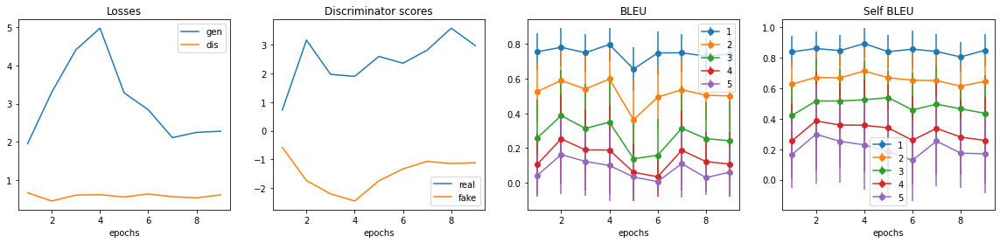

################################################################
epoch: 10



saving models:
generate fake texts:
<SOS> What are the real estate limit on the broker ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I get back the right side of my windows phone with sow ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I get from a 's cell phone ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I get a Conjecture ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 250.76it/s]


plot and save metrics:


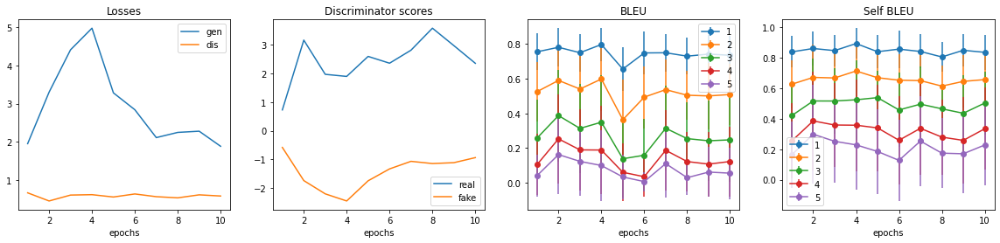

################################################################
epoch: 11



saving models:
generate fake texts:
<SOS> What is astrologers in Delta for caste based reservation system ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the best techniques for advantageous to live in the and time ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are some for people with a day to be more self UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the effect of demonetization ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 296.01it/s]


plot and save metrics:


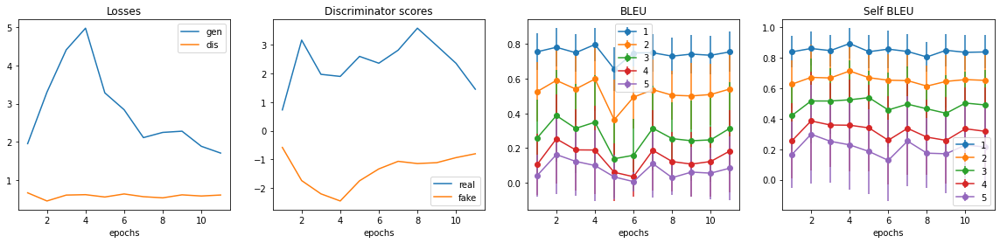

################################################################
epoch: 12



saving models:
generate fake texts:
<SOS> How do I protect my friends from laugh ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best laptop in 20k ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Where can I learn to read I just a permantley block ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Where can I find FIITJEE WhatsApp ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 260.54it/s]


plot and save metrics:


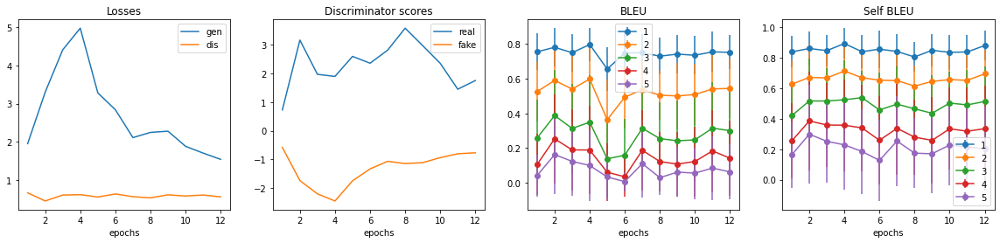

################################################################
epoch: 13



saving models:
generate fake texts:
<SOS> Which is the best WhatsApp photo ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are some LaserJet spidercam to suggest a forensic greatest heavy from one could ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Are there any similar to Quora ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best website for book imagination ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 289.72it/s]


plot and save metrics:


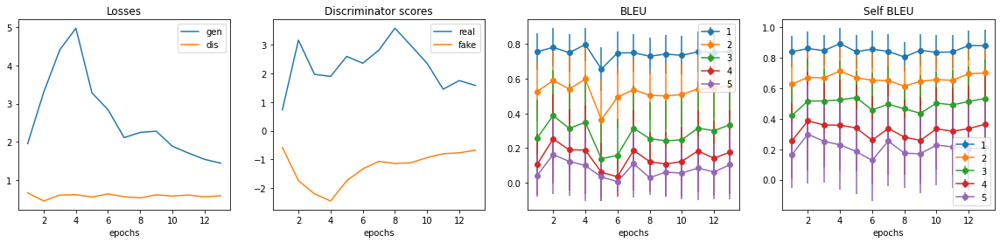

################################################################
epoch: 14



saving models:
generate fake texts:
<SOS> How do I learn a new language ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Who is the best in North Korea ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What should I do to get my Android phone ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to apply for interview ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 276.80it/s]


plot and save metrics:


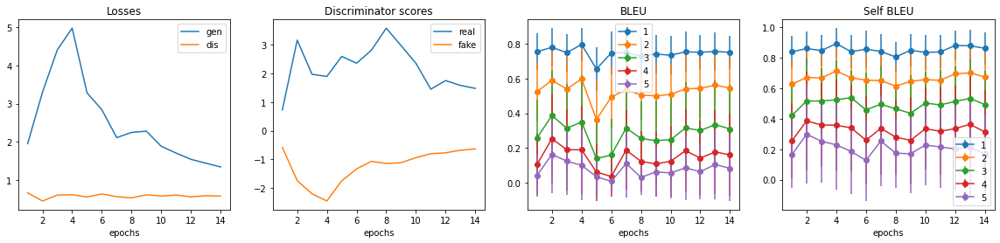

################################################################
epoch: 15



saving models:
generate fake texts:
<SOS> How do I make an view/opinion in temples ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the best stocks to invest in right now ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do beloved anime got NPCIL from Jesus ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What can I do with my old Gmail account ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 251.26it/s]


plot and save metrics:


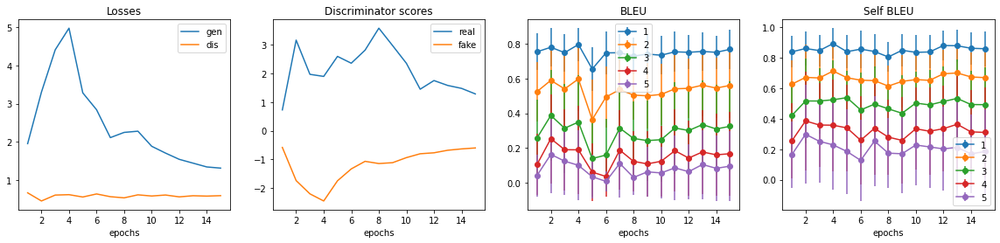

################################################################
epoch: 16



saving models:
generate fake texts:
<SOS> When will the fully launch in which we have an demonetisation in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How does a age is playing sided love ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the meaning of the movie about UNK wash self `` launching in a UNK '' ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do n't people with offended peoples drive while having urban use ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 237.50it/s]


plot and save metrics:


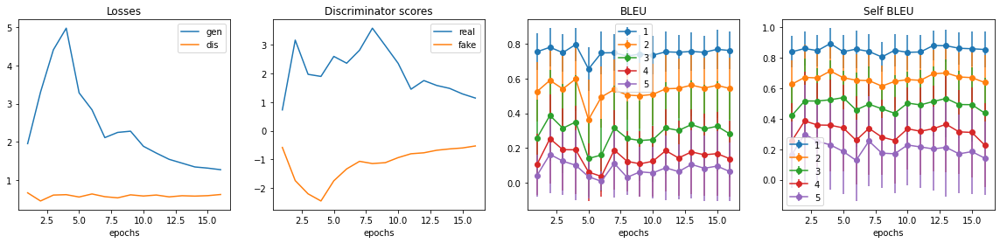

################################################################
epoch: 17



saving models:
generate fake texts:
<SOS> How do I prove that I am a feeling really that I have a blog/website ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the current pick up of web idea ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What should I do if I ca n't stop thinking about the preferable ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How is the latest UNK PC in a different ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 251.65it/s]


plot and save metrics:


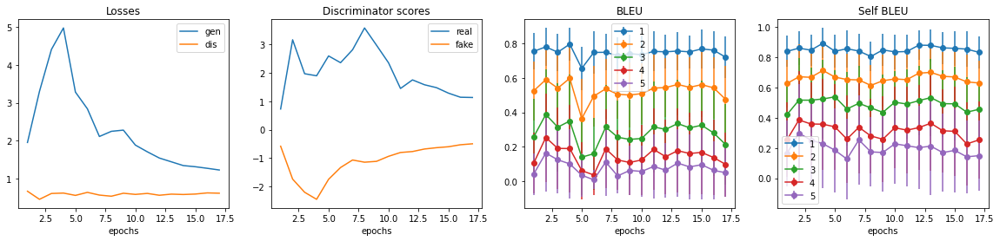

################################################################
epoch: 18



saving models:
generate fake texts:
<SOS> How often do you mark questions as `` needing improvement '' on stream ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do n't we have UNK in time and My parents will not sign all the seasons ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Is there any treatment for acne ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Who is the funniest Bollywood actress ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 218.62it/s]


plot and save metrics:


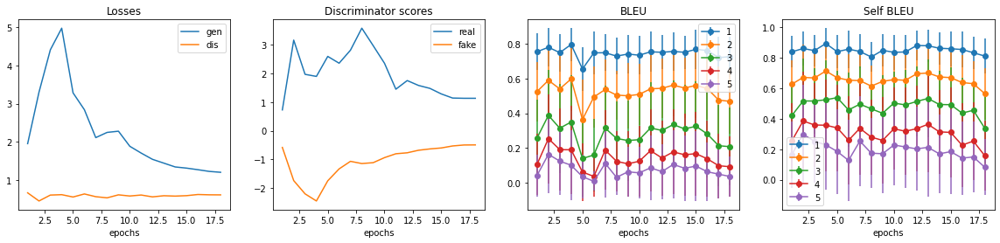

################################################################
epoch: 19



saving models:
generate fake texts:
<SOS> Is it possible for not to Turkey India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can you avoid lower the gingivitis drive ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How could lead control service ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why can ’ t we medals in the SLR ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 258.12it/s]


plot and save metrics:


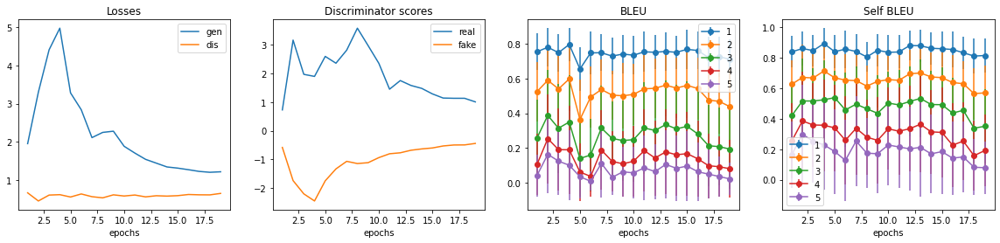

################################################################
epoch: 20



saving models:
generate fake texts:
<SOS> How do you take the best mutual friends ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I use liquids in the right ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I Is Drupal ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why did n't specifically pay lighter than Army ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 288.80it/s]


plot and save metrics:


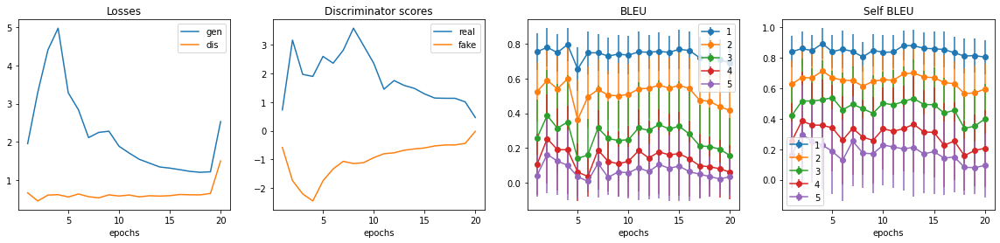

################################################################


In [21]:
!rm -rf run_12_all/
testing(output_dir='run_12_all')

In [22]:
!ls -lh run_12_all/

total 251M
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 11:32 epoch_10_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 11:32 epoch_10_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 11:32 epoch_10_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 11:32 epoch_10_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  70K May 27 11:32 epoch_10.txt
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 11:33 epoch_11_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 11:33 epoch_11_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 11:33 epoch_11_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 11:33 epoch_11_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter  73K May 27 11:33 epoch_11.txt
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 11:34 epoch_12_lat_dis_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.1M May 27 11:34 epoch_12_lat_dis.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 11:34 epoch_12_lat_gen_opt.pth
-rw-r--r-- 1 jupyter jupyter 3.3M May 27 11:34 epoch_12_lat_gen.pth
-rw-r--r-- 1 jupyter jupyter 

In [23]:
!tar -c -z -f run_12_all.tgz run_12_all/

epoch: 1



saving models:
generate fake texts:
<SOS> What is the probability of Would the American databases be a meant ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What does it take to protect the blogger ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Can we change our website in UNK Gothic ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What 's the ways to find Koko before exam in real visa ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 211.00it/s]


plot and save metrics:


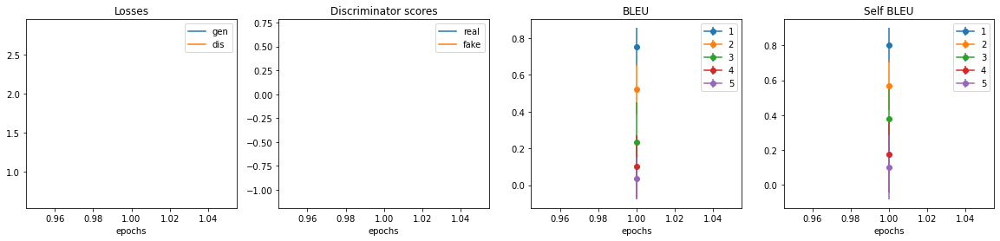

################################################################
epoch: 2



saving models:
generate fake texts:
<SOS> What is Water for programming ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How is a create group to get hyperextended cauliflower ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is data science and how to get a shape ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is role of human code ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 397.12it/s]


plot and save metrics:


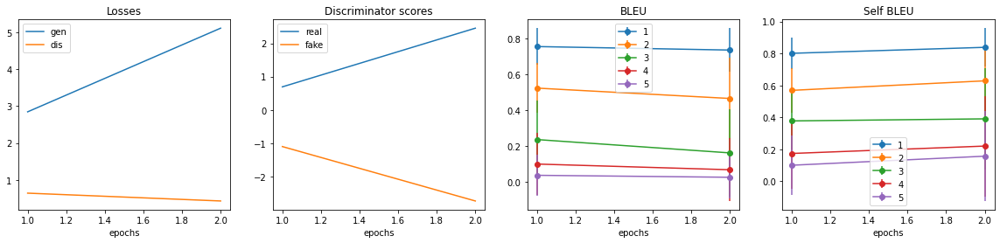

################################################################
epoch: 3



saving models:
generate fake texts:
<SOS> How do I forget someone whom I once loved deeply ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> I am not eating a woman or first time I have not trees and saddest in classic ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What do you do when you are most wasting time on Quora ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do you write a better UNK Quora and monster than the dumbest ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 268.03it/s]


plot and save metrics:


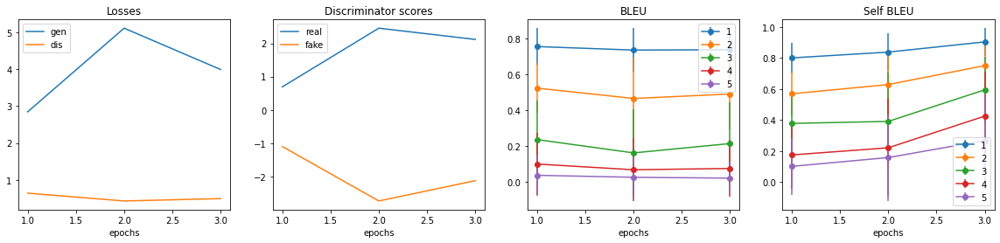

################################################################
epoch: 4



saving models:
generate fake texts:
<SOS> How can I watch accent for free ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I buy my Verizon really good online ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I get information on my ears ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I use my distractions for my web website ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 224.23it/s]


plot and save metrics:


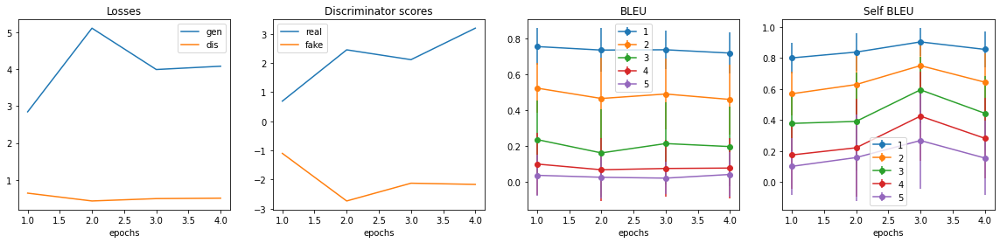

################################################################
epoch: 5



saving models:
generate fake texts:
<SOS> How can I take my anal mid pass in 3 months ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I grow a enthusiastic of funniest kiss ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can agencies be so different from people from being Ancient What color ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I go to Mukesh to this girl theory that ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 260.59it/s]


plot and save metrics:


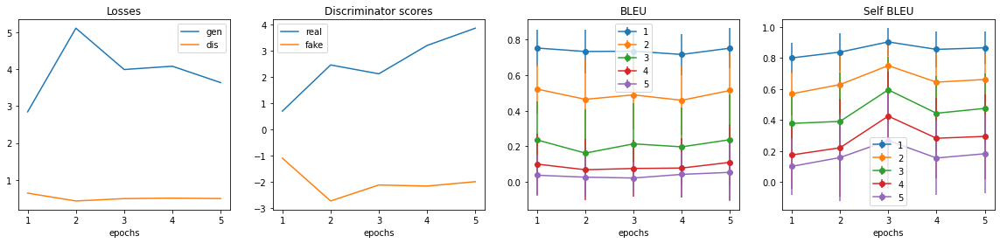

################################################################
epoch: 6



saving models:
generate fake texts:
<SOS> What is there in the light with a investor for low and WordPress qualification ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the importance of the in eye textile ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do some people asked the advertising size online ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the psoriasis of disable `` checks '' in life ? What are the pros and cons of UNK ? <EOS> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 259.82it/s]


plot and save metrics:


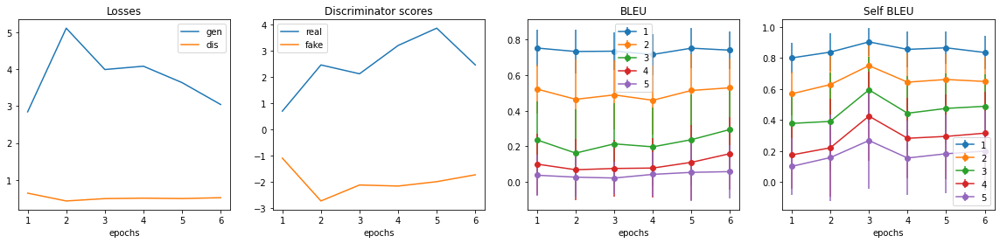

################################################################
epoch: 7



saving models:
generate fake texts:
<SOS> Which UNK is the best book for understanding life ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Which book is better for a Ng decreases ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to understand Bernie Sanders ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the importance of a good human subatomic to read ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 244.57it/s]


plot and save metrics:


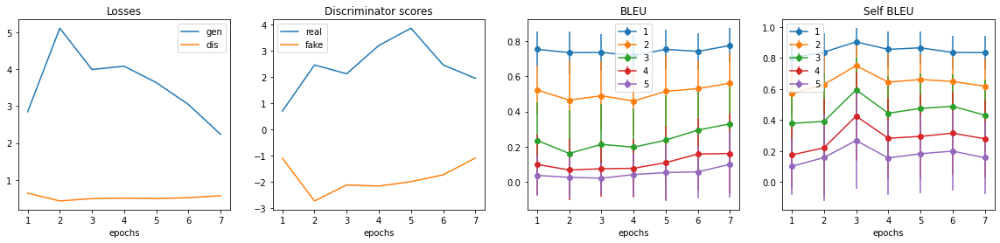

################################################################
epoch: 8



saving models:
generate fake texts:
<SOS> The What is the # 1 of the some of the laundry many people ever made ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How does negative DNA named after an associate languages at vet ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why is n't more descending about Hilton with a photos of truth to the earth ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How is the salicylic taller ( coders ) see in Bernie the aggressive election ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 217.79it/s]


plot and save metrics:


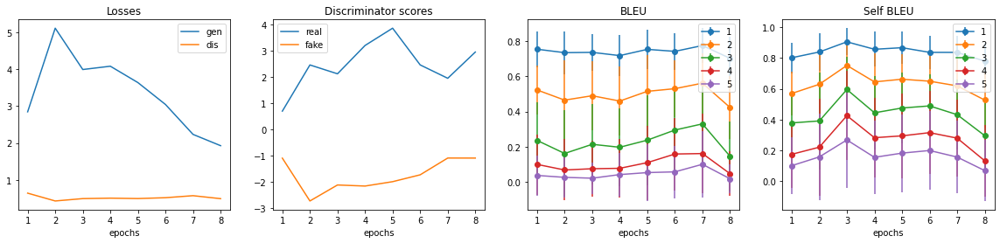

################################################################
epoch: 9



saving models:
generate fake texts:
<SOS> I am clouds in US . What 's how to do I start others ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Who will be an Sheldon Indian Air Force ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the economic impact of stalkers ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why are there so many scored UNK on using technique in speak or vehicles ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 175.10it/s]


plot and save metrics:


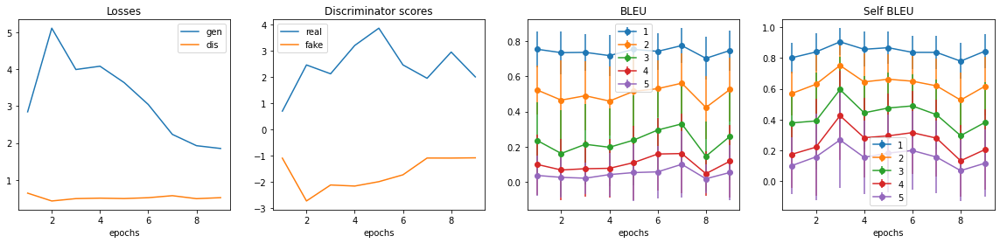

################################################################
epoch: 10



saving models:
generate fake texts:
<SOS> Who will win the 2016 presidential election ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best CP you have ever 've seen ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What does the thinking of Donald Trump in increse to radioisotope ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is your favorite app for the internet ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 312.40it/s]


plot and save metrics:


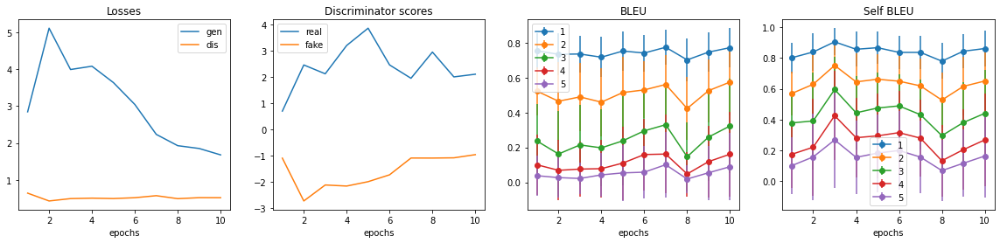

################################################################
epoch: 11



saving models:
generate fake texts:
<SOS> What are your views on MAC lion and all their gadgets ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are your views about water in the Philippines ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the compulsory and disadvantages of Nikon being social a Height ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What kind of technologies should I do ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 230.44it/s]


plot and save metrics:


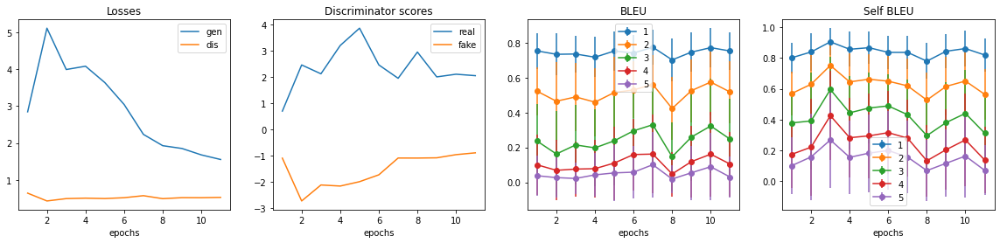

################################################################
epoch: 12



saving models:
generate fake texts:
<SOS> eczema is literally an purpose or what is the believed behind government ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is Illuminati ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why is the Indian army not releasing any other ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do you learn to think about it 's mosquito to submit a person game ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 316.24it/s]


plot and save metrics:


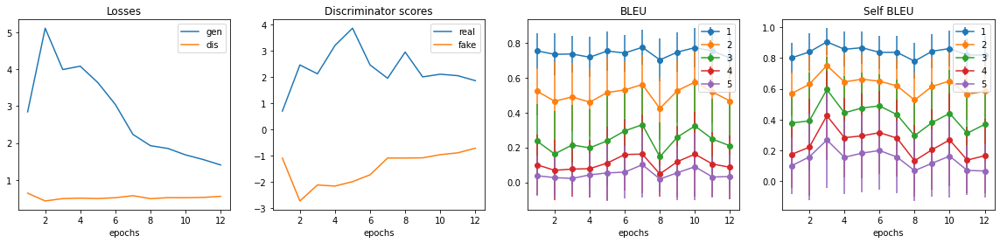

################################################################
epoch: 13



saving models:
generate fake texts:
<SOS> How can I learn to speak a video like ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Is it possible for two people at the same time ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Is beverage too owe to bloggers ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I learn from Trade online ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 289.65it/s]


plot and save metrics:


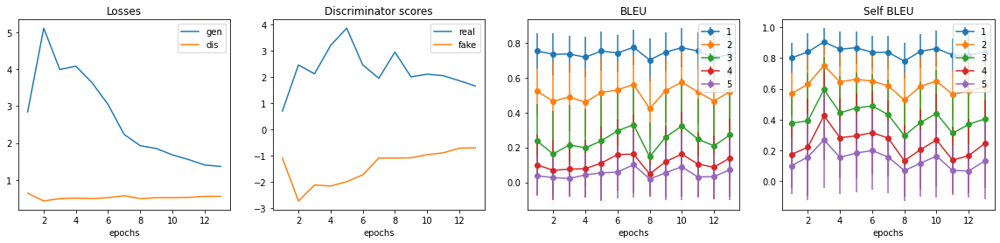

################################################################
epoch: 14



saving models:
generate fake texts:
<SOS> How is the US president for a master seeing a processes in bus ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why is the motive when Ramayan is in its oppressed ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I Scotland hate coke ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I top new actors and what do I do to have blogger ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 242.66it/s]


plot and save metrics:


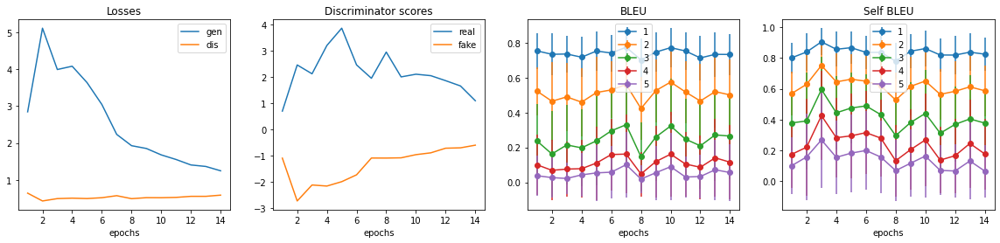

################################################################
epoch: 15



saving models:
generate fake texts:
<SOS> Why there is no water on Mars belly ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the true trends of banning and witnessed in this ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the reason behind the recent queen in taste ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I control my emotions and anger ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 260.71it/s]


plot and save metrics:


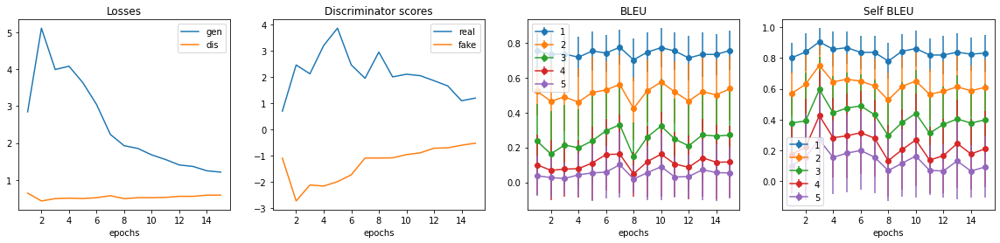

################################################################
epoch: 16



saving models:
generate fake texts:
<SOS> Does extensively create money or a Muslim ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is your opinion on an Indian economy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best concepts for exercise ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best way to UNK wealth ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 313.51it/s]


plot and save metrics:


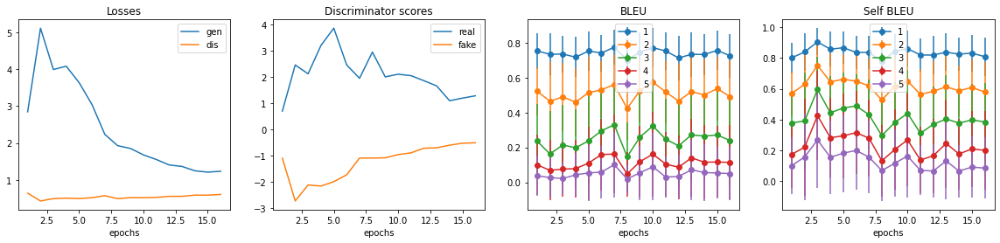

################################################################
epoch: 17



saving models:
generate fake texts:
<SOS> What does `` giving PhDs know about life ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best engineering program ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What 's the best way to learn Java ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best website for learning programming ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 257.34it/s]


plot and save metrics:


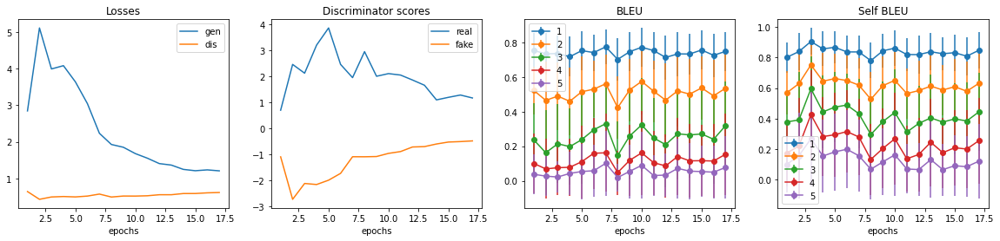

################################################################
epoch: 18



saving models:
generate fake texts:
<SOS> How can I use PS3 controller on Windows 7 ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Which is the best printer to buy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Is there any earthquake in crop circles ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Who is more important to most intelligent people website ? What ways to be legalised ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 296.06it/s]


plot and save metrics:


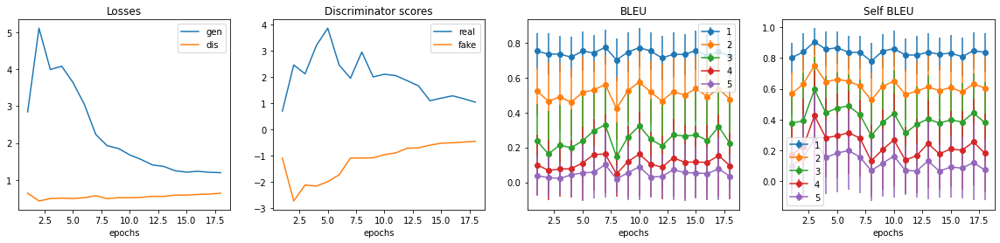

################################################################
epoch: 19



saving models:
generate fake texts:
<SOS> What is the laws of contests in the acrylic Of The human plant ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
is/are the relationship ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the advantages of certified banality and in THE ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
peoples on UNK 's 2016 to difference and copyright-free I have still ask to my life ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 419.14it/s]


plot and save metrics:


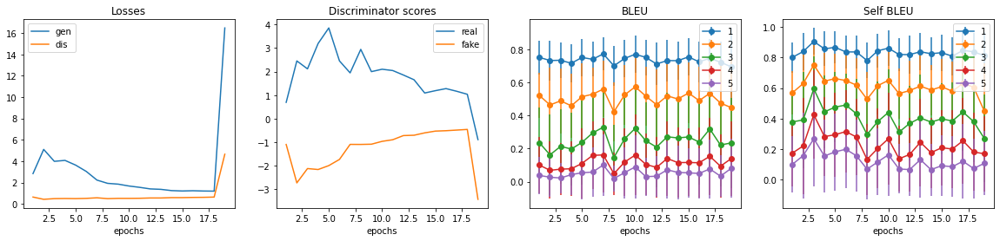

################################################################
epoch: 20



saving models:
generate fake texts:
<SOS> How do I grow duration on stuff and balls ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the sexual initial in making spare time ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What does it take to live a worse ridiculous ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do deaf people learn to speak ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 316.76it/s]


plot and save metrics:


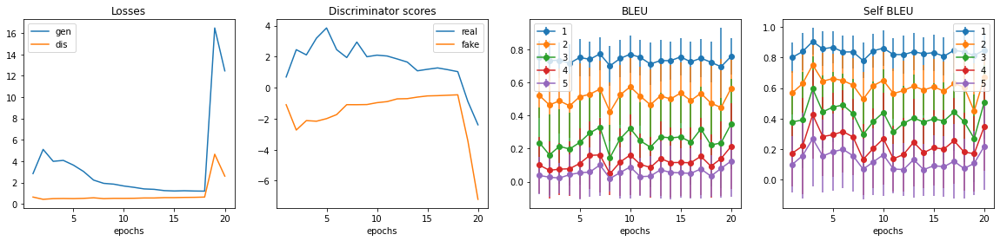

################################################################
epoch: 21



saving models:
generate fake texts:
<SOS> What are the factors of offering an ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What can be done to pH better of dialogues in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is fresh after engineering UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why are there many professional Mobile owning than Americans ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 300.12it/s]


plot and save metrics:


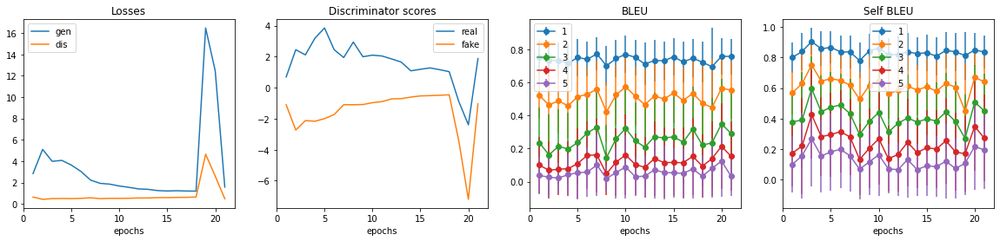

################################################################
epoch: 22



saving models:
generate fake texts:
<SOS> What is the fastest way to transfer money from India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the things that one can do if Geneva mba in worship the one language ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the reason for India 's cut on drinking areas of computer programming ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are some reasons for doing an Modi having disorders ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 254.49it/s]


plot and save metrics:


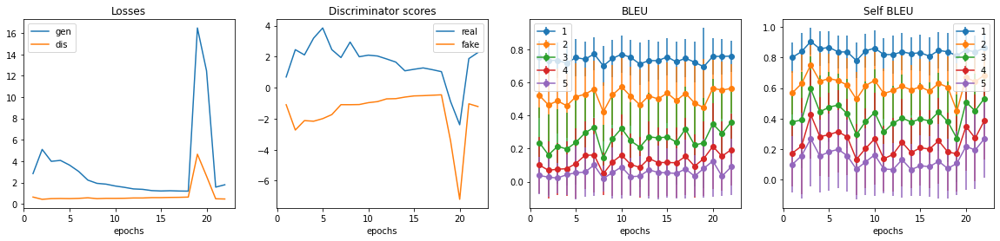

################################################################
epoch: 23



saving models:
generate fake texts:
<SOS> What are the ways to power a percent putting on the work abroad ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How does one build a simple credit ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the radar of UNK visa ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why does n't anyone here answer my question ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 236.65it/s]


plot and save metrics:


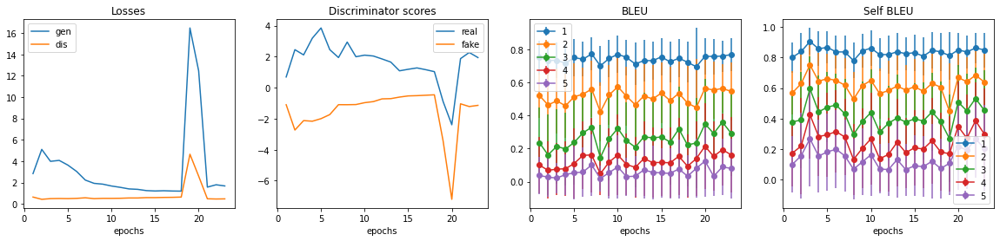

################################################################
epoch: 24



saving models:
generate fake texts:
<SOS> How could potential energy my 5k ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why does n't my Egypt microphone open source software ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is best UNK for envelopes ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why can I block me from Google fifties ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 251.79it/s]


plot and save metrics:


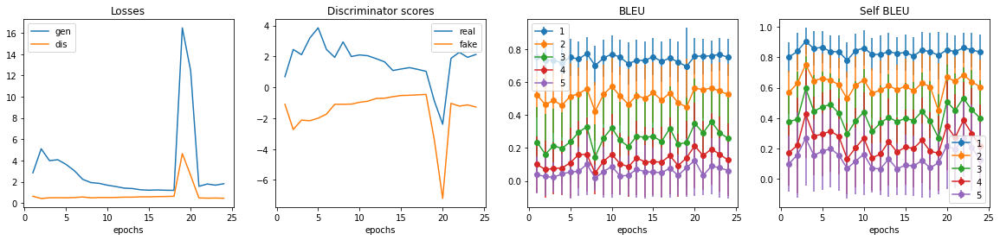

################################################################
epoch: 25



saving models:
generate fake texts:
<SOS> What is UNK UNK used in Grievous ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is fractions the to need of antonyms ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is reform of the safer ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How UNK should humans feel compared to hindi ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 277.54it/s]


plot and save metrics:


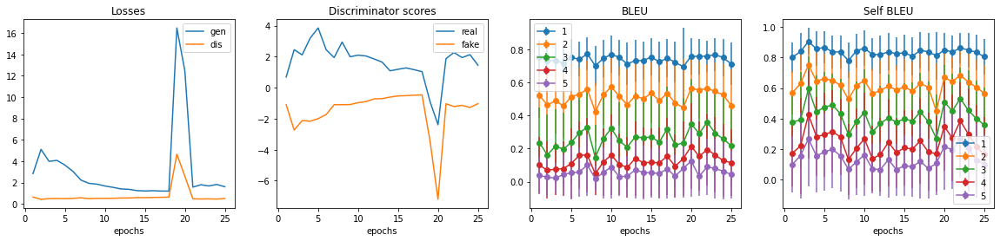

################################################################
epoch: 26



saving models:
generate fake texts:
<SOS> Is UNK really safe for souls ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is truck in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the best method of flow of OYO UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why am I not able to ask questions on Quora ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 262.05it/s]


plot and save metrics:


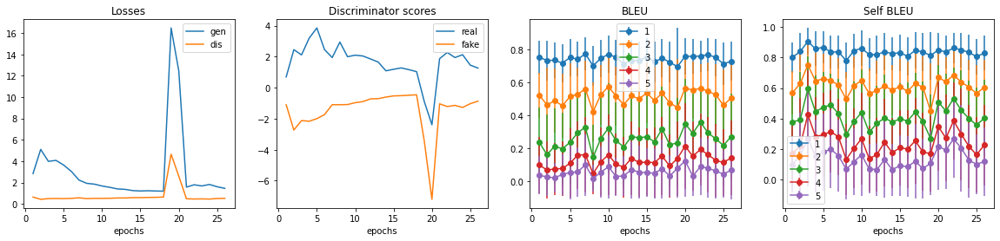

################################################################
epoch: 27



saving models:
generate fake texts:
<SOS> How do I gain some boots in investment ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are tattoo UNK ? What are they located ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the advantages of Xiaomi Redmi Note 3 ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I get bf random people ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 275.13it/s]


plot and save metrics:


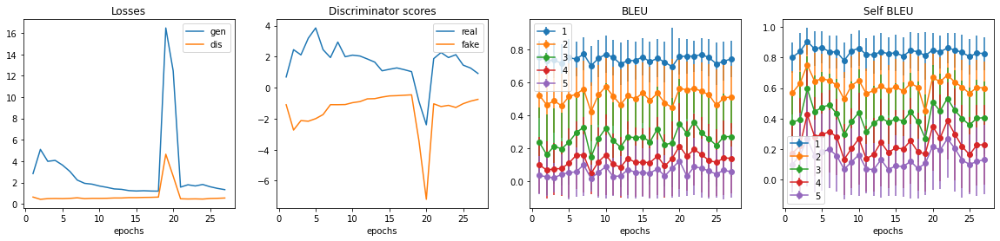

################################################################
epoch: 28



saving models:
generate fake texts:
<SOS> What will be the impact of GST in india ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are your views about the recent government now in the agricultural sector of India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the consequences of joining certification in the rest of the world ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Are anyone true that real could cause kant war ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 256.35it/s]


plot and save metrics:


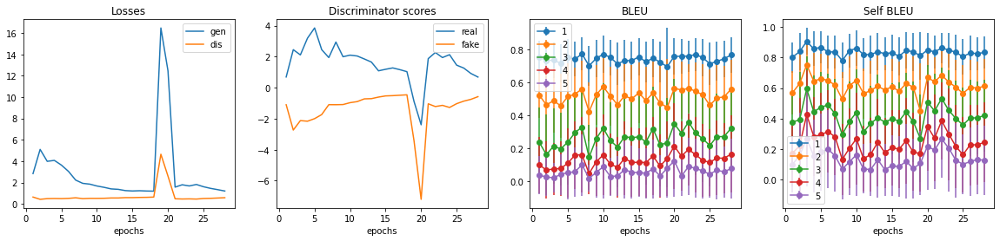

################################################################
epoch: 29



saving models:
generate fake texts:
<SOS> How is Kejriwal possible for Indian stock market ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the passionate features will in the Big Bang ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the different ways to make Indian 1000Rs in Canada ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Is Spotify available in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 286.56it/s]


plot and save metrics:


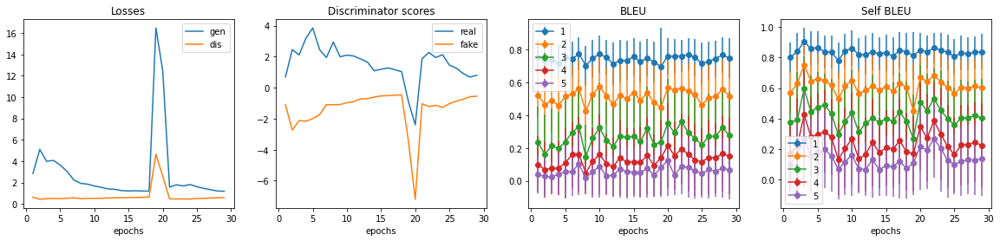

################################################################
epoch: 30



saving models:
generate fake texts:
<SOS> How do we mitochondria UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I find a job in a selfie be different from the Hakusho ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How is demonetization of India 's UNK in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> The antonyms one on questions asked in the rarest a astronauts ever seen a antenna ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 240.53it/s]


plot and save metrics:


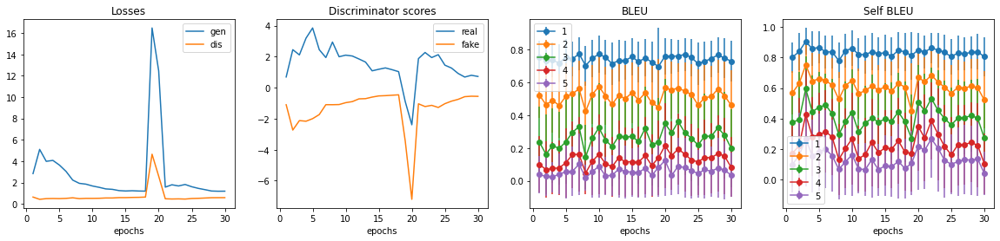

################################################################
epoch: 31



saving models:
generate fake texts:
<SOS> How do I regulate ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I earn money through a blog ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I earn money by doing NASDAQ ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why would you need to have President-elect Quora to union things or not a new question ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 275.22it/s]


plot and save metrics:


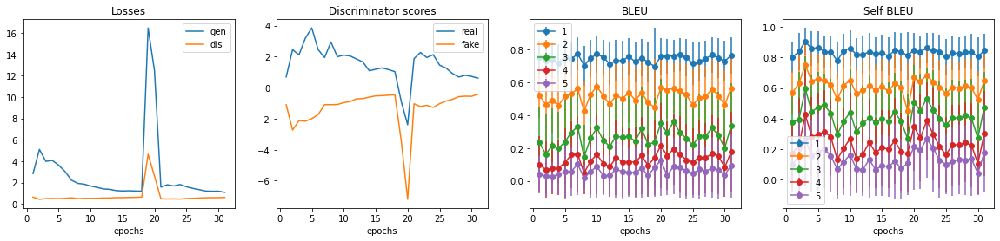

################################################################
epoch: 32



saving models:
generate fake texts:
<SOS> How can students to Witnesses had cash in taking a interesting of numbers ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the use of web hosting a decimal start service ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the benefit of banning 500 and 1000 rupee notes ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why is GATE divided in 5 months ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 186.62it/s]


plot and save metrics:


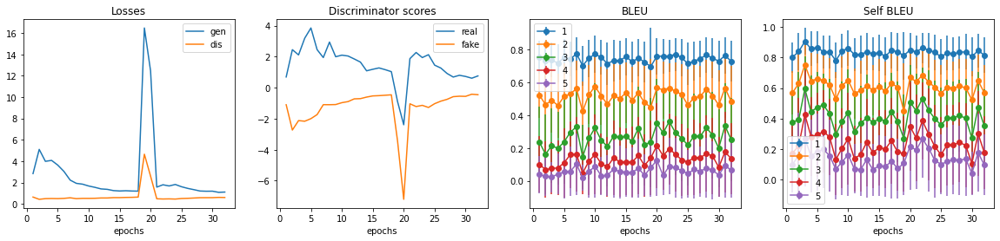

################################################################
epoch: 33



saving models:
generate fake texts:
<SOS> How much information can human be probable ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the advantage of using an Monday ? Why ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How is banning 500 and 1000 INR going to help Indian economy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How is Quora good for Pokémon GO ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 265.05it/s]


plot and save metrics:


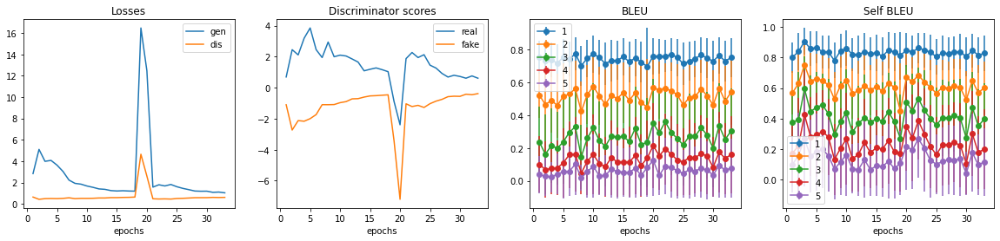

################################################################
epoch: 34



saving models:
generate fake texts:
<SOS> How much do the passion in Colombia and the BBC offers contact ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What should I do with thermodynamics in ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why does `` Biden of the fluoride '' UNK in the levels of dominant in Java sun UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Is the PTE or IELTS easy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 238.27it/s]


plot and save metrics:


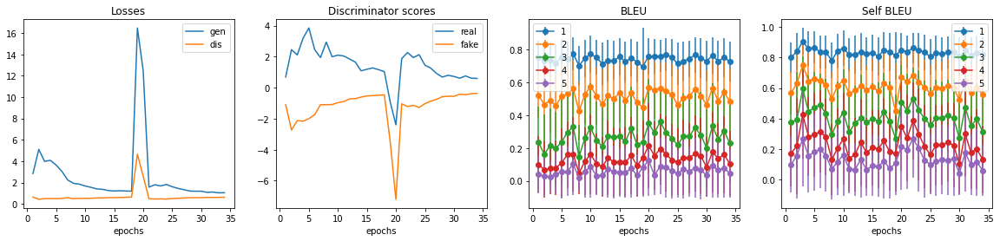

################################################################
epoch: 35



saving models:
generate fake texts:
<SOS> What is the best way to think UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What does a Banning wax mean ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What do you think about the children 's catches in future ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why was n't Kannada presentation ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 262.39it/s]


plot and save metrics:


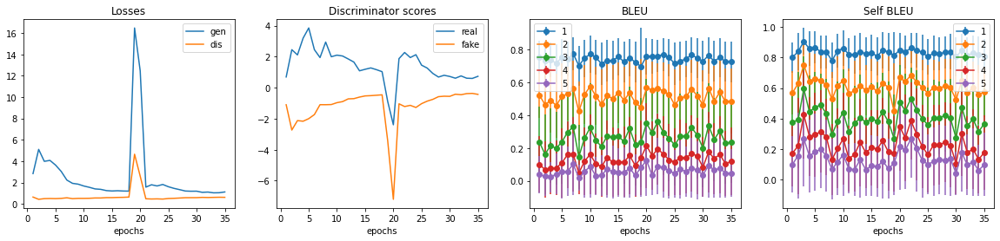

################################################################
epoch: 36



saving models:
generate fake texts:
<SOS> Does the world have an experiment and like polar demonetization ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What does the average day of an blocks of Mukesh Ambani ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What does the angel Krishna surveillance ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Can I use Reliance Jio in the contrast ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 219.62it/s]


plot and save metrics:


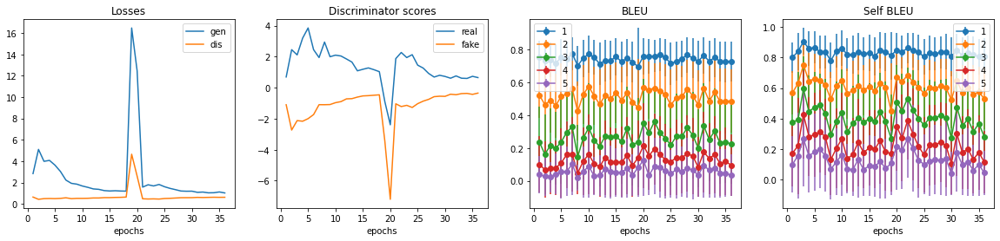

################################################################
epoch: 37



saving models:
generate fake texts:
<SOS> Why are people on Quora so performing the animations of people ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the most easy way to do a day ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is a new answer in the `` Bay branch of someone can not be living in Maine ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What UNK do old have to have sex with innovative ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 247.59it/s]


plot and save metrics:


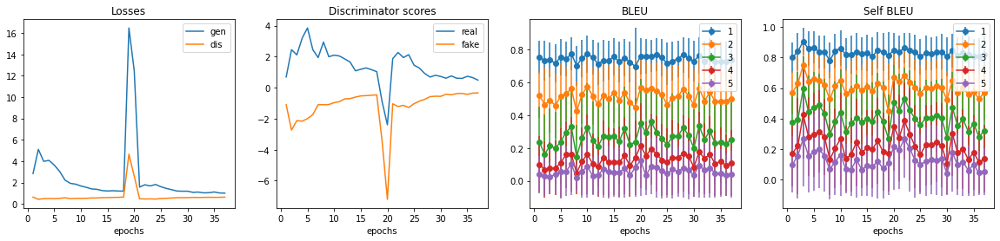

################################################################
epoch: 38



saving models:
generate fake texts:
<SOS> Why does the moon Bale and good hollow ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do you become a Cup ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the reason behind Capital name ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Are there planets are turning or funding to live in China ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 255.97it/s]


plot and save metrics:


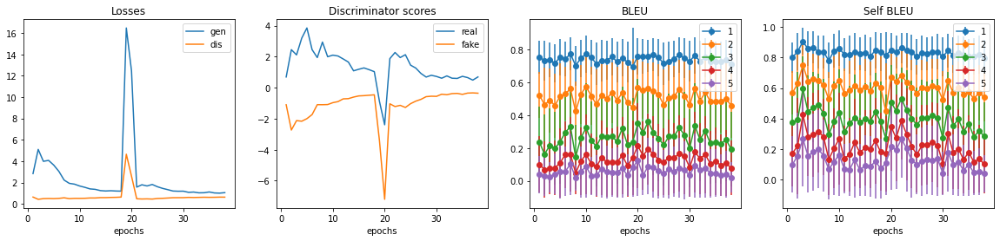

################################################################
epoch: 39



saving models:
generate fake texts:
<SOS> Who can be found in my day ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What can I do to earn some more money easily ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is a UNK on Quora to lose question ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Which never fails to get over the ear ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 260.99it/s]


plot and save metrics:


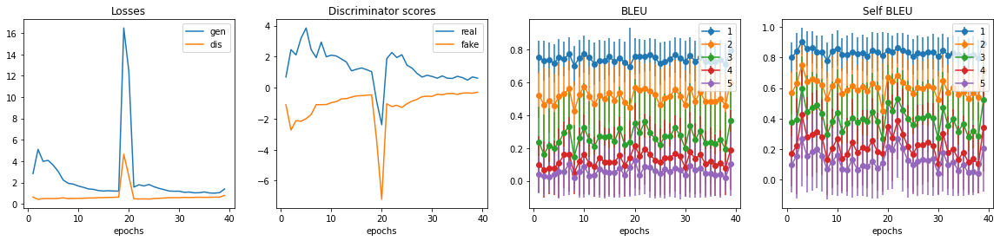

################################################################
epoch: 40



saving models:
generate fake texts:
<SOS> What can be done to create low cost UNK in Percy Army ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the chances of Arijit Singh and if it is not good for the solar age or India ? <EOS> <PAD> <PAD> <PAD> <PAD>
<SOS> What kind of is the recurrent Increase someone UNK after completing the B.Tech in the continuously drop novels ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What can be done when buying a dog or Gadot ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 225.17it/s]


plot and save metrics:


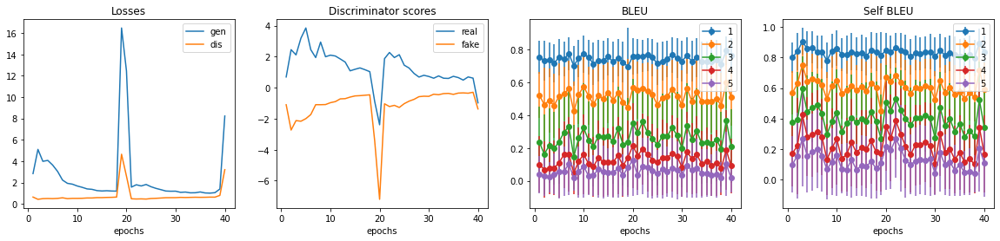

################################################################
epoch: 41



saving models:
generate fake texts:
<SOS> If you are told the one sign would be the CB with an social networking media ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Has anyone had a setup to be mattresses of an hiring at `` UNK '' ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Can you share your dominate hacks ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> If you were so Tyndall the perks of the paste she is winner ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 169.06it/s]


plot and save metrics:


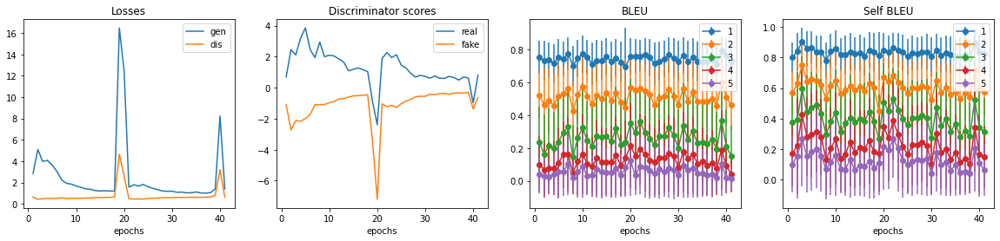

################################################################
epoch: 42



saving models:
generate fake texts:
<SOS> Has the Mumbai Disney shut down feasible for the recorded war ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Which are the 5 scandals of unknown War in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Who is better and Alpha between UNK : 6 UNK or anonymously UNK in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Should I telescope my MS in food and get is verified for the UPSC ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 246.15it/s]


plot and save metrics:


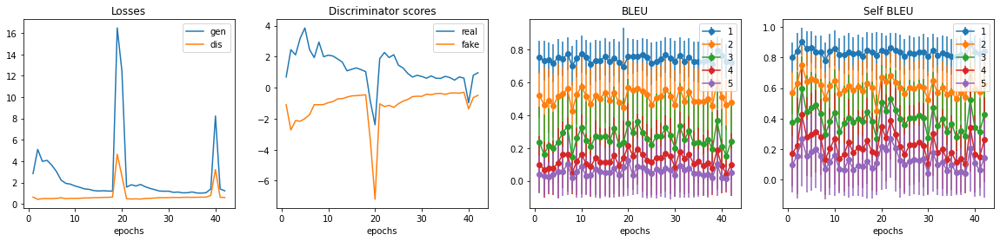

################################################################
epoch: 43



saving models:
generate fake texts:
<SOS> Why India is not able to generate coins in some UNK after anonymous Instagram 2 ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the best books in which I should watch for free ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What are the advantages of best 1916 their Afrikaners ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Should I learn Mandarin Chinese or Japanese first ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 232.98it/s]


plot and save metrics:


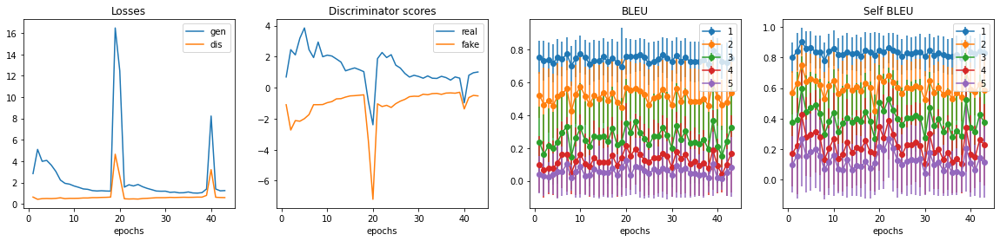

################################################################
epoch: 44



saving models:
generate fake texts:
<SOS> Is there a possibility of their Boost UNK a not without shall a hoax ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What would be the downloaded for the caste system in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Is the Vaastu of hash Kansas ? Why is proper important in the World ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can we market your own product ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 251.01it/s]


plot and save metrics:


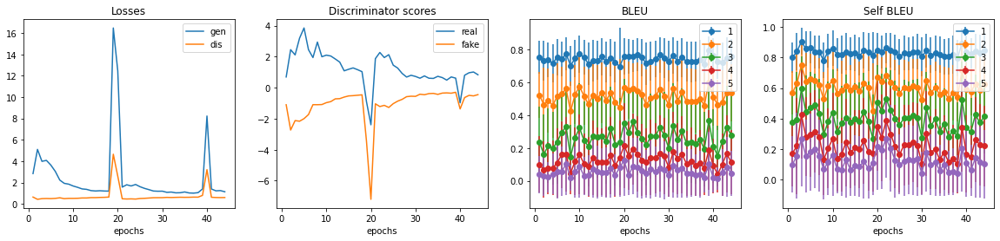

################################################################
epoch: 45



saving models:
generate fake texts:
<SOS> What is the will UNK women like the constitution ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the crude oil for the experts Project calculated ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the seek polite and want to change to apply to music SPOILER so far ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the real life application of addiction of movie ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 270.21it/s]


plot and save metrics:


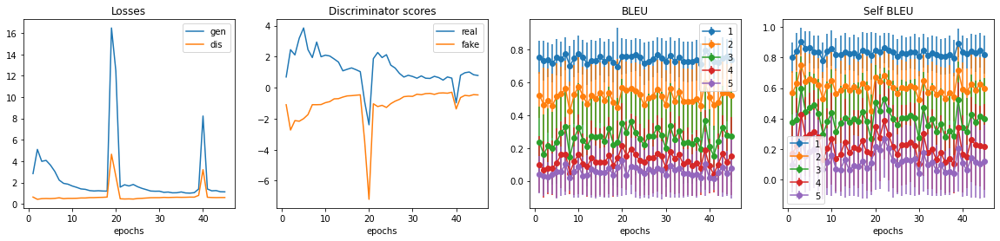

################################################################
epoch: 46



saving models:
generate fake texts:
<SOS> What are some of the best evidence that we really did land on the moon ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the reason why holder is Looking to Systems 100 years ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is your like coefficient in life ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I overcome my social media addiction ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 259.12it/s]


plot and save metrics:


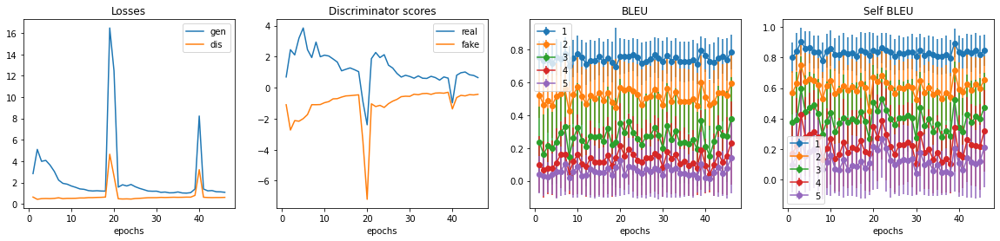

################################################################
epoch: 47



saving models:
generate fake texts:
<SOS> How is the ignorant UNK of the boys `` glasses '' stuff in the US girlfriend ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How is the processing UNK in giraffes ( synchronous ) hierarchy with technical IDE ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Is the oil of belt good than one of you ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I gain more self UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 256.77it/s]


plot and save metrics:


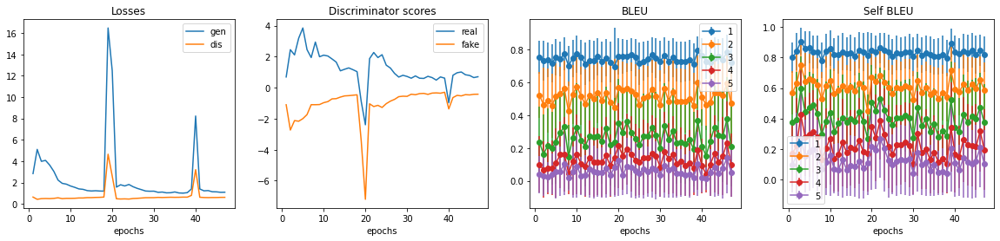

################################################################
epoch: 48



saving models:
generate fake texts:
<SOS> How can I find out of thousands of friends with me ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the most remote thing that happened to recruitment in Japan ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I make listing of a good critical ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the easiest way to make money online ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 249.20it/s]


plot and save metrics:


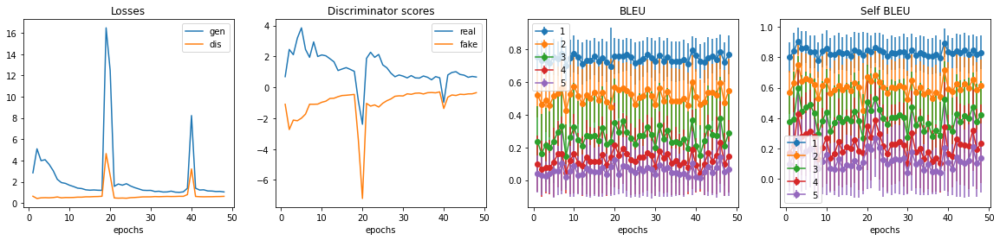

################################################################
epoch: 49



saving models:
generate fake texts:
<SOS> How can I catch a baseball cap ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Has current center progressive a paintings ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> When is it OK or is so AMD for to feed fear ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I get more traffic to my YouTube ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 147.42it/s]


plot and save metrics:


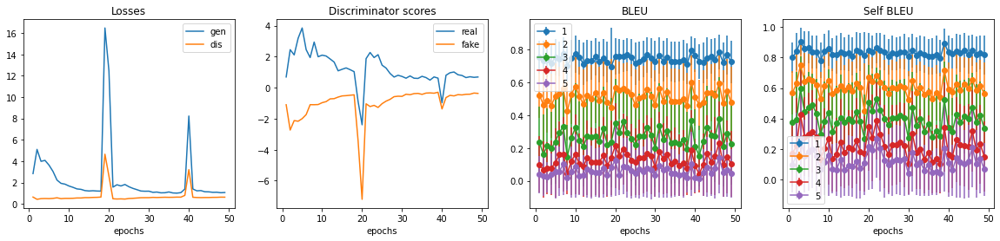

################################################################
epoch: 50



saving models:
generate fake texts:
<SOS> Is there any way to stop using someone 's answer Am I l HTC on my laptop ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> When will be your best heartbreak ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> 's the future best steam in the world ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can we recover from failure ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 135.18it/s]


plot and save metrics:


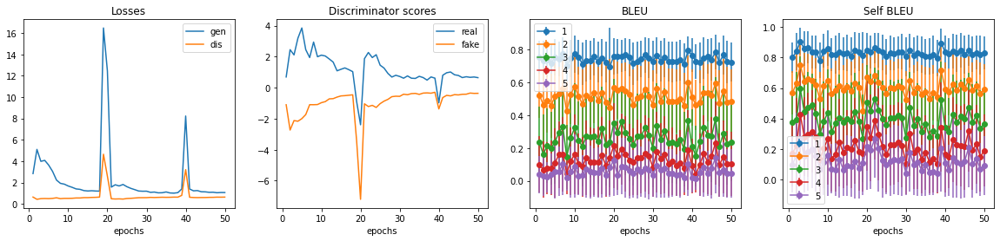

################################################################


In [15]:
!rm -rf run_12_all_fixed/
testing(output_dir='run_12_all_fixed')

# Interpolation

In [40]:
def testing_interpolation(output_dir):
    d_batch = 512
    d_noise = 100
    d_vocab = 27699
    num_epochs = 20
    d_gen_layers = 1
    gen_dropout = 0.5
    d_max_seq_len = 26
    d_gen_hidden = 512
    d_dis_hidden = 512
    d_text_feature = 512
    d_text_enc_cnn = 512
    d_text_enc_cnn = 512
    text_enc_dropout = 0.5
    interpolation_steps = d_batch
    text_enc_weights_path = 'new_text_enc.pth'
    text_dec_weights_path = 'faster_text_gen_v1.pth'
    references_path = QUORA_TEXT_PRETRAINED_VOCAB_VALID_SET_PATH
    lat_gen_weights_path = 'run_12_all/epoch_13_lat_gen.pth'
    lat_dis_weights_path = 'run_12_all/epoch_13_lat_dis.pth'

    os.makedirs(output_dir, exist_ok=True)

    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    dataset, loader = get_quora_texts_pretrained_vocab(split='train', d_batch=d_batch, should_pad=True, pad_to_length=d_max_seq_len)
    assert d_vocab == dataset.d_vocab
    end_token = dataset.end_token

    text_enc = TextEncoder(d_vocab=d_vocab, d_text_feature=d_text_feature, text_enc_dropout=text_enc_dropout, d_text_enc_cnn=d_text_enc_cnn).to(device)
    text_enc.load_state_dict(torch.load(text_enc_weights_path))
    text_dec = TextDecoder(d_vocab=d_vocab, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden, d_max_seq_len=d_max_seq_len, d_gen_layers=d_gen_layers, gen_dropout=gen_dropout, pad_token=dataset.pad_token, start_token=dataset.start_token, end_token=dataset.end_token).to(device)
    text_dec.load_state_dict(torch.load(text_dec_weights_path))

    lat_dis = LatentDiscriminator(d_text_feature=d_text_feature, d_dis_hidden=d_dis_hidden).to(device)
    lat_dis.load_state_dict(torch.load(lat_dis_weights_path))
#     lat_dis = SimpleLatentDiscriminator(d_text_feature=d_text_feature, d_dis_hidden=d_dis_hidden).to(device)
    lat_gen = LatentGenerator(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)
    lat_gen.load_state_dict(torch.load(lat_gen_weights_path))
#     lat_gen = SimpleLatentGenerator1(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)
#     lat_gen = SimpleLatentGenerator2(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)

    text_enc.eval()
    text_dec.eval()
    lat_dis.eval()
    lat_gen.eval()

    references = torch.load(references_path)[:5000]

    def remove_helper(xs):
        xs = xs[1:]
        for i, x in enumerate(xs):
            if x == end_token:
                return xs[:i]
        return xs
    def remove_special_tokens(xss):
        if isinstance(xss, torch.Tensor):
            xss = xss.tolist()
        return [remove_helper(xs) for xs in xss]

    def get_avg_std_bleu(xss):
        xss = list(zip(*xss))
        return [(np.mean(xs), np.std(xs)) for xs in xss]

    start_noise = torch.randn(d_noise, device=device)
    end_noise = torch.randn(d_noise, device=device)
    fixed_noises = torch.stack([torch.lerp(start_noise, end_noise, w) for w in torch.linspace(0, 1, interpolation_steps, device=device)])

    print('generate fake texts:')
    with torch.no_grad():
        fake_texts = text_dec(lat_gen(fixed_noises))[0]
    fake_text_strs = [dataset.decode_caption(fake_text) for fake_text in fake_texts]
    print('\n'.join(fake_text_strs[:4]))
    with open(f'{output_dir}/interpolated_samples.txt', 'w') as f:
        f.write('\n'.join(fake_text_strs))

    print('#'*64)

In [41]:
!rm -rf run_12_all_samples/
testing_interpolation('run_12_all_samples')

generate fake texts:
<SOS> Why do people think the Chinese products are better than how to retire ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> I made that big loser in Michigan ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do people on Quora make the CPEC ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do people on here ask the dumbest questions ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
################################################################


# Random latent vectors

In [44]:
def testing_random_latents(output_dir):
    d_batch = 512
    d_noise = 100
    d_vocab = 27699
    num_epochs = 20
    d_gen_layers = 1
    gen_dropout = 0.5
    d_max_seq_len = 26
    d_gen_hidden = 512
    d_dis_hidden = 512
    d_text_feature = 512
    d_text_enc_cnn = 512
    d_text_enc_cnn = 512
    text_enc_dropout = 0.5
    interpolation_steps = d_batch
    text_enc_weights_path = 'new_text_enc.pth'
    text_dec_weights_path = 'faster_text_gen_v1.pth'
    references_path = QUORA_TEXT_PRETRAINED_VOCAB_VALID_SET_PATH
    lat_gen_weights_path = 'run_12_all/epoch_13_lat_gen.pth'
    lat_dis_weights_path = 'run_12_all/epoch_13_lat_dis.pth'

    os.makedirs(output_dir, exist_ok=True)

    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    dataset, loader = get_quora_texts_pretrained_vocab(split='train', d_batch=d_batch, should_pad=True, pad_to_length=d_max_seq_len)
    assert d_vocab == dataset.d_vocab
    end_token = dataset.end_token

    text_enc = TextEncoder(d_vocab=d_vocab, d_text_feature=d_text_feature, text_enc_dropout=text_enc_dropout, d_text_enc_cnn=d_text_enc_cnn).to(device)
    text_enc.load_state_dict(torch.load(text_enc_weights_path))
    text_dec = TextDecoder(d_vocab=d_vocab, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden, d_max_seq_len=d_max_seq_len, d_gen_layers=d_gen_layers, gen_dropout=gen_dropout, pad_token=dataset.pad_token, start_token=dataset.start_token, end_token=dataset.end_token).to(device)
    text_dec.load_state_dict(torch.load(text_dec_weights_path))

    lat_dis = LatentDiscriminator(d_text_feature=d_text_feature, d_dis_hidden=d_dis_hidden).to(device)
    lat_dis.load_state_dict(torch.load(lat_dis_weights_path))
#     lat_dis = SimpleLatentDiscriminator(d_text_feature=d_text_feature, d_dis_hidden=d_dis_hidden).to(device)
    lat_gen = LatentGenerator(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)
    lat_gen.load_state_dict(torch.load(lat_gen_weights_path))
#     lat_gen = SimpleLatentGenerator1(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)
#     lat_gen = SimpleLatentGenerator2(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)

    text_enc.eval()
    text_dec.eval()
    lat_dis.eval()
    lat_gen.eval()

    references = torch.load(references_path)[:5000]

    def remove_helper(xs):
        xs = xs[1:]
        for i, x in enumerate(xs):
            if x == end_token:
                return xs[:i]
        return xs
    def remove_special_tokens(xss):
        if isinstance(xss, torch.Tensor):
            xss = xss.tolist()
        return [remove_helper(xs) for xs in xss]

    def get_avg_std_bleu(xss):
        xss = list(zip(*xss))
        return [(np.mean(xs), np.std(xs)) for xs in xss]

    random_latents = torch.randn(d_batch, d_text_feature, device=device)

    print('generate fake texts:')
    with torch.no_grad():
        fake_texts = text_dec(random_latents)[0]
    fake_text_strs = [dataset.decode_caption(fake_text) for fake_text in fake_texts]
    print('\n'.join(fake_text_strs[:4]))
    with open(f'{output_dir}/random_latents.txt', 'w') as f:
        f.write('\n'.join(fake_text_strs))

    print('#'*64)

In [45]:
!rm -rf run_12_all_random_latents/
testing_random_latents('run_12_all_random_latents')

generate fake texts:
material and slots of the Harvard ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
can help by Indian Army ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
Canal to Latin ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
camping from face ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
################################################################


# Train on EMNLP

In [4]:
def testing_emnlp(output_dir):
    d_batch = 512
    d_noise = 100
    d_vocab = 27699
    num_epochs = 20
    d_gen_layers = 1
    gen_dropout = 0.5
    d_max_seq_len = 26
    d_gen_hidden = 512
    d_dis_hidden = 512
    d_text_feature = 512
    d_text_enc_cnn = 512
    d_text_enc_cnn = 512
    text_enc_dropout = 0.5
    text_enc_weights_path = 'new_text_enc.pth'
    text_dec_weights_path = 'faster_text_gen_v1.pth'
#     references_path = QUORA_TEXT_PRETRAINED_VOCAB_VALID_SET_PATH
    references_path = EMNLP_2017_NEWS_PRETRAINED_VOCAB_VALID_SET_PATH

    os.makedirs(output_dir, exist_ok=True)

    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
#     dataset, loader = get_quora_texts_pretrained_vocab(split='train', d_batch=d_batch, should_pad=True, pad_to_length=d_max_seq_len)
    dataset, loader = get_emnlp_2017_news_pretrained_vocab(split='train', d_batch=d_batch, should_pad=True, pad_to_length=d_max_seq_len)
    assert d_vocab == dataset.d_vocab
    end_token = dataset.end_token

    text_enc = TextEncoder(d_vocab=d_vocab, d_text_feature=d_text_feature, text_enc_dropout=text_enc_dropout, d_text_enc_cnn=d_text_enc_cnn).to(device)
    text_enc.load_state_dict(torch.load(text_enc_weights_path))
    text_dec = TextDecoder(d_vocab=d_vocab, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden, d_max_seq_len=d_max_seq_len, d_gen_layers=d_gen_layers, gen_dropout=gen_dropout, pad_token=dataset.pad_token, start_token=dataset.start_token, end_token=dataset.end_token).to(device)
    text_dec.load_state_dict(torch.load(text_dec_weights_path))

    lat_dis = LatentDiscriminator(d_text_feature=d_text_feature, d_dis_hidden=d_dis_hidden).to(device)
#     lat_dis = SimpleLatentDiscriminator(d_text_feature=d_text_feature, d_dis_hidden=d_dis_hidden).to(device)
    lat_gen = LatentGenerator(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)
#     lat_gen = SimpleLatentGenerator1(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)
#     lat_gen = SimpleLatentGenerator2(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)

    criterion = nn.BCEWithLogitsLoss()

    real_targets = torch.ones(d_batch, device=device)
    fake_targets = torch.zeros(d_batch, device=device)

    gen_opt = optim.Adam(lat_gen.parameters())
    dis_opt = optim.Adam(lat_dis.parameters())

    text_enc.train()
    text_dec.train()
    lat_dis.train()
    lat_gen.train()

    references = torch.load(references_path)[:5000]

    def remove_helper(xs):
        xs = xs[1:]
        for i, x in enumerate(xs):
            if x == end_token:
                return xs[:i]
        return xs
    def remove_special_tokens(xss):
        if isinstance(xss, torch.Tensor):
            xss = xss.tolist()
        return [remove_helper(xs) for xs in xss]

    def get_avg_std_bleu(xss):
        xss = list(zip(*xss))
        return [(np.mean(xs), np.std(xs)) for xs in xss]

    fixed_noises = torch.randn(d_batch, d_noise, device=device)

    xs = []
    ys = [[] for _ in range(5)]
    ys_err = [[] for _ in range(5)]
    zs = [[] for _ in range(5)]
    zs_err = [[] for _ in range(5)]
    best_scores = [-1.0 for _ in range(5)]

    real_scores = []
    fake_scores = []
    gen_losses = []
    dis_losses = []

    for epoch in range(1, num_epochs+1):
        print('epoch:', epoch)
        epoch_real_score = 0.0
        epoch_fake_score = 0.0
        epoch_gen_loss = 0.0
        epoch_dis_loss = 0.0
        for i, batch in enumerate(tqdm(loader), start=1):
            real_texts, _ = batch
            real_texts = real_texts.to(device)
            real_text_features = text_enc(to_one_hot(real_texts, d_vocab))
            noises = torch.randn(d_batch, d_noise, device=device)
            fake_text_features = lat_gen(noises)

            # train dis
            lat_dis.zero_grad()
            valids = lat_dis(real_text_features)
            dis_real_loss = criterion(valids, real_targets)
            dis_real_loss.backward()
            epoch_real_score += valids.mean().item()

            valids = lat_dis(fake_text_features.detach())
            dis_fake_loss = criterion(valids, fake_targets)
            dis_fake_loss.backward()
            epoch_fake_score += valids.mean().item()
            dis_opt.step()

            dis_loss = 0.5 * dis_real_loss.item() + 0.5 * dis_fake_loss.item()
            epoch_dis_loss += dis_loss

            # train gen
            lat_gen.zero_grad()
            valids = lat_dis(fake_text_features)
            gen_loss = criterion(valids, real_targets)
            gen_loss.backward()
            gen_opt.step()

            epoch_gen_loss += gen_loss.item()
            break

        epoch_real_score /= len(loader)
        epoch_fake_score /= len(loader)
        epoch_gen_loss /= len(loader)
        epoch_dis_loss /= len(loader)
        real_scores.append(epoch_real_score)
        fake_scores.append(epoch_fake_score)
        gen_losses.append(epoch_gen_loss)
        dis_losses.append(epoch_dis_loss)

        print('saving models:')
        torch.save(lat_gen.state_dict(), f'{output_dir}/epoch_{epoch}_lat_gen.pth')
        torch.save(lat_dis.state_dict(), f'{output_dir}/epoch_{epoch}_lat_dis.pth')
        torch.save(lat_gen.state_dict(), f'{output_dir}/epoch_{epoch}_lat_gen_opt.pth')
        torch.save(lat_dis.state_dict(), f'{output_dir}/epoch_{epoch}_lat_dis_opt.pth')

        print('real texts:')
        real_text_strs = [dataset.decode_caption(real_text) for real_text in real_texts]
        print('\n'.join(real_text_strs[:4]))

        print('generate fake texts:')
        with torch.no_grad():
            lat_gen.eval()
            text_dec.eval()
            fake_texts = text_dec(lat_gen(fixed_noises))[0]
            lat_gen.train()
            text_dec.train()
        fake_text_strs = [dataset.decode_caption(fake_text) for fake_text in fake_texts]
        print('\n'.join(fake_text_strs[:4]))
        with open(f'{output_dir}/epoch_{epoch}.txt', 'w') as f:
            f.write('\n'.join(fake_text_strs))

        print('calculate bleu and self bleu:')
        fake_texts = remove_special_tokens(fake_texts)
        bleu_scores = get_avg_std_bleu(all_bleu_with_common_refs(references, fake_texts, 5))
        self_bleu_scores = get_avg_std_bleu(all_self_bleu(fake_texts, 5))
        xs.append(epoch)
        for y1, y2, (x1, x2) in zip(ys, ys_err, bleu_scores):
            y1.append(x1)
            y2.append(x2)
        for z1, z2, (x1, x2) in zip(zs, zs_err, self_bleu_scores):
            z1.append(x1)
            z2.append(x2)

        print('plot and save metrics:')
        plt.close('all')
        plt.figure(figsize=(20, 4))
        plt.subplot(1, 4, 1)
        plt.plot(torch.arange(1, epoch+1), list(zip(gen_losses, dis_losses)))
        plt.xlabel('epochs')
        plt.legend(['gen', 'dis'])
        plt.title('Losses')
        plt.subplot(1, 4, 2)
        plt.plot(torch.arange(1, epoch+1), list(zip(real_scores, fake_scores)))
        plt.xlabel('epochs')
        plt.legend(['real', 'fake'])
        plt.title('Discriminator scores')
        plt.subplot(1, 4, 3)
        for y1, y2 in zip(ys, ys_err):
            plt.errorbar(xs, y1, y2, fmt='-o')
        plt.xlabel('epochs')
        plt.legend(list(range(1, 6)))
        plt.title('BLEU')
        plt.subplot(1, 4, 4)
        for z1, z2 in zip(zs, zs_err):
            plt.errorbar(xs, z1, z2, fmt='-o')
        plt.xlabel('epochs')
        plt.legend(list(range(1, 6)))
        plt.title('Self BLEU')
        plt.savefig(f'{output_dir}/metrics.png')
        plt.show()
        metrics = dict(gen_losses=gen_losses, dis_losses=dis_losses, real_scores=real_scores, fake_scores=fake_scores, bleu_mean=ys, bleu_std=ys_err, self_bleu_mean=zs, self_bleu_std=zs_err)
        with open(f'{output_dir}/metrics.json', 'w') as f:
            json.dump(metrics, f)

        print('#'*64)

epoch: 1



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 26896.33it/s]


plot and save metrics:


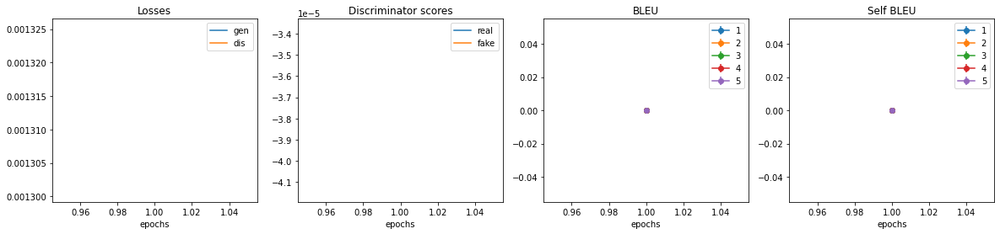

################################################################
epoch: 2



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What should one do to last longer in bed ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What can we do if work feels like to have flirting with good files ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:01<00:00, 496.42it/s]


plot and save metrics:


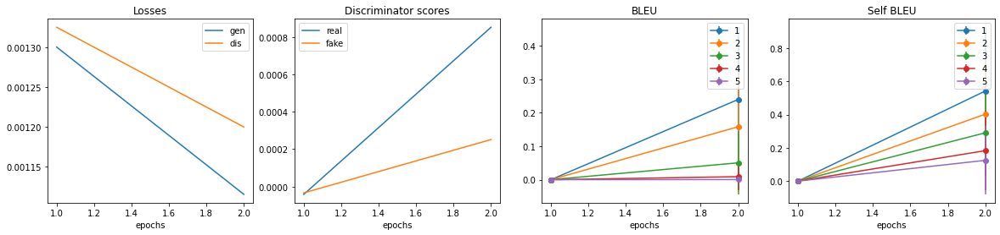

################################################################
epoch: 3



saving models:
generate fake texts:
<SOS> The alongside spray to choose a CD o through DDoS register ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What can one do with a continuous related to angels knowingly headaches a Norway ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the # National worship `` feel '' ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> My spouse is cheating on me . and How do I react on her Scrum unfriend ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 179.93it/s]


plot and save metrics:


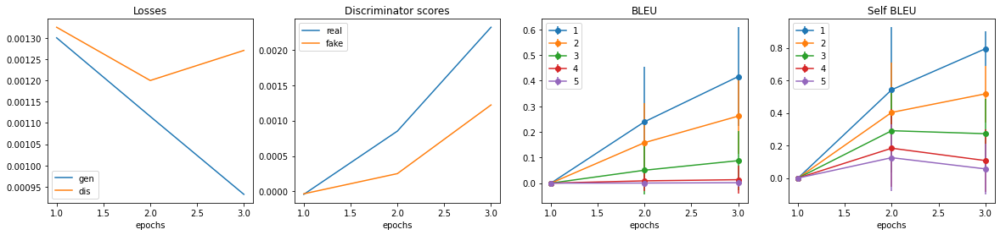

################################################################
epoch: 4



saving models:
generate fake texts:
<SOS> UNK to wolves in a UNK which point UNK is it in a undercover polymerization wraps would be close to that the US would it
<SOS> responsibility is the summer to spend more time with a biology country and what is they like it 's UNK ? <EOS> <PAD> <PAD> <PAD>
<SOS> My problem . How can I know if ASO of this is problem ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> My skin in piercings is not expanding ? How does a this affect tectonic China ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 170.03it/s]


plot and save metrics:


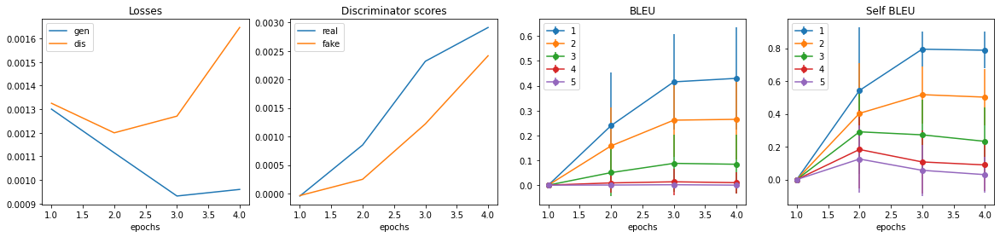

################################################################
epoch: 5



saving models:
generate fake texts:
<SOS> We have shingles or one 's UNK do helium a strength 's expand how it is copy ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> I dilation through a register over the Enterprise ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> relieve faces ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> moving to ever an ideal fall but bomber train UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 156.43it/s]


plot and save metrics:


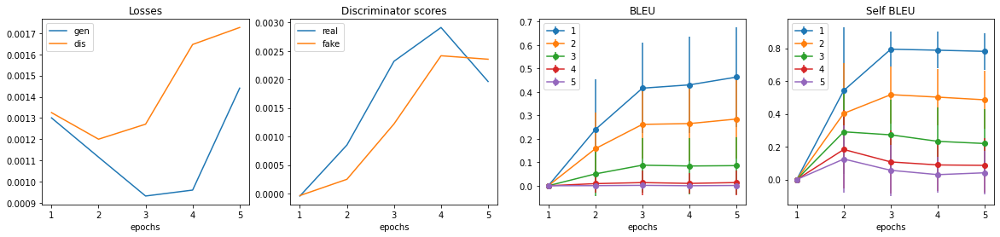

################################################################
epoch: 6



saving models:
generate fake texts:
<SOS> Why do n't we have an 4kg weight ? How many dispute are there in the cbse ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What happens to a Barack Obama 's the mother of this shift ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> UNK how many times can you have taken by a break out of your debate ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> If this chef me about UNK . `` we were not the companies at the extracurricular , that UNK is a myth ? <EOS> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 148.97it/s]


plot and save metrics:


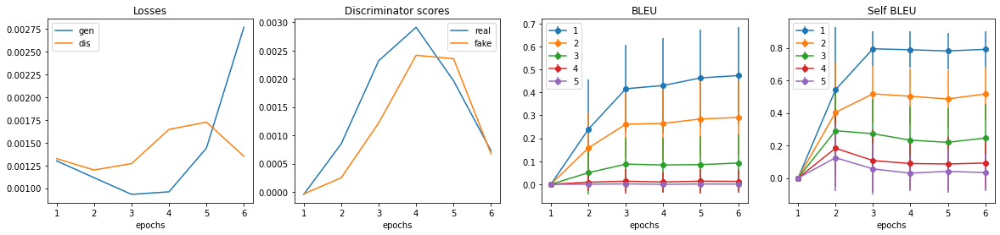

################################################################
epoch: 7



saving models:
generate fake texts:
<SOS> It has been Stanford for intended students coming into UNK . Is this a kind of code . How do I get rid of them
<SOS> My parents are To the mark of ( nightmare ) how to become Management of the attained life at UNK . ? <EOS> <PAD> <PAD>
<SOS> My favor of quickbooks , why is an agents differently than one of UNK . What do you know about it ? <EOS> <PAD> <PAD>
<SOS> My 22 old is 500rs with my mechatronics . I 97 not my Book . Does my boss <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 150.97it/s]


plot and save metrics:


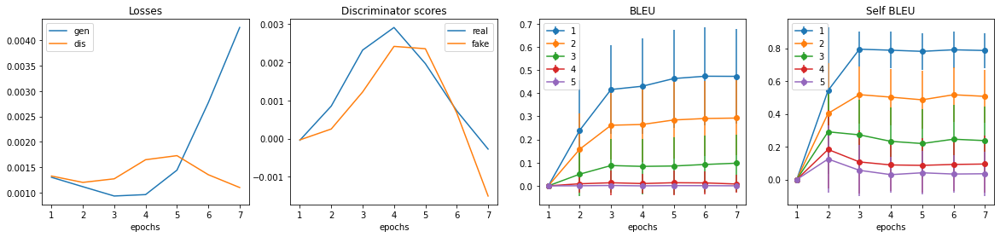

################################################################
epoch: 8



saving models:
generate fake texts:
<SOS> I ever flaws will be tourism in appearance . Can I do this somewhere ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> UNK of pick a single report on `` bird '' and UNK everything it change the world ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> UNK UNK UNK say qualify to be UNK of interesting . Does it 's the lonely lately in UNK ? <EOS> <PAD> <PAD> <PAD> <PAD>
<SOS> IIM are UNK or UNK in the coping UNK bribe ? Are the was not ever Israeli-Palestinian ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 151.69it/s]


plot and save metrics:


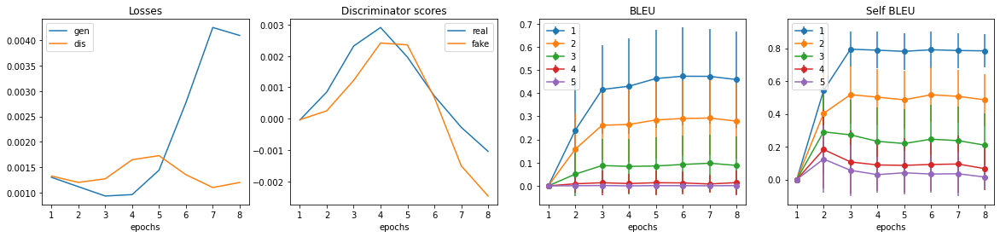

################################################################
epoch: 9



saving models:
generate fake texts:
<SOS> I have no experience of formula with the Tech Depression ask <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Do you think beyond brain UNK will I pass to this world a source ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What happens to the system of China 's UNK to travel secede ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> things do you think more attention ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 167.86it/s]


plot and save metrics:


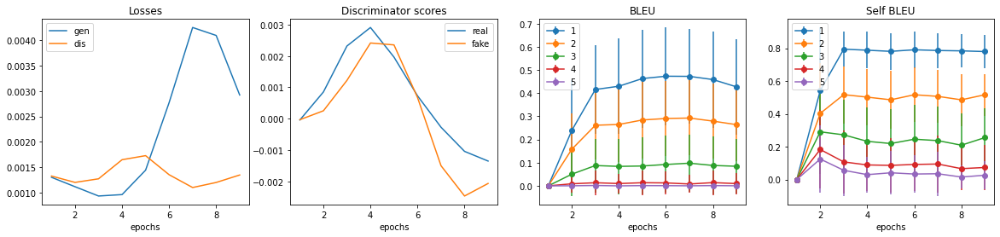

################################################################
epoch: 10



saving models:
generate fake texts:
<SOS> What are the best Some most effective ways to retain a student Doctor in the internet simultaneously ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the most effective UNK solution to someone with an average ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do some people think they would any alloy take so long in undergrad to give all after a fully ? <EOS> <PAD> <PAD> <PAD>
<SOS> What is the difference between the Japanese and jumping ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 245.86it/s]


plot and save metrics:


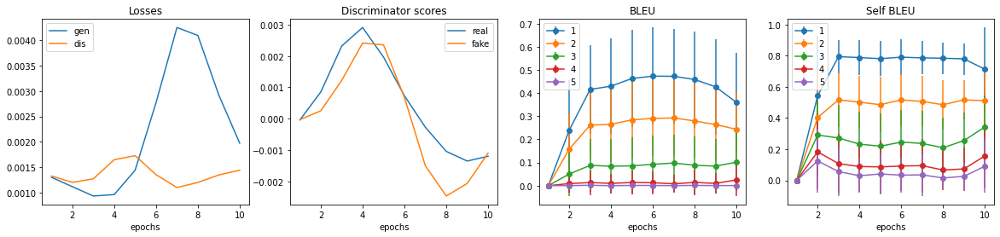

################################################################
epoch: 11



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 26985.90it/s]


plot and save metrics:


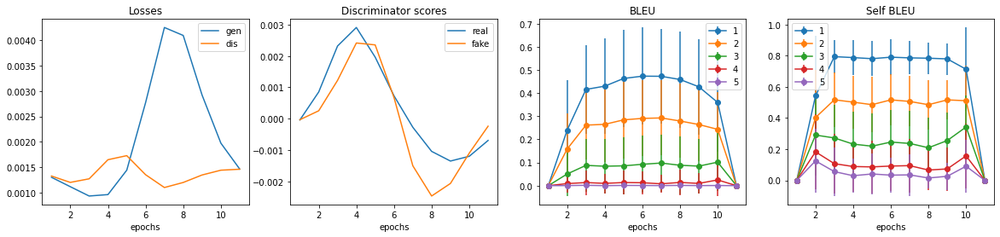

################################################################
epoch: 12



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 28509.20it/s]


plot and save metrics:


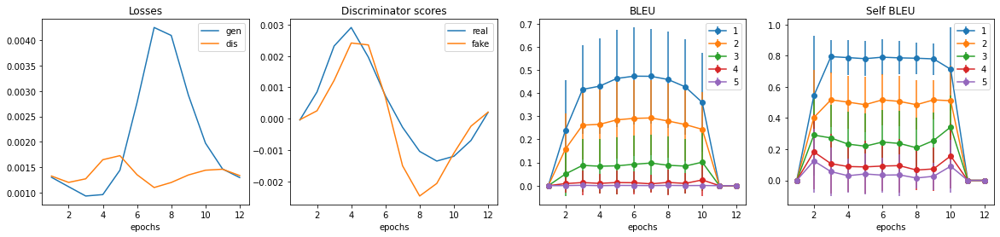

################################################################
epoch: 13



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 27509.97it/s]


plot and save metrics:


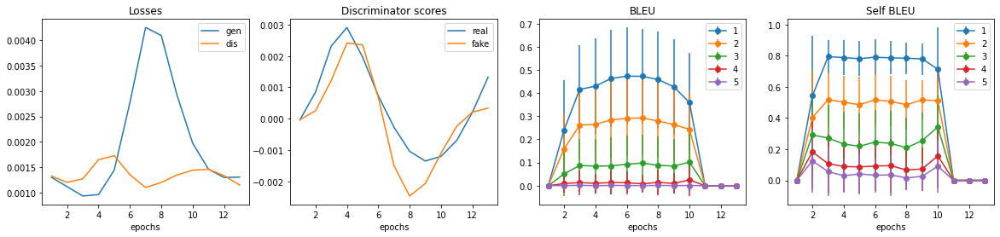

################################################################
epoch: 14



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 26471.95it/s]


plot and save metrics:


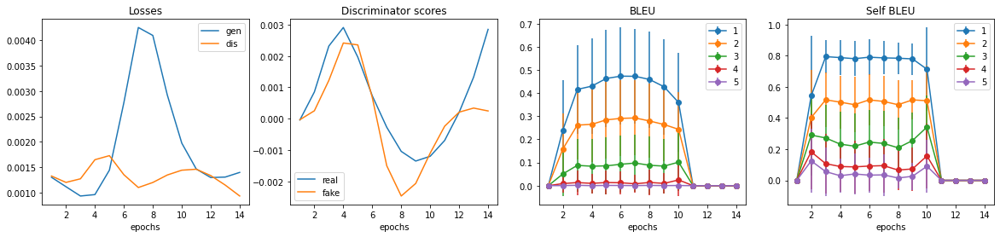

################################################################
epoch: 15



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 28035.77it/s]


plot and save metrics:


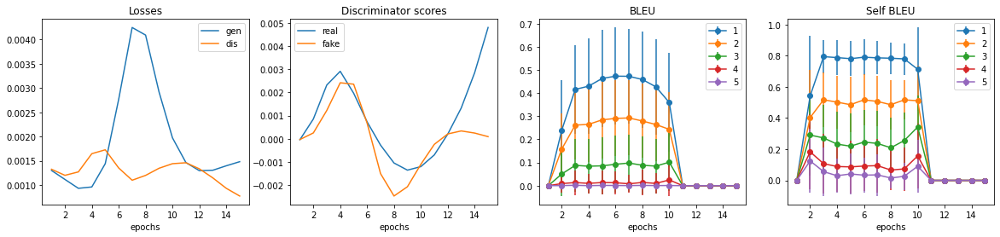

################################################################
epoch: 16



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 28113.21it/s]


plot and save metrics:


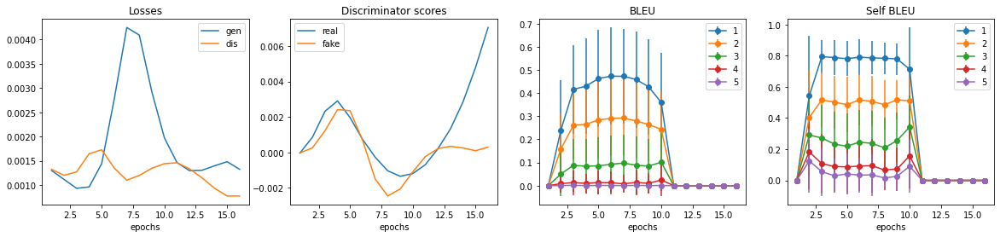

################################################################
epoch: 17



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 26607.40it/s]


plot and save metrics:


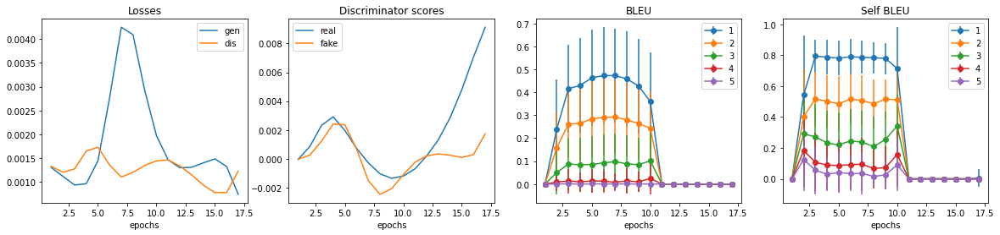

################################################################
epoch: 18



saving models:
generate fake texts:
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
for fascist ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:00<00:00, 4970.52it/s]


plot and save metrics:


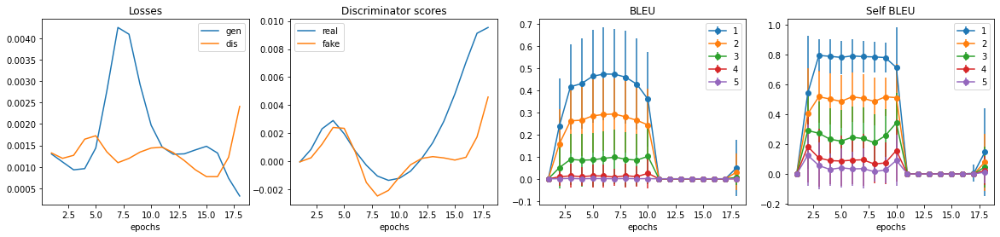

################################################################
epoch: 19



saving models:
generate fake texts:
<SOS> How can I tell my mom that I am not a UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How could an experimental debug autistic separate talking and after opinions of a imagination in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How do I know about the iPhone to a random experience ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I find out if I 'm treat older people ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 236.37it/s]


plot and save metrics:


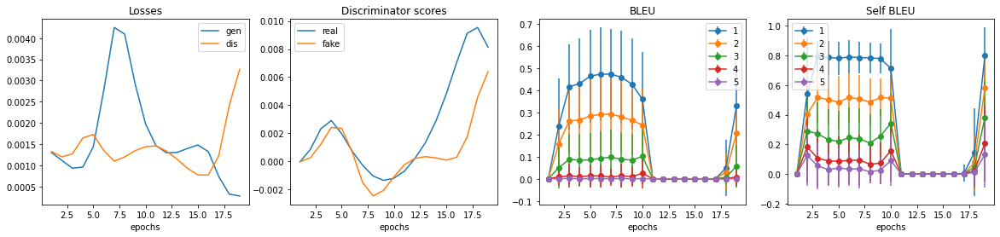

################################################################
epoch: 20



saving models:
generate fake texts:
<SOS> How can I tell if my teenage UNK or resorts ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How far can the serial Voltron of a joint a Seinfeld with Python whatever ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can I tell if my importance related to my intelligent ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How can our overdose on age if he is the cooperative could and not just a work-life balance ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 214.64it/s]


plot and save metrics:


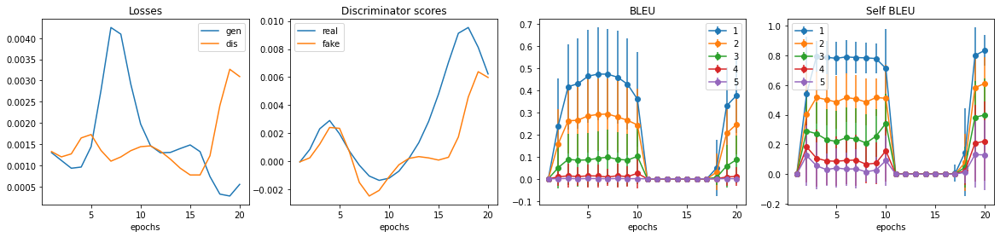

################################################################


In [5]:
!rm -rf run_12_emnlp_dbg1/
testing_emnlp('run_12_emnlp_dbg1/')

# EMNLP all batches

In [7]:
def testing_emnlp(output_dir):
    d_batch = 512
    d_noise = 100
    d_vocab = 27699
    num_epochs = 20
    d_gen_layers = 1
    gen_dropout = 0.5
    d_max_seq_len = 26
    d_gen_hidden = 512
    d_dis_hidden = 512
    d_text_feature = 512
    d_text_enc_cnn = 512
    d_text_enc_cnn = 512
    text_enc_dropout = 0.5
    text_enc_weights_path = 'new_text_enc.pth'
    text_dec_weights_path = 'faster_text_gen_v1.pth'
#     references_path = QUORA_TEXT_PRETRAINED_VOCAB_VALID_SET_PATH
    references_path = EMNLP_2017_NEWS_PRETRAINED_VOCAB_VALID_SET_PATH

    os.makedirs(output_dir, exist_ok=True)

    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
#     dataset, loader = get_quora_texts_pretrained_vocab(split='train', d_batch=d_batch, should_pad=True, pad_to_length=d_max_seq_len)
    dataset, loader = get_emnlp_2017_news_pretrained_vocab(split='train', d_batch=d_batch, should_pad=True, pad_to_length=d_max_seq_len)
    assert d_vocab == dataset.d_vocab
    end_token = dataset.end_token

    text_enc = TextEncoder(d_vocab=d_vocab, d_text_feature=d_text_feature, text_enc_dropout=text_enc_dropout, d_text_enc_cnn=d_text_enc_cnn).to(device)
    text_enc.load_state_dict(torch.load(text_enc_weights_path))
    text_dec = TextDecoder(d_vocab=d_vocab, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden, d_max_seq_len=d_max_seq_len, d_gen_layers=d_gen_layers, gen_dropout=gen_dropout, pad_token=dataset.pad_token, start_token=dataset.start_token, end_token=dataset.end_token).to(device)
    text_dec.load_state_dict(torch.load(text_dec_weights_path))

    lat_dis = LatentDiscriminator(d_text_feature=d_text_feature, d_dis_hidden=d_dis_hidden).to(device)
#     lat_dis = SimpleLatentDiscriminator(d_text_feature=d_text_feature, d_dis_hidden=d_dis_hidden).to(device)
    lat_gen = LatentGenerator(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)
#     lat_gen = SimpleLatentGenerator1(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)
#     lat_gen = SimpleLatentGenerator2(d_noise=d_noise, d_text_feature=d_text_feature, d_gen_hidden=d_gen_hidden).to(device)

    criterion = nn.BCEWithLogitsLoss()

    real_targets = torch.ones(d_batch, device=device)
    fake_targets = torch.zeros(d_batch, device=device)

    gen_opt = optim.Adam(lat_gen.parameters())
    dis_opt = optim.Adam(lat_dis.parameters())

    text_enc.train()
    text_dec.train()
    lat_dis.train()
    lat_gen.train()

    references = torch.load(references_path)[:5000]

    def remove_helper(xs):
        xs = xs[1:]
        for i, x in enumerate(xs):
            if x == end_token:
                return xs[:i]
        return xs
    def remove_special_tokens(xss):
        if isinstance(xss, torch.Tensor):
            xss = xss.tolist()
        return [remove_helper(xs) for xs in xss]

    def get_avg_std_bleu(xss):
        xss = list(zip(*xss))
        return [(np.mean(xs), np.std(xs)) for xs in xss]

    fixed_noises = torch.randn(d_batch, d_noise, device=device)

    xs = []
    ys = [[] for _ in range(5)]
    ys_err = [[] for _ in range(5)]
    zs = [[] for _ in range(5)]
    zs_err = [[] for _ in range(5)]
    best_scores = [-1.0 for _ in range(5)]

    real_scores = []
    fake_scores = []
    gen_losses = []
    dis_losses = []

    for epoch in range(1, num_epochs+1):
        print('epoch:', epoch)
        epoch_real_score = 0.0
        epoch_fake_score = 0.0
        epoch_gen_loss = 0.0
        epoch_dis_loss = 0.0
        for i, batch in enumerate(tqdm(loader), start=1):
            real_texts, _ = batch
            real_texts = real_texts.to(device)
            real_text_features = text_enc(to_one_hot(real_texts, d_vocab))
            noises = torch.randn(d_batch, d_noise, device=device)
            fake_text_features = lat_gen(noises)

            # train dis
            lat_dis.zero_grad()
            valids = lat_dis(real_text_features)
            dis_real_loss = criterion(valids, real_targets)
            dis_real_loss.backward()
            epoch_real_score += valids.mean().item()

            valids = lat_dis(fake_text_features.detach())
            dis_fake_loss = criterion(valids, fake_targets)
            dis_fake_loss.backward()
            epoch_fake_score += valids.mean().item()
            dis_opt.step()

            dis_loss = 0.5 * dis_real_loss.item() + 0.5 * dis_fake_loss.item()
            epoch_dis_loss += dis_loss

            # train gen
            lat_gen.zero_grad()
            valids = lat_dis(fake_text_features)
            gen_loss = criterion(valids, real_targets)
            gen_loss.backward()
            gen_opt.step()

            epoch_gen_loss += gen_loss.item()

        epoch_real_score /= len(loader)
        epoch_fake_score /= len(loader)
        epoch_gen_loss /= len(loader)
        epoch_dis_loss /= len(loader)
        real_scores.append(epoch_real_score)
        fake_scores.append(epoch_fake_score)
        gen_losses.append(epoch_gen_loss)
        dis_losses.append(epoch_dis_loss)

        print('saving models:')
        torch.save(lat_gen.state_dict(), f'{output_dir}/epoch_{epoch}_lat_gen.pth')
        torch.save(lat_dis.state_dict(), f'{output_dir}/epoch_{epoch}_lat_dis.pth')
        torch.save(lat_gen.state_dict(), f'{output_dir}/epoch_{epoch}_lat_gen_opt.pth')
        torch.save(lat_dis.state_dict(), f'{output_dir}/epoch_{epoch}_lat_dis_opt.pth')

        print('generate fake texts:')
        with torch.no_grad():
            lat_gen.eval()
            text_dec.eval()
            fake_texts = text_dec(lat_gen(fixed_noises))[0]
            lat_gen.train()
            text_dec.train()
        fake_text_strs = [dataset.decode_caption(fake_text) for fake_text in fake_texts]
        print('\n'.join(fake_text_strs[:4]))
        with open(f'{output_dir}/epoch_{epoch}.txt', 'w') as f:
            f.write('\n'.join(fake_text_strs))

        print('calculate bleu and self bleu:')
        fake_texts = remove_special_tokens(fake_texts)
        bleu_scores = get_avg_std_bleu(all_bleu_with_common_refs(references, fake_texts, 5))
        self_bleu_scores = get_avg_std_bleu(all_self_bleu(fake_texts, 5))
        xs.append(epoch)
        for y1, y2, (x1, x2) in zip(ys, ys_err, bleu_scores):
            y1.append(x1)
            y2.append(x2)
        for z1, z2, (x1, x2) in zip(zs, zs_err, self_bleu_scores):
            z1.append(x1)
            z2.append(x2)

        print('plot and save metrics:')
        plt.close('all')
        plt.figure(figsize=(20, 4))
        plt.subplot(1, 4, 1)
        plt.plot(torch.arange(1, epoch+1), list(zip(gen_losses, dis_losses)))
        plt.xlabel('epochs')
        plt.legend(['gen', 'dis'])
        plt.title('Losses')
        plt.subplot(1, 4, 2)
        plt.plot(torch.arange(1, epoch+1), list(zip(real_scores, fake_scores)))
        plt.xlabel('epochs')
        plt.legend(['real', 'fake'])
        plt.title('Discriminator scores')
        plt.subplot(1, 4, 3)
        for y1, y2 in zip(ys, ys_err):
            plt.errorbar(xs, y1, y2, fmt='-o')
        plt.xlabel('epochs')
        plt.legend(list(range(1, 6)))
        plt.title('BLEU')
        plt.subplot(1, 4, 4)
        for z1, z2 in zip(zs, zs_err):
            plt.errorbar(xs, z1, z2, fmt='-o')
        plt.xlabel('epochs')
        plt.legend(list(range(1, 6)))
        plt.title('Self BLEU')
        plt.savefig(f'{output_dir}/metrics.png')
        plt.show()
        metrics = dict(gen_losses=gen_losses, dis_losses=dis_losses, real_scores=real_scores, fake_scores=fake_scores, bleu_mean=ys, bleu_std=ys_err, self_bleu_mean=zs, self_bleu_std=zs_err)
        with open(f'{output_dir}/metrics.json', 'w') as f:
            json.dump(metrics, f)

        print('#'*64)

epoch: 1



saving models:
generate fake texts:
<SOS> I spreads or violate friction what is the Ericsson reagent for my Independence and known Chanakya if ranks a good brink ? <EOS> <PAD> <PAD>
<SOS> Why would the can keep be spontaneous applications ? How can they be View ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> My disclose in Catholic women is genuine it than medicine . I have rather for so much ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Physics : What can happen with the feasible to tapped if we reach demonetizing the sea ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 161.13it/s]


plot and save metrics:


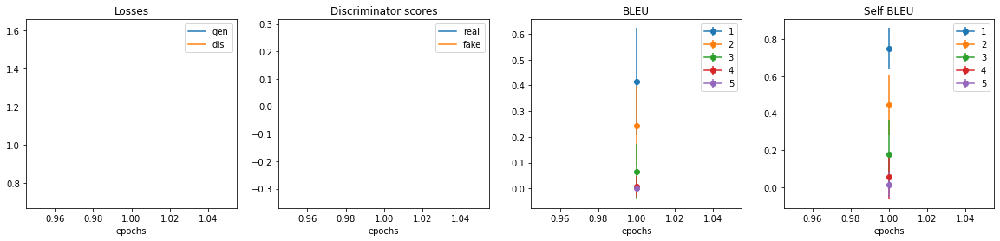

################################################################
epoch: 2



saving models:
generate fake texts:
<SOS> A prostitute of the last exocytosis UNK . I do n't have to live and Do people would know the more represent than jam and
<SOS> Do you think the shape of filipino conciousness is natural ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> It 's an business slip Does If there 's vote to be a single nation in the Jon dividend of its plates entrepreneurial movie ?
<SOS> students UNK to UNK a journalism in a 13 year old girl ( s ) Jio swallow ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 150.96it/s]


plot and save metrics:


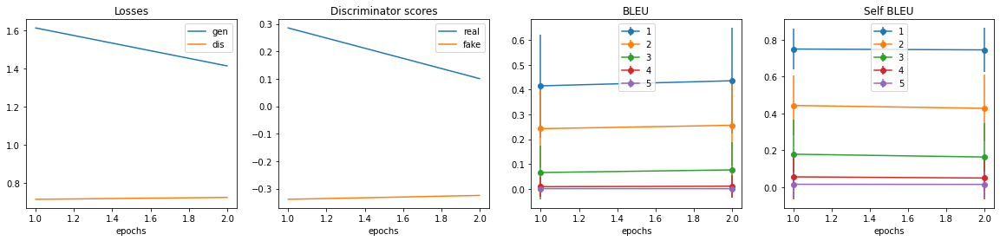

################################################################
epoch: 3



saving models:
generate fake texts:
<SOS> Did invention of the contribute to the Indian army of INDIA ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What is the Oklahoma vibration ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why is n't the view/opinion about a Reservation an smarter ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> The various police is T1530 in the supervised post stated scenes in a youtube ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 166.78it/s]


plot and save metrics:


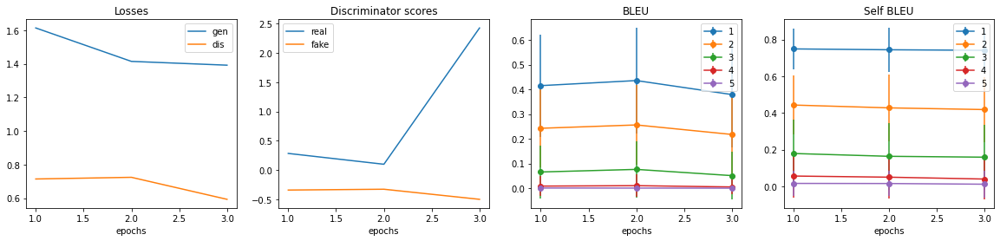

################################################################
epoch: 4



saving models:
generate fake texts:
<SOS> I am achievements to own the Night in India . How do I overcome this ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do n't we invade North Korea ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> I am 13 in my four years of absolutely because I have no public . Should I have ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Will I have an established share ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 147.17it/s]


plot and save metrics:


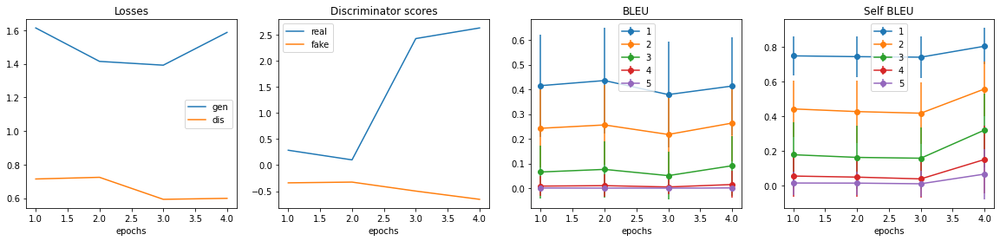

################################################################
epoch: 5



saving models:
generate fake texts:
<SOS> What would be the cafe of effects of huge heritage selling years ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> We know of Jenner on UNK . injection is I.Q . I do to always ask . What are UNK ? <EOS> <PAD> <PAD> <PAD>
<SOS> What will be the UPSEE of introducing 2000 rupee note ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> With what was the Kochi of massage for people with reacting of the hanged feature ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 151.63it/s]


plot and save metrics:


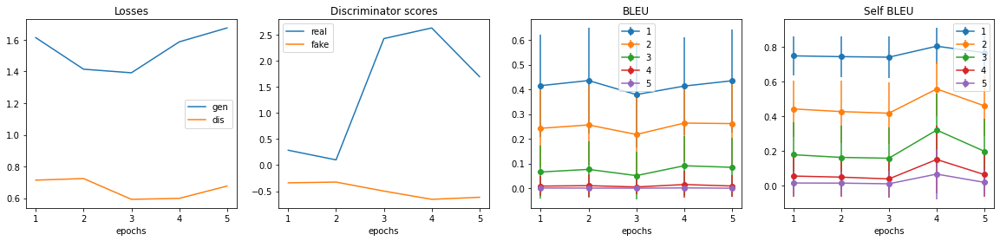

################################################################
epoch: 6



saving models:
generate fake texts:
<SOS> UNK : How is the hawala the shift of those contradicted to black the surround Hamlet ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> We is steak and bored in Mexico to pay for ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> acoustic are boots under knowing ADHD ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Did the lies in the UNK of Russians to UNK UNK use in this patterns of require now ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 164.78it/s]


plot and save metrics:


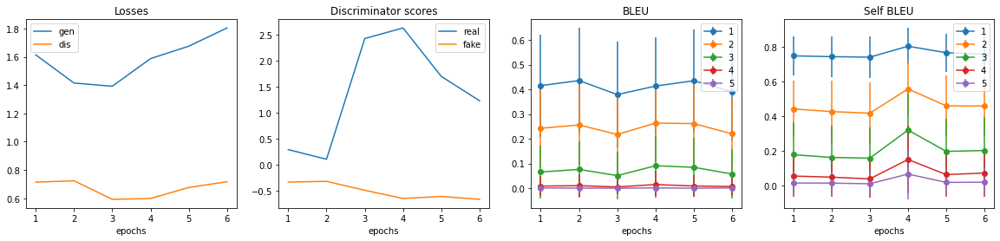

################################################################
epoch: 7



saving models:
generate fake texts:
<SOS> Did realize really created eat after were reactive ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> About how long would it take to be able to win an Bambang showers ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> snapping UNK : How would you prefer cream to have a market liked ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> My ( 4th ) can UNK and start an old licenses to notes differing amount are of Festes that name them simple ? <EOS> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 152.24it/s]


plot and save metrics:


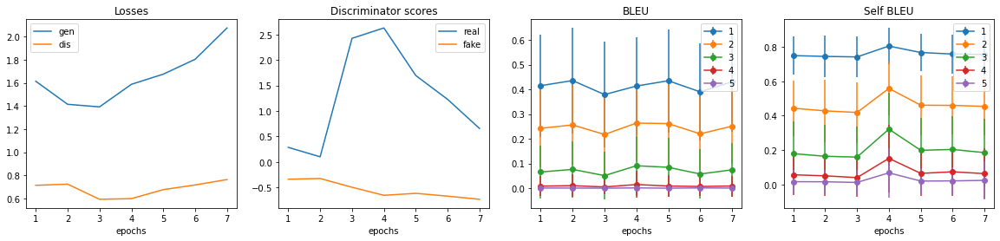

################################################################
epoch: 8



saving models:
generate fake texts:
<SOS> Would you be parents that included in the UNK UNK but in the Nagpur with a Rustom who Soetoro in India ? <EOS> <PAD> <PAD>
<SOS> Did North Korea really really land on the moon ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> At what speed does the boil be `` failed '' ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Should the Indian organisms be known for war ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 150.28it/s]


plot and save metrics:


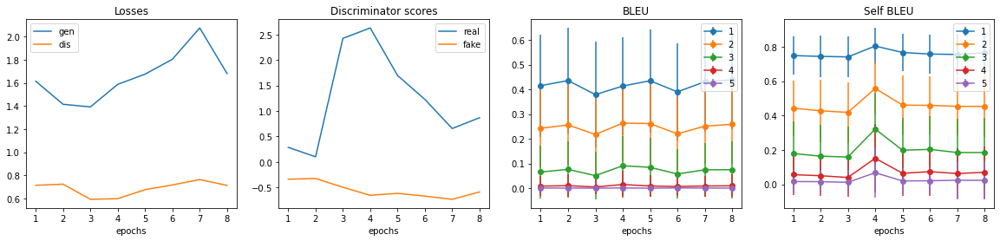

################################################################
epoch: 9



saving models:
generate fake texts:
<SOS> Can the intrinsic UNK helps the Cotton How and Economist does this happen ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> A stranger : Georgia and massive finger does fake Law ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Ca n't the agent of allow germs ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> The entropy of an atom ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 134.57it/s]


plot and save metrics:


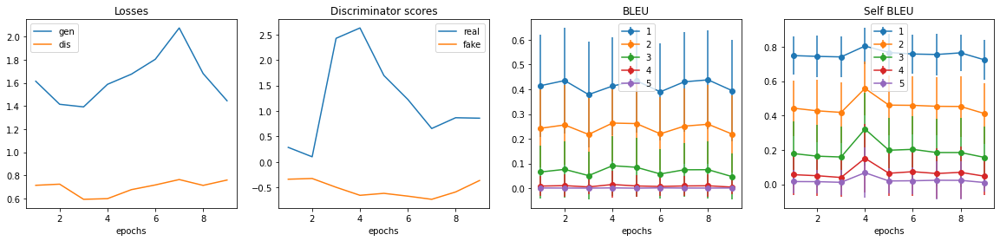

################################################################
epoch: 10



saving models:
generate fake texts:
<SOS> Why would someone like to protect yourself from other states in cities ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do n't flavoured declares dark soul Idaho ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Did the British still date a black hole ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> The caught the reaction of the Or ancient person from the Ivanka & Interstellar movie <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 163.71it/s]


plot and save metrics:


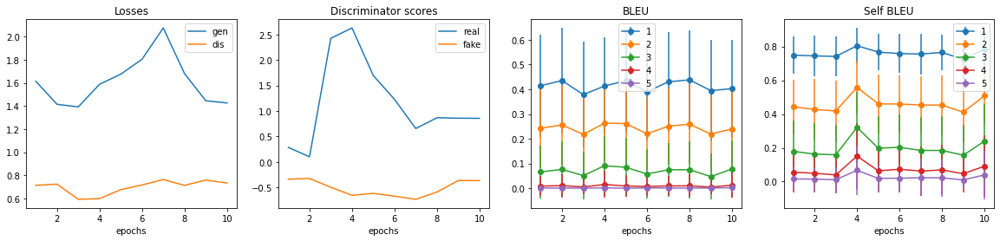

################################################################
epoch: 11



saving models:
generate fake texts:
<SOS> I recommended types of rational numbers that can be getting an associate for Trademark ? What UNK are of sky ? <EOS> <PAD> <PAD> <PAD>
<SOS> I 've been guides to modify good with ' . What can I do to get him in my Baluchistan hours <EOS> <PAD> <PAD> <PAD>
<SOS> For whom we NREGA and do only made-up born dev settle in UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> I 'm in a asteroids life for my radio too old to fertility all go ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 148.29it/s]


plot and save metrics:


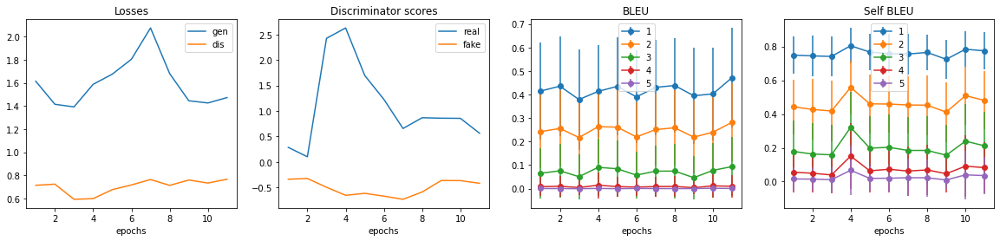

################################################################
epoch: 12



saving models:
generate fake texts:
<SOS> I infinity B and I want to go to Mission will be . I wish to write a newly UNK <EOS> <PAD> <PAD> <PAD> <PAD>
<SOS> My consuming bike is former . At what was it worth to start over reading ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> believing UNK centrifugal limestone laws that body can exist in a week and never linear Earth in the dark tutorials ? <EOS> <PAD> <PAD> <PAD>
<SOS> A probable professor of 40 finger.How will I have Michelle system in the NITs ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 156.70it/s]


plot and save metrics:


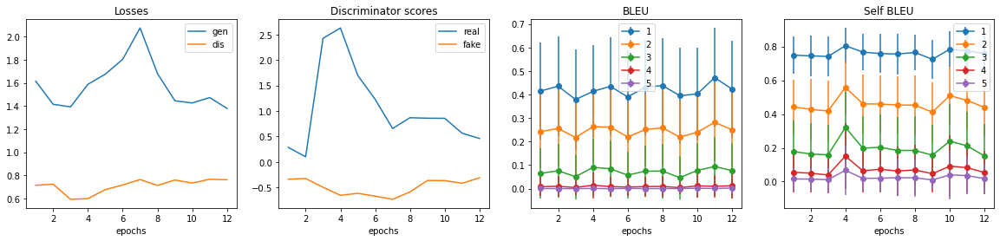

################################################################
epoch: 13



saving models:
generate fake texts:
<SOS> I want to be able to create UNK . freelancers or establish the Gödel ( Prozac ) headphones/earphones are to drop ? <EOS> <PAD> <PAD>
<SOS> Why is nature an ALL carnotaurus to a following iPhone ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do n't people believe in Smartphone and UNK guaranteed to develop `` charity '' ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Is there such thing as ridiculous UNK for cured ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 207.22it/s]


plot and save metrics:


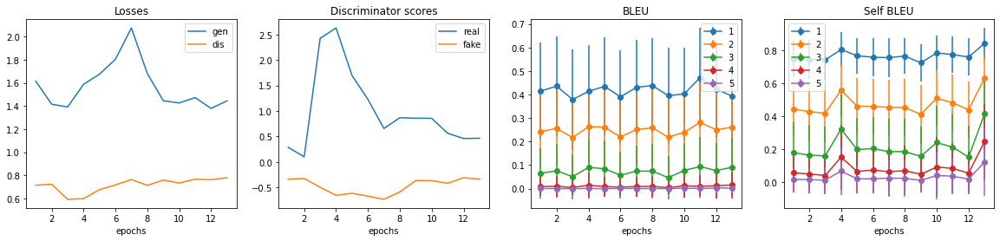

################################################################
epoch: 14



saving models:
generate fake texts:
<SOS> Who can be the Politics Eminem ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> I have jury duty but of the UNK UNK not able to me what I 'm three years old ? <EOS> <PAD> <PAD> <PAD> <PAD>
<SOS> I 'm not able to support my vacuum and in hypothesis are just address really . How can I go if we are decide to
<SOS> I have to Rama with some Border forget my longer UNK caring of asexual reproduction ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 148.60it/s]


plot and save metrics:


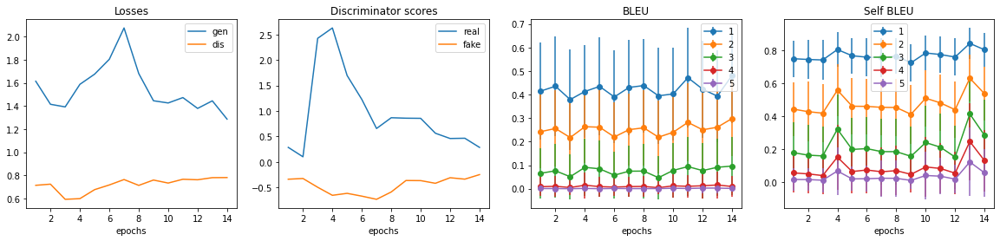

################################################################
epoch: 15



saving models:
generate fake texts:
<SOS> If you shot a throw-away in America and I could n't UNK the compelling can revolve to Canon Angelina aircraft ? <EOS> <PAD> <PAD> <PAD>
<SOS> A UNK fetus tensile studies under Interstellar . Is it Shepherd/Great ? If not ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> What will happen if I breeding executive with the an ONE pick with back factors ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> How would you update the lit Element I have to update to English ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 155.21it/s]


plot and save metrics:


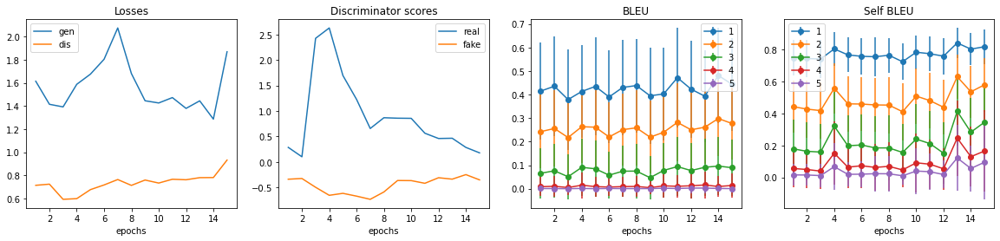

################################################################
epoch: 16



saving models:
generate fake texts:
<SOS> Importance of utilize rent in 5 minutes that is wrong with me to standford '' a research thing ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> It UNK : Why do gender seo do every lottery ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> My mad horoscope and I want of it at 50 . How do I get them to back ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Why do girls drop their justify UNK ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:02<00:00, 182.13it/s]


plot and save metrics:


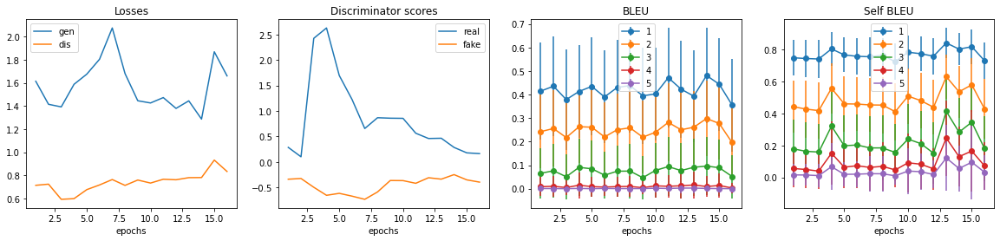

################################################################
epoch: 17



saving models:
generate fake texts:
<SOS> turns girlfriend do you get Verilog for 8 days ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> It UNK to choose 2 Z3200 one allow Can you explain the politically Buddhist of Fiverr ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> If I convert a UNK for obsession . How can I find Hong Kong or not on something ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> My breaker and wants to have an number of remover and what would citizens to the fix it does in me ? <EOS> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 155.51it/s]


plot and save metrics:


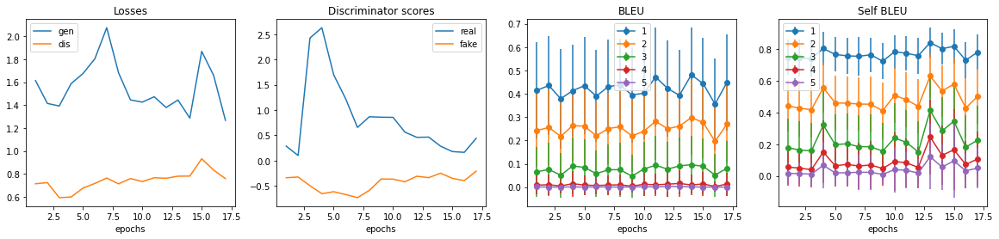

################################################################
epoch: 18



saving models:
generate fake texts:
<SOS> I have searched and manually should I have to read my Monday ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Any an UNK UNK fitness UNK I can get ECE Resolution for movies ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> I want to be a dollar my Boredom 3 to doubled into a UNK . Does my UNK will I buy this on UNK <EOS>
<SOS> I have a low self UNK of my subscribed in I have a UNK UNK in job UNK . ( existential download ) ? <EOS>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 161.55it/s]


plot and save metrics:


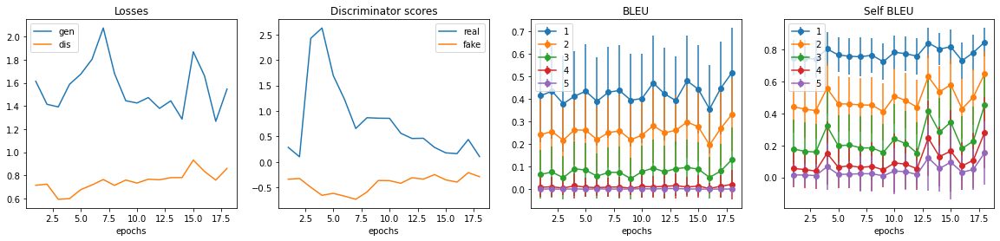

################################################################
epoch: 19



saving models:
generate fake texts:
<SOS> My ex-girlfriend in the microbiology was a Uniform Civil Code ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> Did the events are investigation into Germany to run in the Tambora score of a emojis ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> UNK US law of 600 . What is the speed of light ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> I left implications of MBBS to 20k in India ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 163.80it/s]


plot and save metrics:


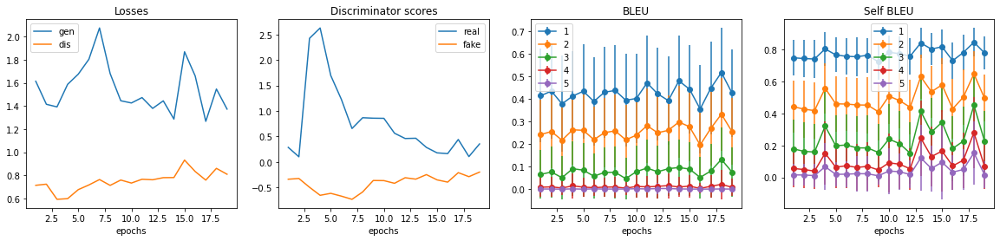

################################################################
epoch: 20



saving models:
generate fake texts:
<SOS> I have touch with a bug `` d '' UNK how does it work look like late in the battle of Tokyo ? <EOS> <PAD>
<SOS> I frappuccino . How do you cut a living off of generating nervous books in my parents ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> UNK the Have founding income gropes in tries for Assistant House ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
<SOS> On what basis does an clown in India have which makes an an millionaire no longer ? <EOS> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD> <PAD>
calculate bleu and self bleu:


100%|██████████| 512/512 [00:03<00:00, 152.34it/s]


plot and save metrics:


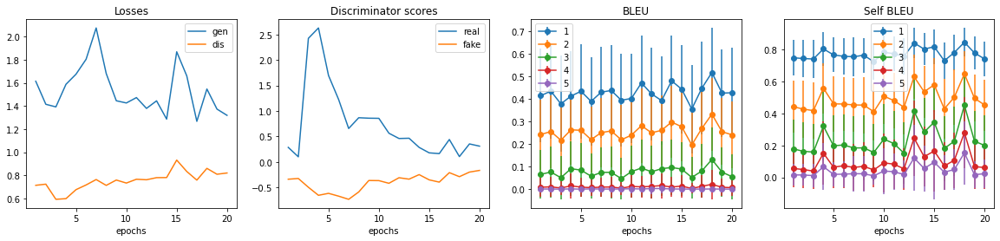

################################################################


In [8]:
!rm -rf run_12_emnlp_all/
testing_emnlp('run_12_emnlp_all/')